## Setup - imports, time, parameters, size function

In [1]:
runno = '7479'
from invisible_cities.database import load_db
DataSiPM    = load_db.DataSiPM('new', run_number = int(runno))

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import json
from sys import getsizeof

In [3]:
import sys

def get_size(obj, seen=None,):
    """Recursively finds size of objects"""
    size = sys.getsizeof(obj)
    if seen is None:
        seen = set()
    obj_id = id(obj)
    if obj_id in seen:
        return 0
    # Important mark as seen *before* entering recursion to gracefully handle
    # self-referential objects
    seen.add(obj_id)
    if isinstance(obj, dict):
        size += sum([get_size(v, seen) for v in obj.values()])
        size += sum([get_size(k, seen) for k in obj.keys()])
    elif hasattr(obj, '__dict__'):
        size += get_size(obj.__dict__, seen)
    elif hasattr(obj, '__iter__') and not isinstance(obj, (str, bytes, bytearray)):
        size += sum([get_size(i, seen) for i in obj])
    return size

In [4]:
from time import time as time
t0 = time()
nfiles = 100
noise_bound = 250
ns_per_sample = 25
window_min = 100
window_max = 500
nsipms = 1792
dwindow = 5

In [5]:
nwindow = int((window_min - window_max) / dwindow)

In [6]:
# Fit functions

def gauss(x, A, m, s):
    if s < 0:
        return 10000000000000000
    return A*np.exp(-(x-m)**2 / (2*s**2))

def gauss2(x, A, m, v): 
    if v <= 0:
        return 1e10
    return A*np.exp(-(x-m)**2 / (2*v))

def offset_gauss(x, A, m, v, C):
    return C + A*np.exp(-(x-m)**2 / (2*v))

def const(x, a):
    return a + 0*x

def line(x, m, b):
    return m*x + b

from scipy.optimize import curve_fit

def exp_dt(sig):
    """
    expected drift distance  as a function of sigma of the S2 signal (Zrms from kdst 2018 version)
    parameters from the ad-hoc fit
    """
    p = [-10.00667732,  52.1855012,   12.68195726,  58.66322846, -20.11819297]
    dt = p[0] * sig**4 + p[1] * sig**3 + p[2]*sig**2 + p[3]*sig + p[4]
    return dt

In [7]:
# variable_window_7479_json_wsipms_20201207
jsondir = '/Volumes/NEXT_data/IC_Data/krThesis/sliding_window_events/variable_window_'+runno+'_json_wsipms_20201207/'
# jsondir = '/Volumes/NEXT_data/IC_Data/krThesis/sliding_window_events/variable_window_'+runno+'_json_updated_20201202/'

if nfiles > 0:
    all_jsons = [jsondir+file for file in os.listdir(jsondir)][:nfiles]
else:
    all_jsons = [jsondir+file for file in os.listdir(jsondir)]

In [8]:
all_data = {
    'events_window_maxX' : [],
    'events_window_maxY' : [],
    'events_window_rms' : [],
    'events_window_width' : [],
    'events_window_energy' : [],
    'events_window_charge' : [],
    'events_window_Zrms' : [],
    'events_window_Zgauss' : [],
    'events_window_Wrms' : [],
    'events_window_Wgauss' : [],
    'events_window_GaussOffset' : [],
    'events_prewindow_sums' : [],
    'events_sumwf' : [],
    'events_times' : [],
    'event_numbers' : [],
    'events_window_r2' : [],
    'events_X_sipm_subtracted' : [],
    'events_Y_sipm_subtracted' : [],
    'events_prewindow_sum_sipms' : [],
    'events_sum_sipms' : [],
    'events_sum_sipms_subtracted' : [],
    'events_maxsipm_subtracted' : []
}

n = 0
for filename in all_jsons:
    if n % 10 == 0:
        remaining = (len(all_jsons) - n)*(time() - t0) / (n + 1)
        print(n, '...', round(time() - t0, 1), '; Remaining ~=', round(remaining,1))
    n += 1
    f = open(filename)
    new_dict = json.load(f)
    f.close()
    for k in new_dict.keys():
        if k in all_data.keys():
            all_data[k].extend(new_dict[k])
        else:
            print('I SEE A NEW PARAMETER', k)
            all_data[k] = new_dict[k]
print('DONE')

0 ... 1.6 ; Remaining ~= 158.0
10 ... 12.2 ; Remaining ~= 99.6
20 ... 21.7 ; Remaining ~= 82.7
30 ... 29.4 ; Remaining ~= 66.4
40 ... 39.6 ; Remaining ~= 58.0
50 ... 64.5 ; Remaining ~= 63.2
60 ... 74.3 ; Remaining ~= 48.7
70 ... 107.9 ; Remaining ~= 45.6
80 ... 116.2 ; Remaining ~= 28.7
90 ... 154.1 ; Remaining ~= 16.9
DONE


In [9]:
print('Checking size of data...')
for k in all_data.keys():
    print('Size of', k, '=', round(get_size(all_data[k])/1000000, 2), 'MB')

Checking size of data...
Size of events_window_maxX = 91.67 MB
Size of events_window_maxY = 91.67 MB
Size of events_window_rms = 91.22 MB
Size of events_window_width = 91.39 MB
Size of events_window_energy = 91.67 MB
Size of events_window_charge = 91.67 MB
Size of events_window_Zrms = 91.67 MB
Size of events_window_Zgauss = 91.31 MB
Size of events_window_Wrms = 91.67 MB
Size of events_window_Wgauss = 91.31 MB
Size of events_window_GaussOffset = 91.31 MB
Size of events_prewindow_sums = 1.1 MB
Size of events_sumwf = 32.25 MB
Size of events_times = 32.25 MB
Size of event_numbers = 0.54 MB
Size of events_window_r2 = 91.31 MB
Size of events_X_sipm_subtracted = 1.1 MB
Size of events_Y_sipm_subtracted = 1.1 MB
Size of events_prewindow_sum_sipms = 1955.89 MB
Size of events_sum_sipms = 1955.89 MB
Size of events_sum_sipms_subtracted = 1955.89 MB
Size of events_maxsipm_subtracted = 1.13 MB


In [10]:
events_window_maxX = np.array(all_data['events_window_maxX'])
events_window_maxY = np.array(all_data['events_window_maxY'])
events_window_rms = np.array(all_data['events_window_rms'])
events_window_width = np.array(all_data['events_window_maxX'])
events_window_energy = np.array(all_data['events_window_energy'])
events_window_charge = np.array(all_data['events_window_charge'])
events_window_Zrms = np.array(all_data['events_window_Zrms'])
events_window_Zgauss = np.array(all_data['events_window_Zgauss'])
events_sumwf = np.array(all_data['events_sumwf'])
events_times = np.array(all_data['events_times'])
events_window_Wrms = np.array(all_data['events_window_Wrms'])
events_window_Wgauss = np.array(all_data['events_window_Wgauss'])
events_window_r2 = np.array(all_data['events_window_r2'])
events_window_GaussOffset = np.array(all_data['events_window_GaussOffset'])
events_prewindow_sums = np.array(all_data['events_prewindow_sums'])

events_X_sipm_subtracted = np.array(np.array(all_data['events_X_sipm_subtracted']))
events_Y_sipm_subtracted = np.array(np.array(all_data['events_Y_sipm_subtracted']))
events_prewindow_sum_sipms = np.array(np.array(all_data['events_prewindow_sum_sipms']))
events_sum_sipms = np.array(np.array(all_data['events_sum_sipms']))
events_sum_sipms_subtracted = np.array(np.array(all_data['events_sum_sipms_subtracted']))
events_maxsipm_subtracted = np.array(np.array(all_data['events_maxsipm_subtracted']))

del all_data

In [11]:
last_GaussOffset = np.array([ window_GaussOffset[-1] for window_GaussOffset in events_window_GaussOffset ])
events_energy = np.array([ events_window_energy[e][-1] for e in range(len(events_window_energy)) ])
events_energy_subtracted = events_energy - events_prewindow_sums
events_window_cut_samples = np.arange(window_min, window_max, dwindow)
events_window_cut = events_window_cut_samples * ns_per_sample * 2
events_window_energy_norm = np.array([ [ peak / max(max(window_energy), 0.1) for peak in window_energy ] for window_energy in events_window_energy ])
events_peaks = np.array([ max(wf) for wf in events_sumwf ])

In [12]:
sigperc = 0.6827
sigl = np.percentile(events_energy[events_energy > noise_bound], 100*(0.5-sigperc/2))
med  = np.percentile(events_energy[events_energy > noise_bound], 50)
Ecutlo = med - 2 * (med - sigl)
Ecuthi = med + 2 * (med - sigl)

if Ecutlo < 500:
    noise_bound = 0
    sigl = np.percentile(events_energy[events_energy > noise_bound], 100*(0.5-sigperc/2))
    med  = np.percentile(events_energy[events_energy > noise_bound], 50)
    Ecutlo = med - 2 * (med - sigl)
    Ecuthi = med + 2 * (med - sigl)

Ecut = (Ecutlo, Ecuthi)
print(Ecut)
Emask = (events_energy > Ecut[0]) & (events_energy < Ecut[1])

(4797.760794980753, 16284.925490139223)


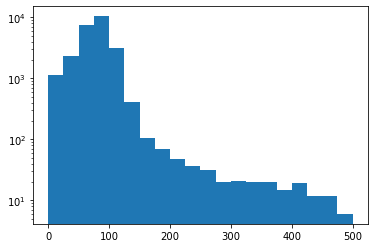

In [13]:
plt.hist(events_energy, range=(0,500), bins = 20)
plt.yscale('log')
plt.show()

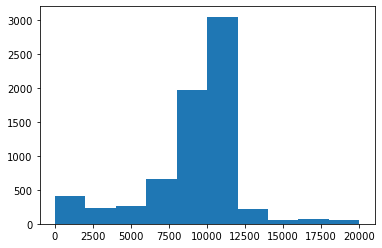

In [14]:
plt.hist(events_energy[events_energy > noise_bound], range = (0, 20000))
# plt.yscale('log')
plt.show()

In [15]:
all_energy_cutoffs_999 = np.array([2 * (window_min + dwindow * np.argmax(window_energy_norm > 0.999)) * ns_per_sample for window_energy_norm in events_window_energy_norm])
all_energy_cutoffs_99 = np.array([2 * (window_min + dwindow * np.argmax(window_energy_norm > 0.99)) * ns_per_sample for window_energy_norm in events_window_energy_norm])
all_Zrms = np.array([ np.max(window_Zrms) for window_Zrms in events_window_Zrms ])
all_Wrms = np.array([ np.max(window_Wrms) for window_Wrms in events_window_Wrms ])
all_Xs = np.array( [window_maxX[-1] for window_maxX in events_window_maxX] )
all_Ys = np.array( [window_maxY[-1] for window_maxY in events_window_maxY] )
all_R2 = np.array([ window_r2[-1] for window_r2 in events_window_r2 ])

In [16]:
print('Number of events = ', len(events_energy))

Number of events =  33895


## Setup - Determine Zgauss and Wgauss values by finding the flat line in the (W/Z)gauss vs window

Zgauss = 305.7699063978814
Energy = 4835.684364869376


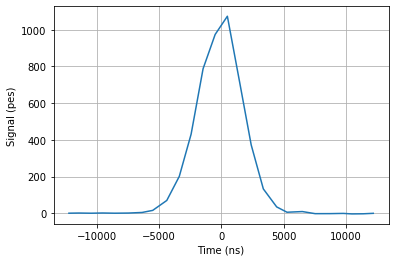

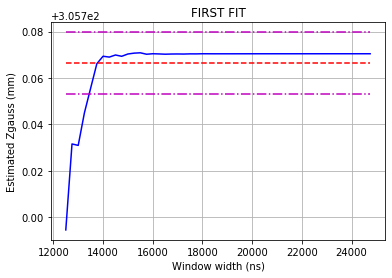

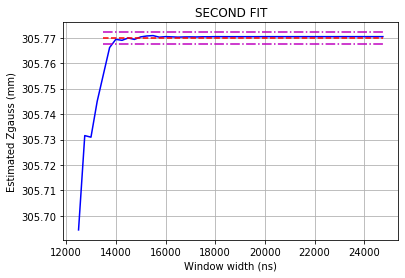

Zgauss = 534.1575610269314
Energy = 9169.804876118167


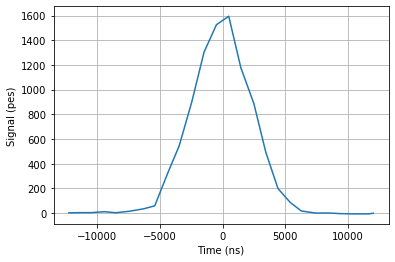

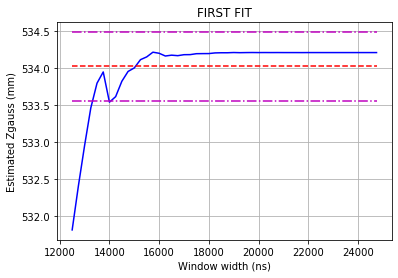

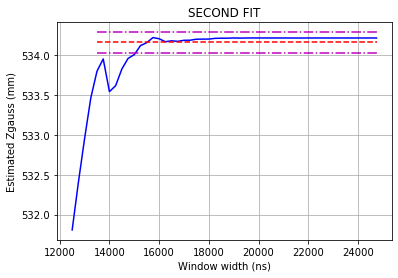

Zgauss = 409.6420675690867
Energy = 8439.294384255873


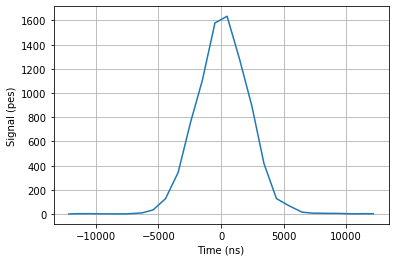

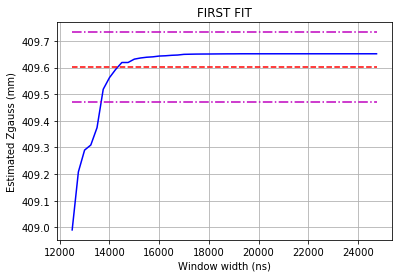

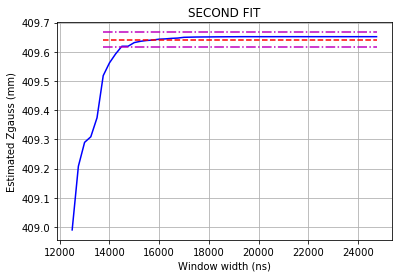

Zgauss = 557.8568060351015
Energy = 7360.169016025853


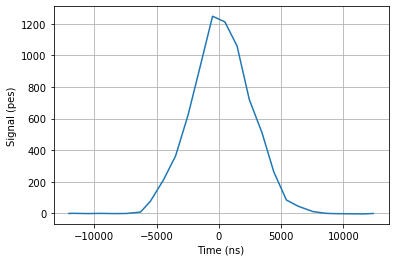

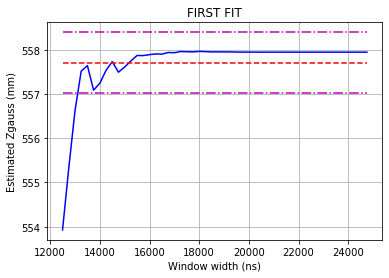

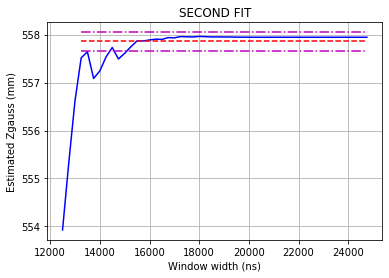

Zgauss = 507.37670910633557
Energy = 10822.962959900467


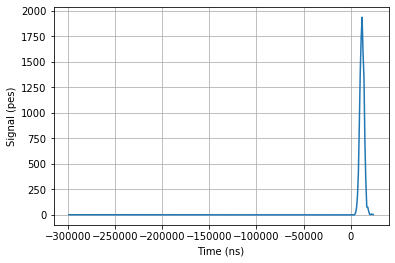

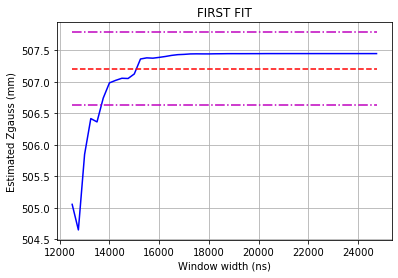

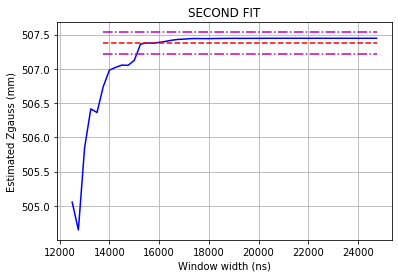

Zgauss = -20.118192786781663
Energy = 11288.142143809677


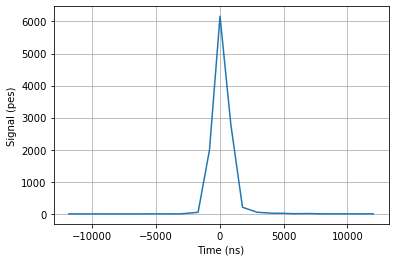

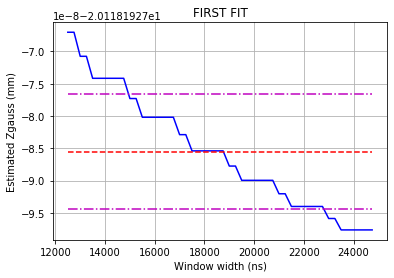

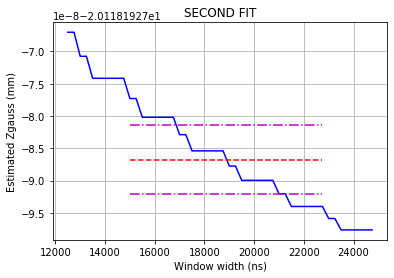

Zgauss = 137.80899516329873
Energy = 11377.05799986643


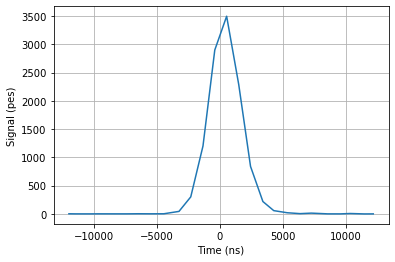

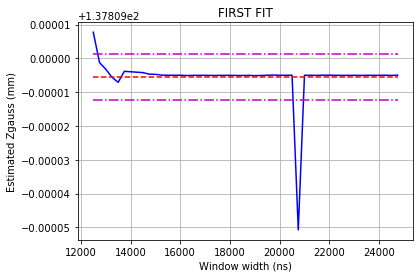

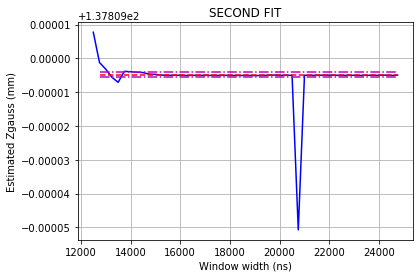

Zgauss = -20.118192784631603
Energy = 8805.160338642023


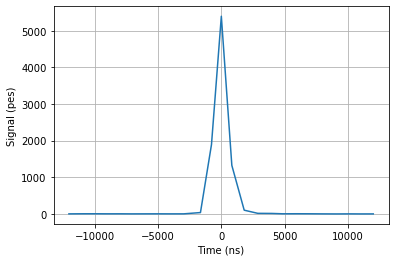

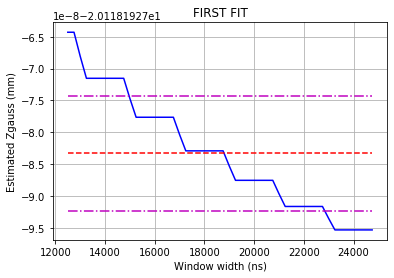

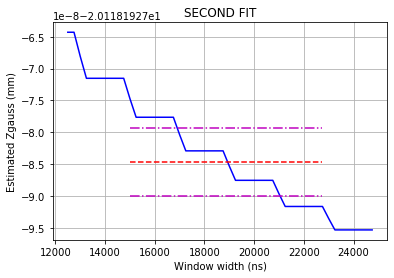

Zgauss = 458.0236576071576
Energy = 7619.120842821707


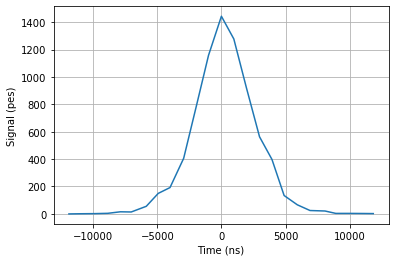

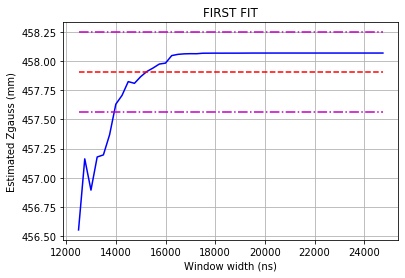

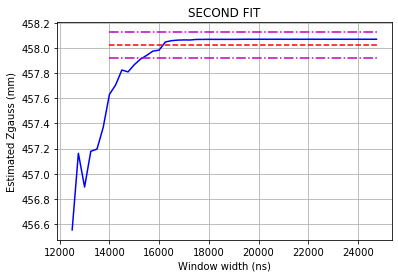

Zgauss = 592.747942140545
Energy = 10792.337130439828


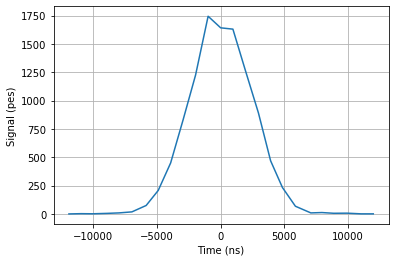

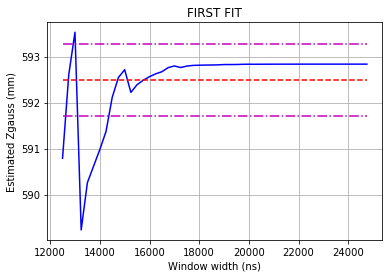

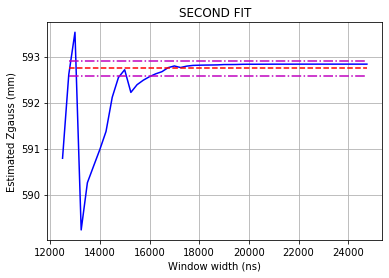

Nasty events:  []


In [17]:
all_Zgauss = []
nasty_events = []

maxshow = 10
shown = 0
for ievt in range(len(events_window_Zgauss)):    
    
    step = 0
    nasty = False
    
    try:

        # First iteration of fit
        long_window_cut = events_window_cut > events_window_cut[-1] / 2
        xdata = events_window_cut[long_window_cut]
        ydata = events_window_Zgauss[ievt][long_window_cut]
        popt, pcov = curve_fit(const, xdata, ydata, p0 = np.mean(ydata))

        step = 1
        fitdata = const(xdata, *popt)
        stdev = np.std(ydata)
        errors = (fitdata - stdev, fitdata + stdev)

        stdev_mask = (ydata > errors[0]) & (ydata < errors[1])

        # Second iteration of fit, without outliers
        step = 2
        xdata2 = xdata[stdev_mask]
        ydata2 = ydata[stdev_mask]
        popt, pcov = curve_fit(const, xdata2, ydata2, p0 = np.mean(ydata))

        step = 3
        fitdata2 = const(xdata2, *popt)
        stdev2 = np.std(ydata2)
        errors2 = (fitdata2 - stdev2, fitdata2 + stdev2)

        step = 4
        Zgauss = popt[0]
        all_Zgauss.append(Zgauss)
                
        if shown < maxshow and Emask[ievt]:
            shown += 1

            print('Zgauss =', Zgauss)
            print('Energy =', events_energy[ievt])
            
            step = 5
            # Plot the waveform
            plt.xlabel('Time (ns)')
            plt.ylabel('Signal (pes)')
            plt.plot(events_times[ievt] - np.mean(events_times[ievt]), events_sumwf[ievt])
            plt.grid(True)
            plt.show()

            step = 6
            # Plot the first fit curve
            plt.plot(xdata, ydata, color='b')
            plt.plot(xdata, fitdata, '--', color='r')
            plt.plot(xdata, errors[0], '-.', color='m')
            plt.plot(xdata, errors[1], '-.', color='m')
            plt.xlabel('Window width (ns)')
            plt.ylabel('Estimated Zgauss (mm)')
            plt.title('FIRST FIT')
            plt.grid(True)
            plt.show()

            step = 7
            # Plot the second fit curve
            plt.plot(xdata, ydata, color='b')
            plt.plot(xdata2, fitdata2, '--', color='r')
            plt.plot(xdata2, errors2[0], '-.', color='m')
            plt.plot(xdata2, errors2[1], '-.', color='m')
            plt.xlabel('Window width (ns)')
            plt.ylabel('Estimated Zgauss (mm)')
            plt.title('SECOND FIT')
            plt.grid(True)
            plt.show()

    except:
        
        Zgauss = 0
        all_Zgauss.append(Zgauss)
        nasty = True
        
        if Emask[ievt] and shown < maxshow:
            shown += 1
            print('You might have an issue with event', ievt, ': it is big, but cannot fit a Z value.')
            nasty_events.append(ievt)
            print('Failed on step', step)
            
            # Plot the waveform
            plt.xlabel('Time (ns)')
            plt.ylabel('Signal (pes)')
            plt.plot(events_times[ievt] - np.mean(events_times[ievt]), events_sumwf[ievt])
            plt.grid(True)
            plt.show()
            
            long_window_cut = events_window_cut > events_window_cut[-1] / 2
            xdata = events_window_cut[long_window_cut]
            ydata = events_window_Zgauss[ievt][long_window_cut]

            # Plot the first fit curve
            plt.plot(xdata, ydata, color='b')
            plt.xlabel('Window width (ns)')
            plt.ylabel('Estimated Zgauss (mm)')
            plt.grid(True)
            plt.show()

    
all_Zgauss = np.array(all_Zgauss)
print('Nasty events: ', nasty_events)

In [18]:
print('Current time =', round((time() - t0)/60, 1), 'm')

Current time = 13.1 m


Wgauss = 4035.448669282815
Energy = 10251.947097202621
iEvt   = 12136


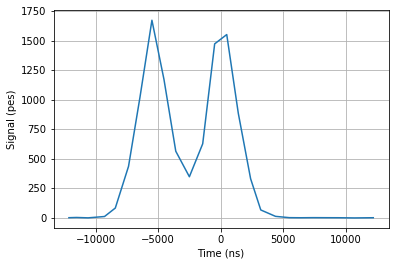

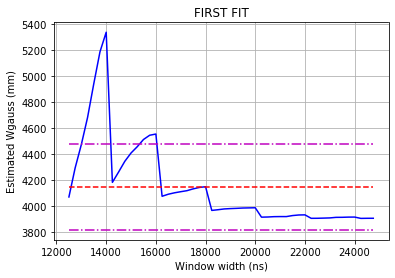

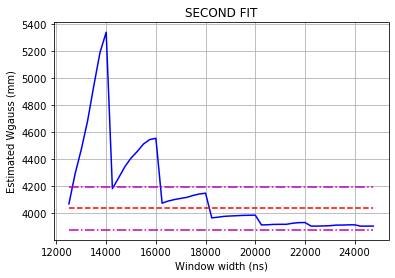

Wgauss = 4470.5006195002
Energy = 12333.968340777436
iEvt   = 28816


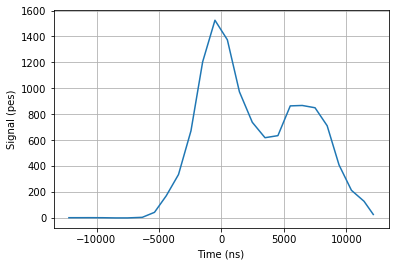

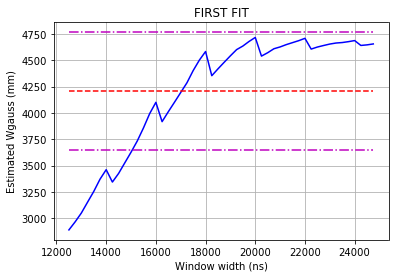

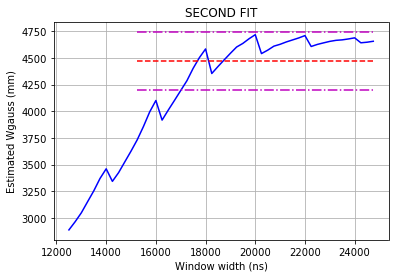

Wgauss = 6004.66768121283
Energy = 14188.667724634332
iEvt   = 30958


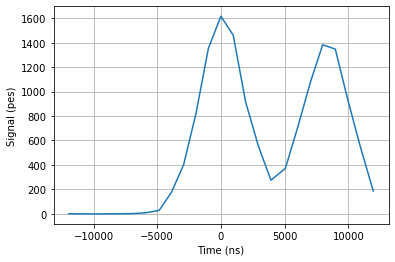

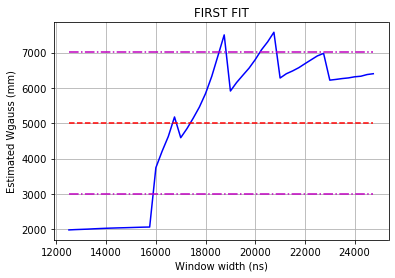

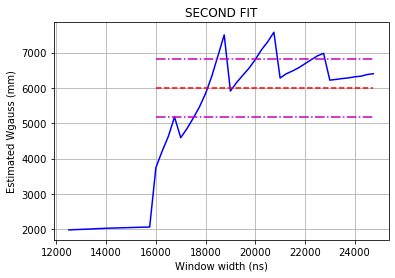

Nasty events:  []


In [19]:
all_Wgauss = []
nasty_events_W = []
functionality_cutoff = 2293.8670244413365

maxshow = 10
shown = 0
for ievt in range(len(events_window_Wgauss)):    
    
    nasty = False
    
    try:

        # First iteration of fit
        long_window_cut = events_window_cut > events_window_cut[-1] / 2
        xdata = events_window_cut[long_window_cut]
        ydata = events_window_Wgauss[ievt][long_window_cut]
        popt, pcov = curve_fit(const, xdata, ydata, p0 = np.mean(ydata))

        fitdata = const(xdata, *popt)
        stdev = np.std(ydata)
        errors = (fitdata - stdev, fitdata + stdev)

        stdev_mask = (ydata > errors[0]) & (ydata < errors[1])

        # Second iteration of fit, without outliers

        xdata2 = xdata[stdev_mask]
        ydata2 = ydata[stdev_mask]
        popt, pcov = curve_fit(const, xdata2, ydata2, p0 = np.mean(ydata))

        fitdata2 = const(xdata2, *popt)
        stdev2 = np.std(ydata2)
        errors2 = (fitdata2 - stdev2, fitdata2 + stdev2)

        Wgauss = popt[0]
        all_Wgauss.append(Wgauss)
        
        if (shown < maxshow and Emask[ievt] and Wgauss > 4000):
                        
            shown += 1
            
            print('Wgauss =', Wgauss)
            print('Energy =', events_energy[ievt])
            print('iEvt   =', ievt)
            
            # Plot the waveform
            plt.xlabel('Time (ns)')
            plt.ylabel('Signal (pes)')
            plt.plot(events_times[ievt] - np.mean(events_times[ievt]), events_sumwf[ievt])
            plt.grid(True)
            plt.show()

            # Plot the first fit
            plt.plot(xdata, ydata, color='b')
            plt.plot(xdata, fitdata, '--', color='r')
            plt.plot(xdata, errors[0], '-.', color='m')
            plt.plot(xdata, errors[1], '-.', color='m')
            plt.xlabel('Window width (ns)')
            plt.ylabel('Estimated Wgauss (mm)')
            plt.title('FIRST FIT')
            plt.grid(True)
            plt.show()

            # Plot the second fit
            plt.plot(xdata, ydata, color='b')
            plt.plot(xdata2, fitdata2, '--', color='r')
            plt.plot(xdata2, errors2[0], '-.', color='m')
            plt.plot(xdata2, errors2[1], '-.', color='m')
            plt.xlabel('Window width (ns)')
            plt.ylabel('Estimated Wgauss (mm)')
            plt.title('SECOND FIT')
            plt.grid(True)
            plt.show()    
        
    except:
        
        Wgauss = 0
        all_Wgauss.append(Wgauss)
        nasty = True
        
        if Emask[ievt]:
            print('You might have an issue with event', ievt, ': it is big, but cannot fit a Z value.')
            nasty_events_W.append(ievt)
    
all_Wgauss = np.array(all_Wgauss)
good_W = all_Wgauss > 0
print('Nasty events: ', nasty_events_W)

In [20]:
print('Current time =', round((time() - t0)/60, 1), 'm')

Current time = 13.6 m


## Examine fit baseline offset, prewindow sum distributions

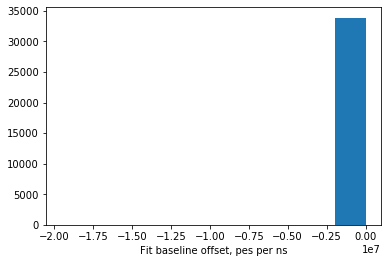

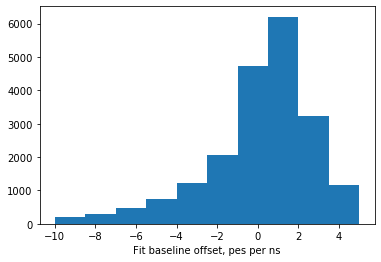

In [21]:
plt.hist(last_GaussOffset)
plt.xlabel('Fit baseline offset, pes per ns')
plt.show()

plt.hist(last_GaussOffset, range=(-10, 5))
plt.xlabel('Fit baseline offset, pes per ns')
plt.show()

In [22]:
# xdata = (h[1][:-1] + h[1][1:]) / 2
# ydata = h[0]

# var0 = 100**2
# mean0 = 0
# amp0 = max(ydata)

# popt,  pcov  = curve_fit(gauss2, xdata, ydata, p0 = (amp0, mean0, var0))
# amp, mean, var = popt

# print('Mean =', mean)
# print('Std  =', var**0.5)

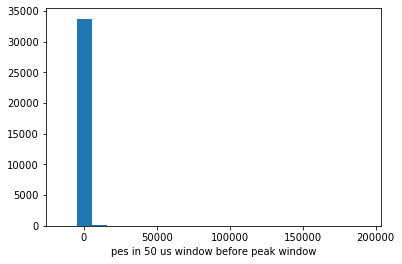

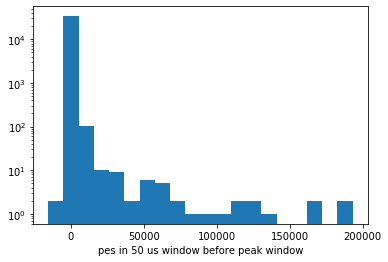

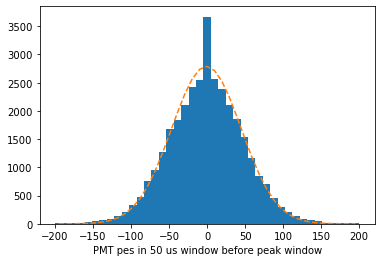

Allowed prewindow range = (-160.65590882873587, 158.80340796364285)


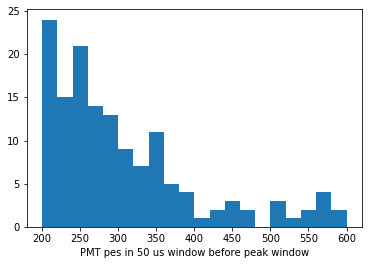

In [23]:
plt.hist(events_prewindow_sums, bins = 20)
plt.xlabel('pes in 50 us window before peak window')
plt.show()

plt.hist(events_prewindow_sums, bins = 20)
plt.xlabel('pes in 50 us window before peak window')
plt.yscale('log')
plt.show()

# Figure out the appropriate noise range from a Gaussian fit. Establish prewindow mask.
hnoise = plt.hist(events_prewindow_sums, range=(-200,200), bins = 41)
xdata = (hnoise[1][:-1] + hnoise[1][1:]) / 2
ydata = hnoise[0]

var0 = 100**2
mean0 = 0
amp0 = max(ydata)

popt,  pcov  = curve_fit(gauss2, xdata, ydata, p0 = (amp0, mean0, var0))
amp, mean, var = popt

plt.plot(xdata, gauss2(xdata, *popt), '--')
plt.xlabel('PMT pes in 50 us window before peak window')
plt.show()
allowed_prewindow_range = (mean - 3.5 * (var**0.5), mean + 3.5 * (var**0.5))
print('Allowed prewindow range =', allowed_prewindow_range)
prewindow_mask = (events_prewindow_sums > allowed_prewindow_range[0]) & (events_prewindow_sums < allowed_prewindow_range[1])

# Show upper small end of noise
plt.hist(events_prewindow_sums, range=(200,600), bins = 20)
plt.xlabel('PMT pes in 50 us window before peak window')
plt.show()

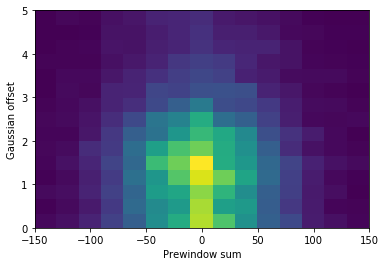

In [24]:
GoodFits = (last_GaussOffset > -1) & (last_GaussOffset < 10)
plt.hist2d(events_prewindow_sums[GoodFits], last_GaussOffset[GoodFits], bins = 15, range = ((-150, 150),(0, 5)))
plt.xlabel('Prewindow sum')
plt.xlim(-150, 150)
plt.ylabel('Gaussian offset')
plt.show()

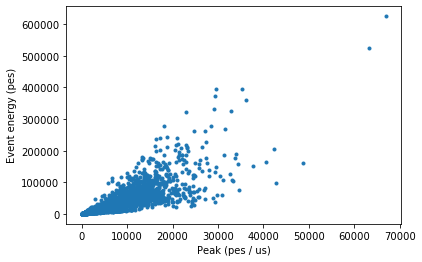

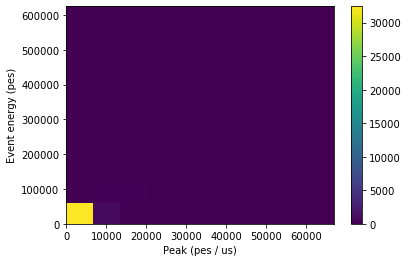

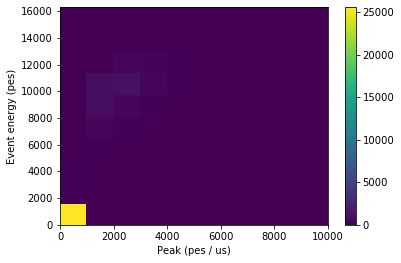

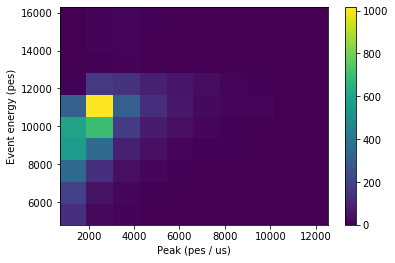

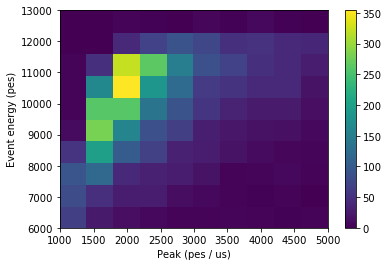

In [25]:
plt.plot(events_peaks, events_energy, '.')
plt.xlabel('Peak (pes / us)')
plt.ylabel('Event energy (pes)')
plt.show()

h = plt.hist2d(events_peaks, events_energy)
plt.xlabel('Peak (pes / us)')
plt.ylabel('Event energy (pes)')
plt.colorbar(h[3])
plt.show()

h = plt.hist2d(events_peaks, events_energy, range = ((0,10000),(0, Ecut[1])) )
plt.xlabel('Peak (pes / us)')
plt.ylabel('Event energy (pes)')
plt.colorbar(h[3])
plt.show()

h = plt.hist2d(events_peaks[Emask], events_energy[Emask])
plt.xlabel('Peak (pes / us)')
plt.ylabel('Event energy (pes)')
plt.colorbar(h[3])
plt.show()

h = plt.hist2d(events_peaks, events_energy, range = ((1000,5000),(6000, 13000)) )
plt.xlabel('Peak (pes / us)')
plt.ylabel('Event energy (pes)')
plt.colorbar(h[3])
plt.show()

## Show some sample events

##############
EVENT NUMBER 0 ; E = 4835.7
##############


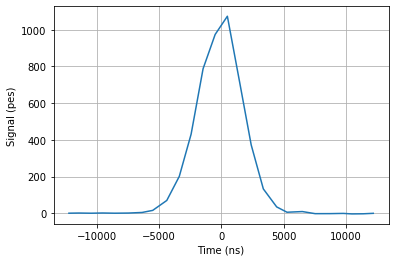

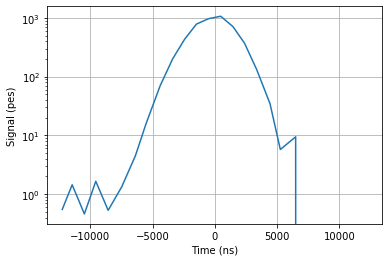

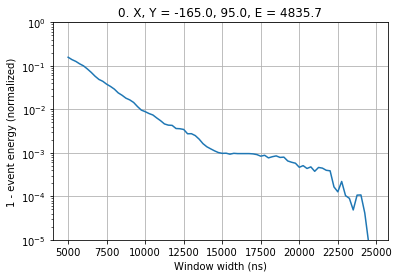

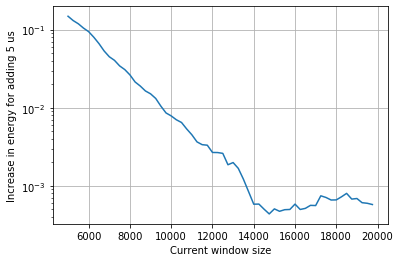

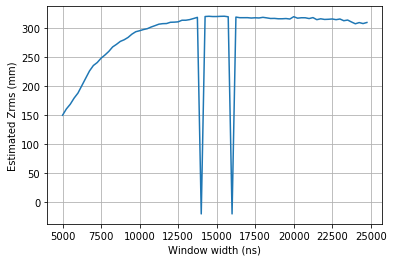

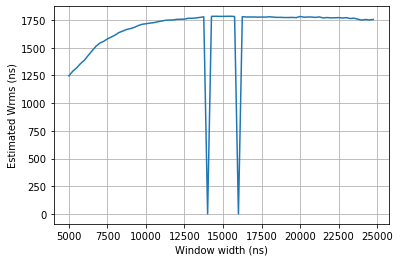

0.0
36


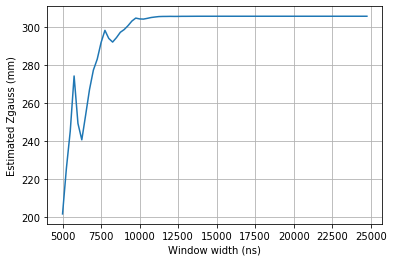

##############
EVENT NUMBER 7 ; E = 9169.8
##############


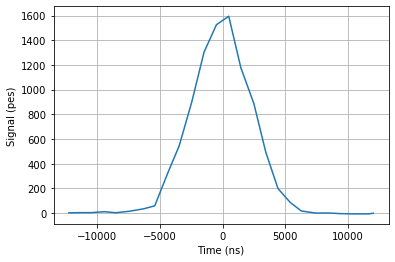

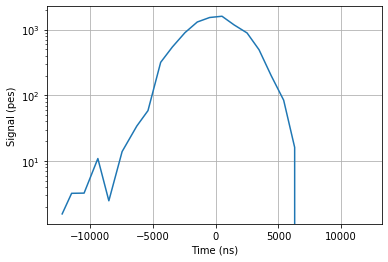

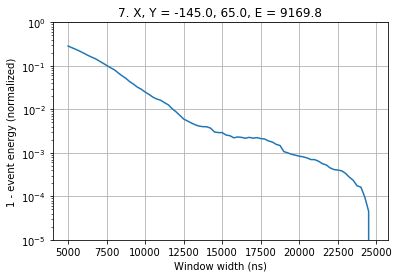

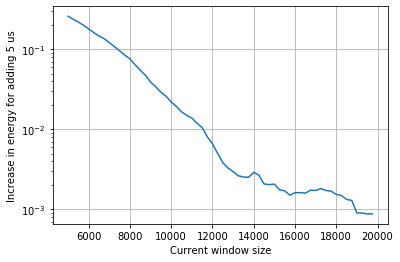

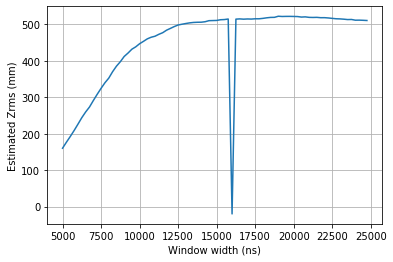

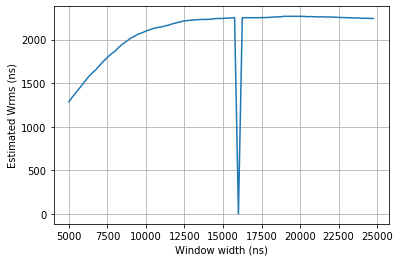

0.0
44


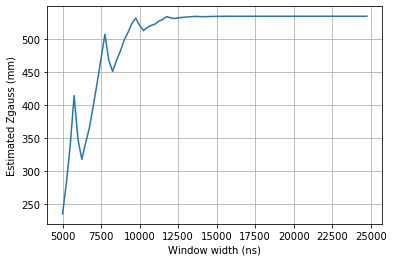

##############
EVENT NUMBER 16 ; E = 8439.3
##############


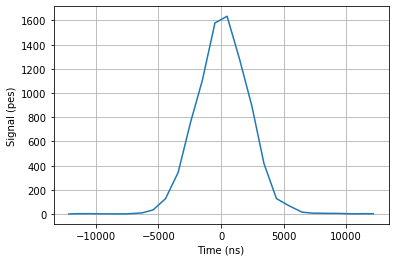

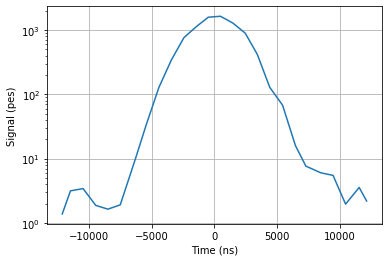

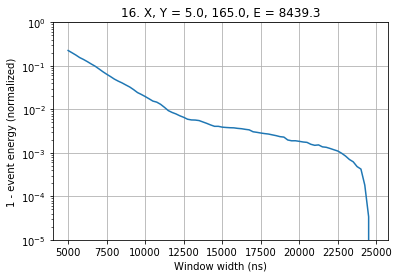

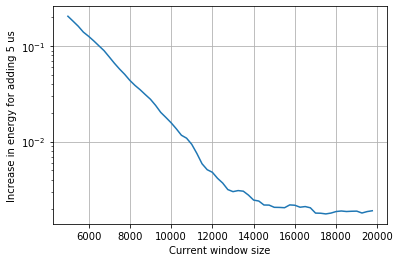

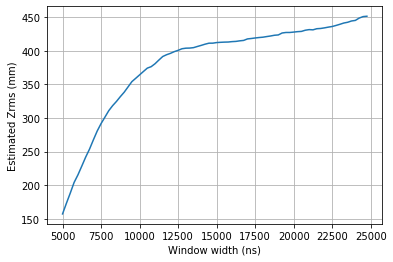

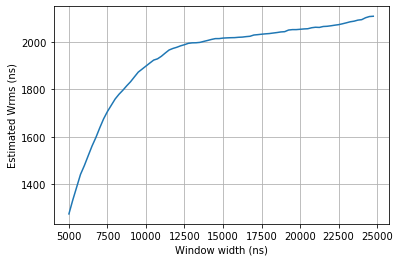

1275.7163246667506
0


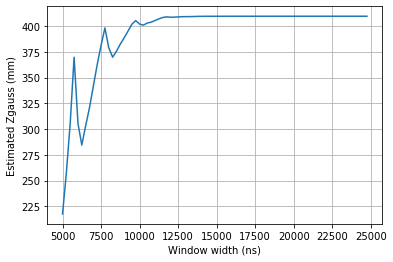

##############
EVENT NUMBER 22 ; E = 7361.5
##############


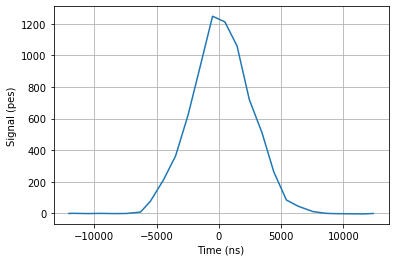

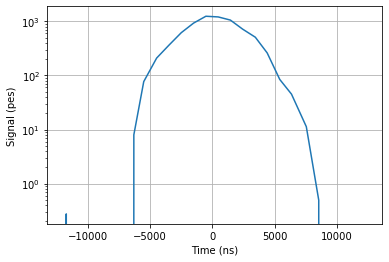

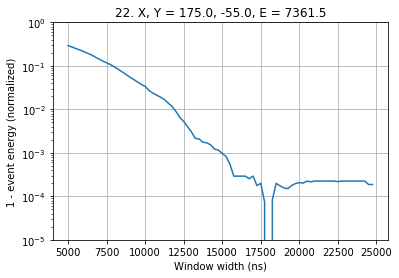

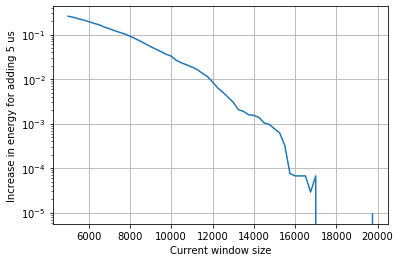

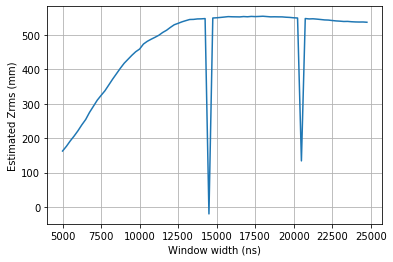

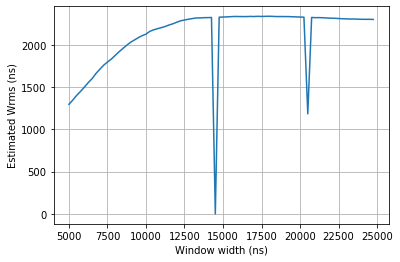

0.0
38


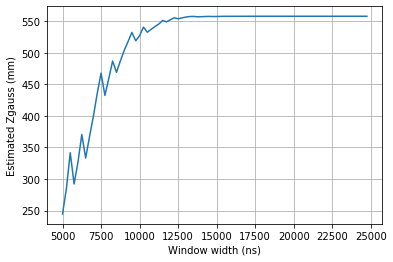

##############
EVENT NUMBER 23 ; E = 10823.0
##############


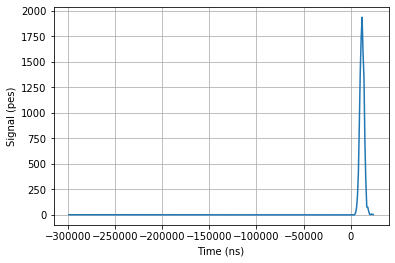

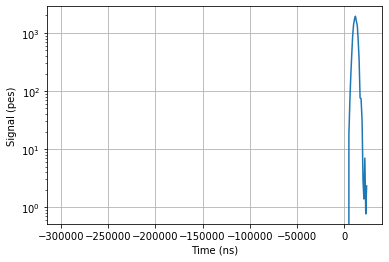

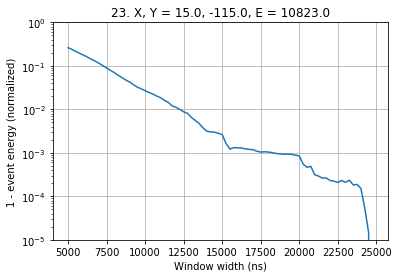

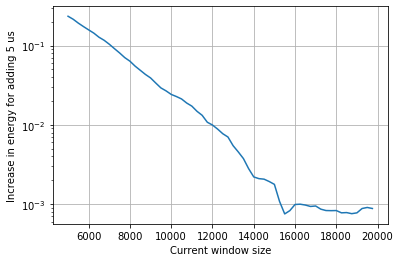

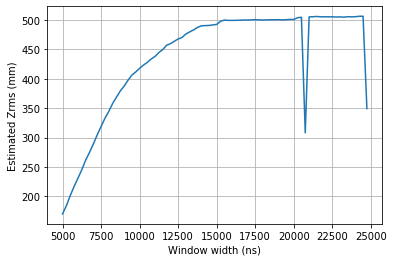

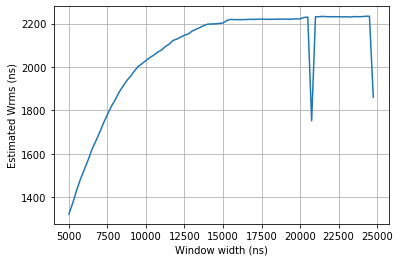

1323.7558262488158
0


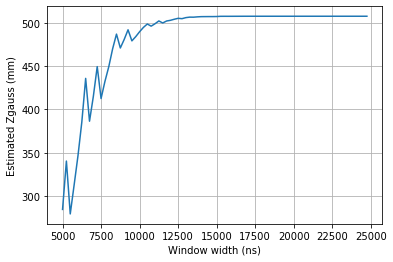

##############
EVENT NUMBER 24 ; E = 11289.3
##############


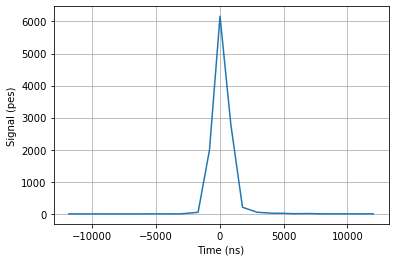

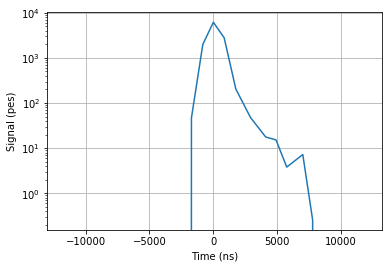

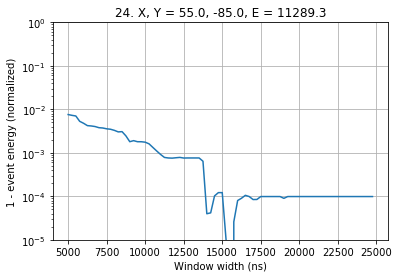

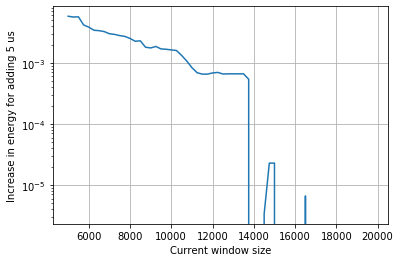

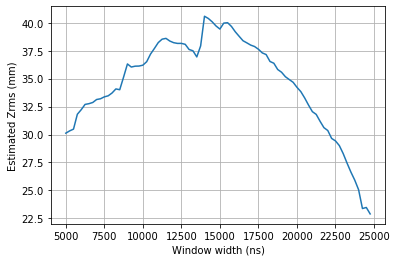

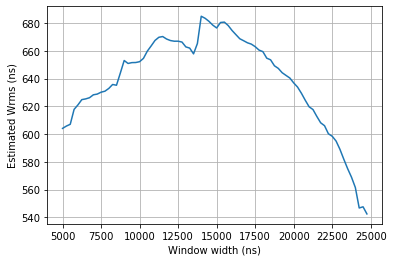

542.4371862459033
79


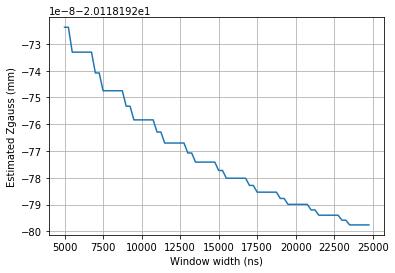

##############
EVENT NUMBER 27 ; E = 11378.9
##############


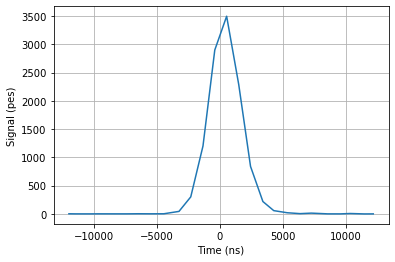

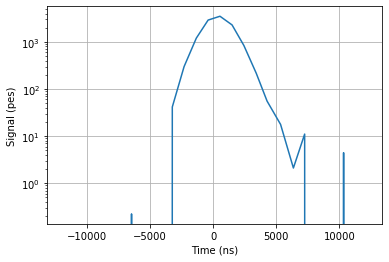

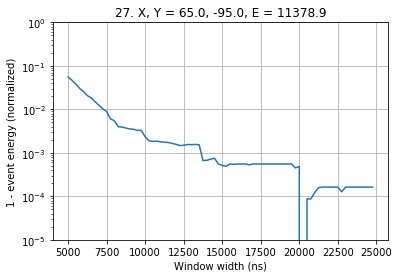

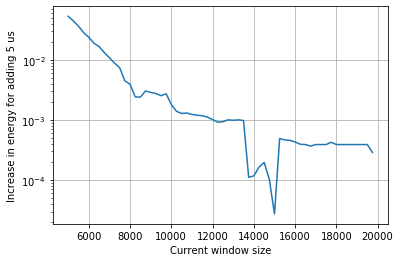

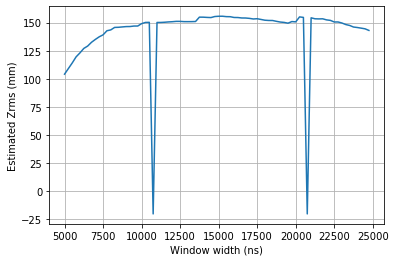

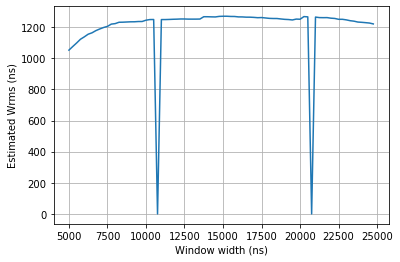

0.0
23


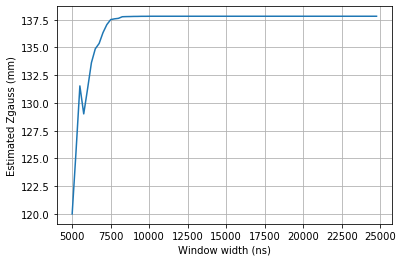

##############
EVENT NUMBER 40 ; E = 8805.2
##############


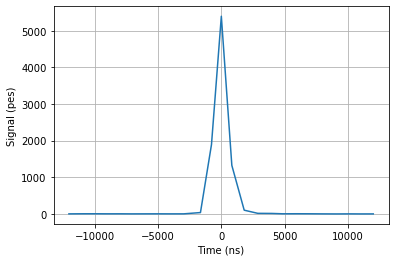

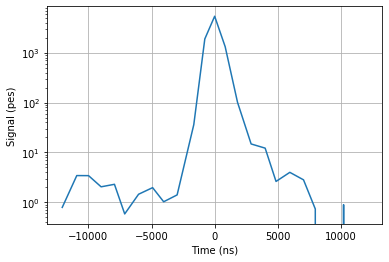

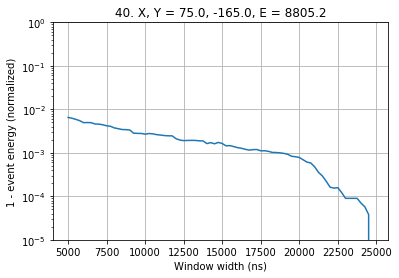

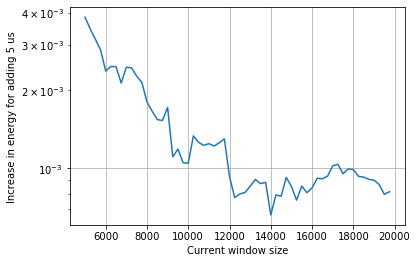

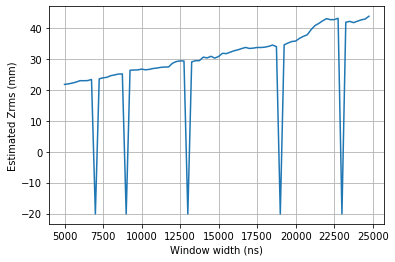

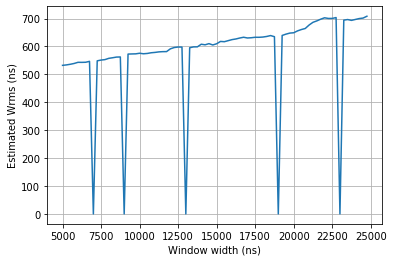

0.0
8


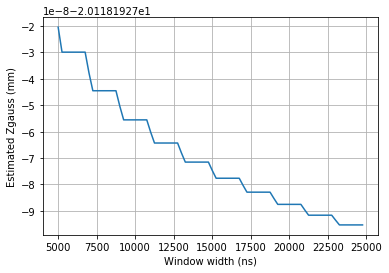

##############
EVENT NUMBER 43 ; E = 7619.3
##############


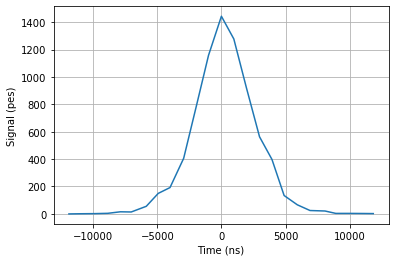

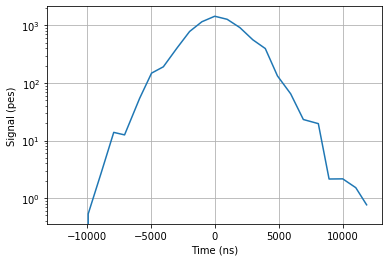

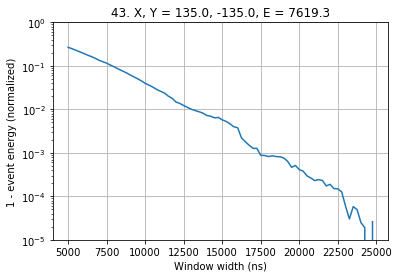

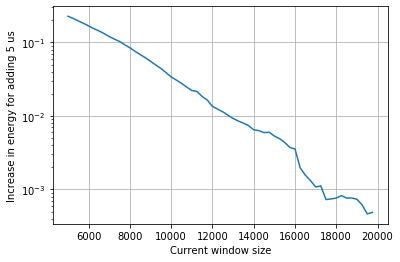

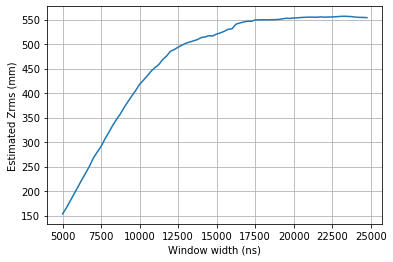

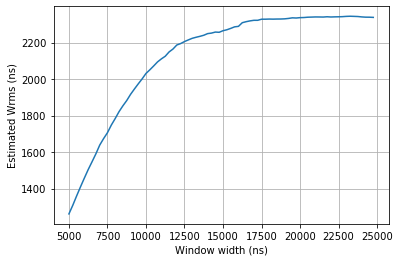

1261.63311619018
0


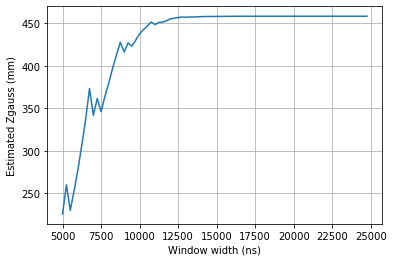

##############
EVENT NUMBER 44 ; E = 10792.3
##############


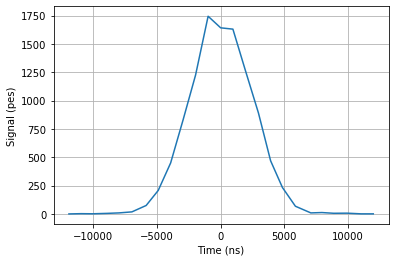

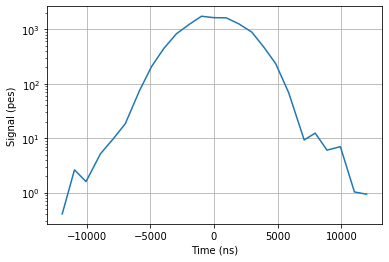

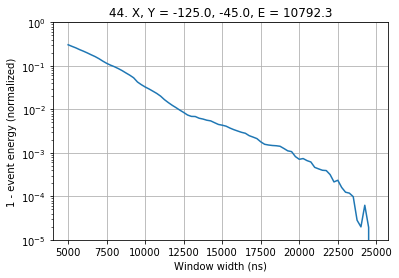

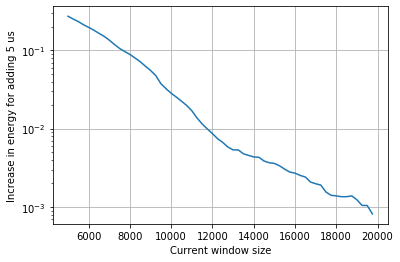

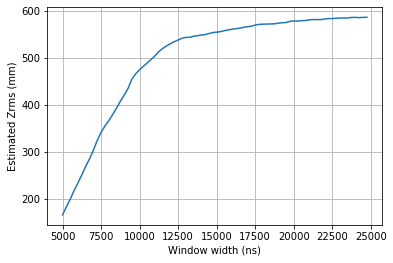

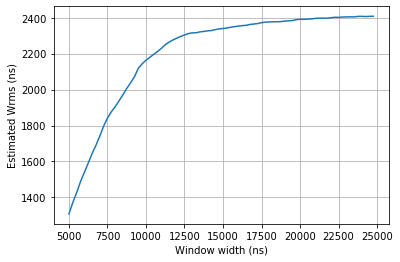

1308.4034759724527
0


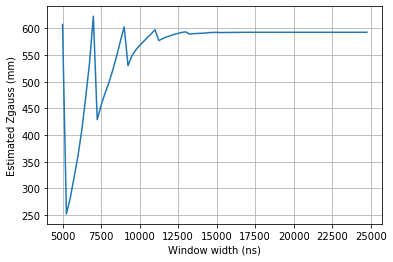

In [26]:
maxshow = 10
shown = 0
for i_evt in range(len(events_window_energy_norm)):
        
    if shown < maxshow and Emask[i_evt]:

        X = events_window_maxX[i_evt][-1]
        Y = events_window_maxY[i_evt][-1]
        E = round(max(events_window_energy[i_evt]), 1)
        
        shown += 1

        print('##############')
        print('EVENT NUMBER', i_evt, '; E =', E)
        print('##############')
        
        # Plot the waveform
        plt.xlabel('Time (ns)')
        plt.ylabel('Signal (pes)')
        plt.plot(events_times[i_evt] - np.mean(events_times[i_evt]), events_sumwf[i_evt])
        plt.grid(True)
        plt.show()

        # Plot the waveform, log scale
        plt.xlabel('Time (ns)')
        plt.ylabel('Signal (pes)')
        plt.yscale('log')
        plt.plot(events_times[i_evt] - np.mean(events_times[i_evt]), events_sumwf[i_evt])
        plt.grid(True)
        plt.show()

        # Plot the energy vs window width
        normed = np.array(events_window_energy_norm[i_evt])
        normed = 1 - normed
        plt.ylim(10**-5,10**0)
        plt.yscale('log')
        plt.title(str(i_evt)+'. X, Y = '+str(X)+', '+str(Y)+', E = '+str(E))
        plt.xlabel('Window width (ns)')
        plt.ylabel('1 - event energy (normalized)')
        plt.grid(True)
        plt.plot(events_window_cut, normed)
        plt.show()

        # Plot the increase for including 5 more us
        windows_in_5_us = int((5000 / ns_per_sample) / (2 * dwindow))
        change_next_five_us = np.array(events_window_energy_norm[i_evt][windows_in_5_us:]) - np.array(events_window_energy_norm[i_evt][:-windows_in_5_us])    
        plt.xlabel('Current window size')
        plt.ylabel('Increase in energy for adding 5 us')
        plt.yscale('log')
        plt.plot(events_window_cut[:-windows_in_5_us], change_next_five_us)
        plt.grid(True)
        plt.show()

        # Plot the Zrms estimate vs window width
        plt.xlabel('Window width (ns)')
        plt.ylabel('Estimated Zrms (mm)')
        plt.plot(events_window_cut, events_window_Zrms[i_evt])
        plt.grid(True)
        plt.show()

        # Plot the Wrms estimate vs window width
        plt.xlabel('Window width (ns)')
        plt.ylabel('Estimated Wrms (ns)')
        plt.plot(events_window_cut, events_window_Wrms[i_evt])
        plt.grid(True)
        plt.show()

        print(min(events_window_Wrms[i_evt]))
        print(np.argmin(np.array(events_window_Wrms[i_evt])))
        
        # Plot the Zgauss estimate vs window width
        plt.xlabel('Window width (ns)')
        plt.ylabel('Estimated Zgauss (mm)')
        plt.plot(events_window_cut, events_window_Zgauss[i_evt])
        plt.grid(True)
        plt.show()

In [27]:
print('Current time =', round((time() - t0)/60, 1), 'm')

Current time = 14.1 m


## Show a variety of uncorrected spectra, and XY position distributions

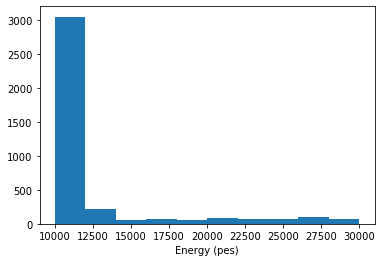

In [28]:
plt.hist(events_energy, bins = 10, range=(10000, 30000))
plt.xlabel('Energy (pes)')
plt.show()

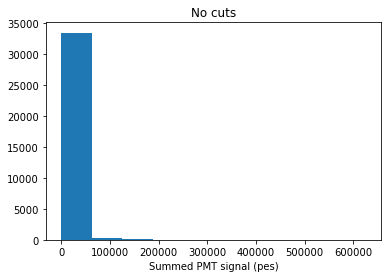

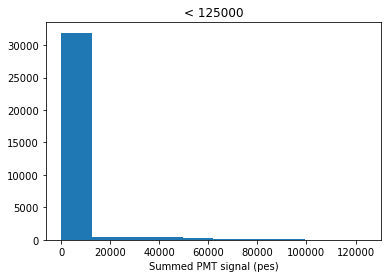

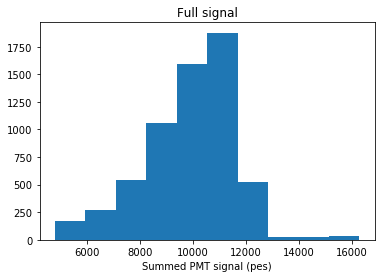

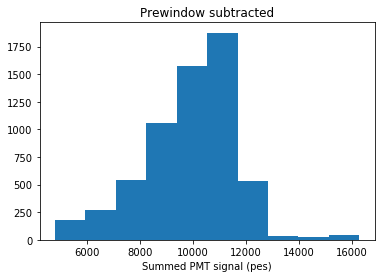

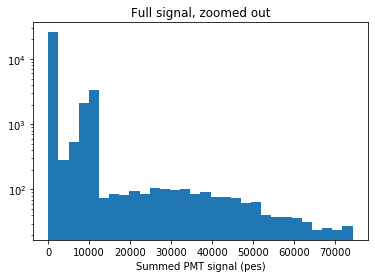

...

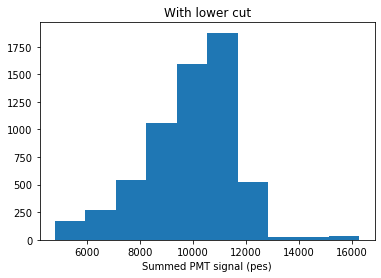

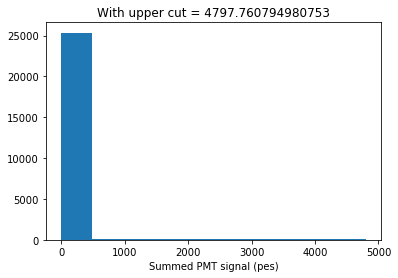

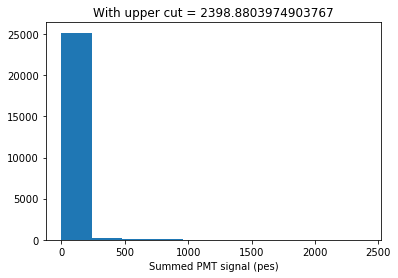

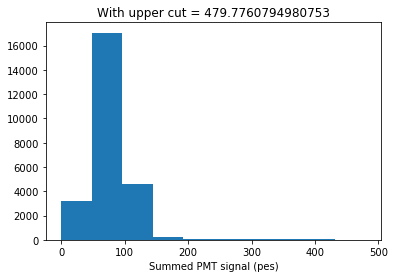

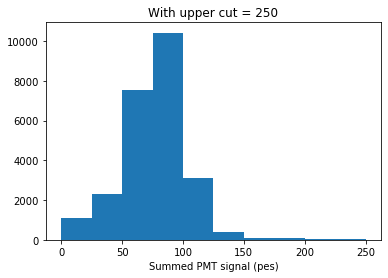

Fraction below cutoff = 74.3


In [29]:
plt.title('No cuts')
plt.hist(events_energy, bins = 10)
plt.xlabel('Summed PMT signal (pes)')
plt.show()

plt.title('< 125000')
plt.hist(events_energy[events_energy < 125000], bins = 10)
plt.xlabel('Summed PMT signal (pes)')
plt.show()

plt.title('Full signal')
plt.hist(events_energy, bins = 10, range = (Ecut[0], Ecut[1]))
plt.xlabel('Summed PMT signal (pes)')
plt.show()

plt.title('Prewindow subtracted')
plt.hist(events_energy_subtracted, bins = 10, range = (Ecut[0], Ecut[1]))
plt.xlabel('Summed PMT signal (pes)')
plt.show()

plt.title('Full signal, zoomed out')
plt.hist(events_energy, bins = 30, range = (0, np.percentile(events_energy, 99)))
plt.yscale('log')
plt.xlabel('Summed PMT signal (pes)')
plt.show()

plt.title('Prewindow subtracted, zoomed out')
plt.hist(events_energy_subtracted, bins = 30, range = (0, np.percentile(events_energy, 99)))
plt.yscale('log')
plt.xlabel('Summed PMT signal (pes)')
plt.show()

plt.title('With lower cut')
plt.hist(events_energy, bins = 10, range = (Ecut[0], Ecut[1]))
plt.xlabel('Summed PMT signal (pes)')
plt.show()

plt.title('With upper cut = '+str(Ecut[0]))
plt.hist(events_energy, bins = 10, range = (0, Ecut[0]))
plt.xlabel('Summed PMT signal (pes)')
plt.show()

plt.title('With upper cut = '+str(Ecut[0]/2))
plt.hist(events_energy, bins = 10, range = (0, Ecut[0]/2))
plt.xlabel('Summed PMT signal (pes)')
plt.show()

plt.title('With upper cut = '+str(Ecut[0]/10))
plt.hist(events_energy, bins = 10, range = (0, Ecut[0]/10))
plt.xlabel('Summed PMT signal (pes)')
plt.show()

plt.title('With upper cut = '+str(noise_bound))
plt.hist(events_energy, bins = 10, range = (0, noise_bound))
plt.xlabel('Summed PMT signal (pes)')
plt.show()

print('Fraction below cutoff =', round(100*len(events_energy[events_energy < noise_bound])/len(events_energy),1))

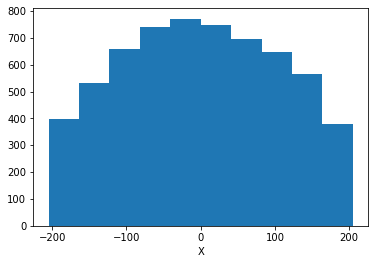

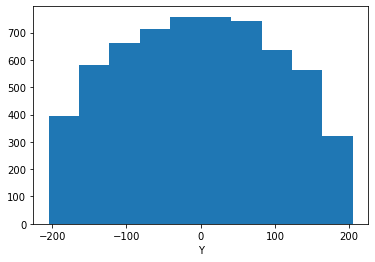

In [30]:
plt.hist(all_Xs[Emask])
plt.xlabel('X')
plt.show()

plt.hist(all_Ys[Emask])
plt.xlabel('Y')
plt.show()

In [31]:
print(len(all_Xs))
print(len(Emask))
print(len(all_Zgauss))

33895
33895
33895


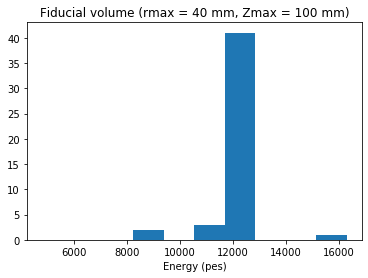

In [32]:
rmax = 40
fid = Emask & ((all_Xs**2 + all_Ys**2) < rmax**2) & (all_Zgauss < 100)
plt.title('Fiducial volume (rmax = 40 mm, Zmax = 100 mm)')
plt.hist(events_energy[fid], bins = 10, range = (Ecut[0], Ecut[1]))
plt.xlabel('Energy (pes)')
plt.show()

In [33]:
# A circle with radius R can inscribe a square of diagonal 2R, and the sides obey
# a2 + a2 = c2 = (2R)2 = 4R2
# So 2a2 = 4R2 => a = sqrt(2) R
# Thus, the min and max x and y are R / sqrt(2)

In [34]:
R = 200
boundaries = np.linspace(-R / sqrt(2), R / sqrt(2), 6)
intervals = [ (round(boundaries[i],1), round(boundaries[i+1],1)) for i in range(len(boundaries) - 1)]

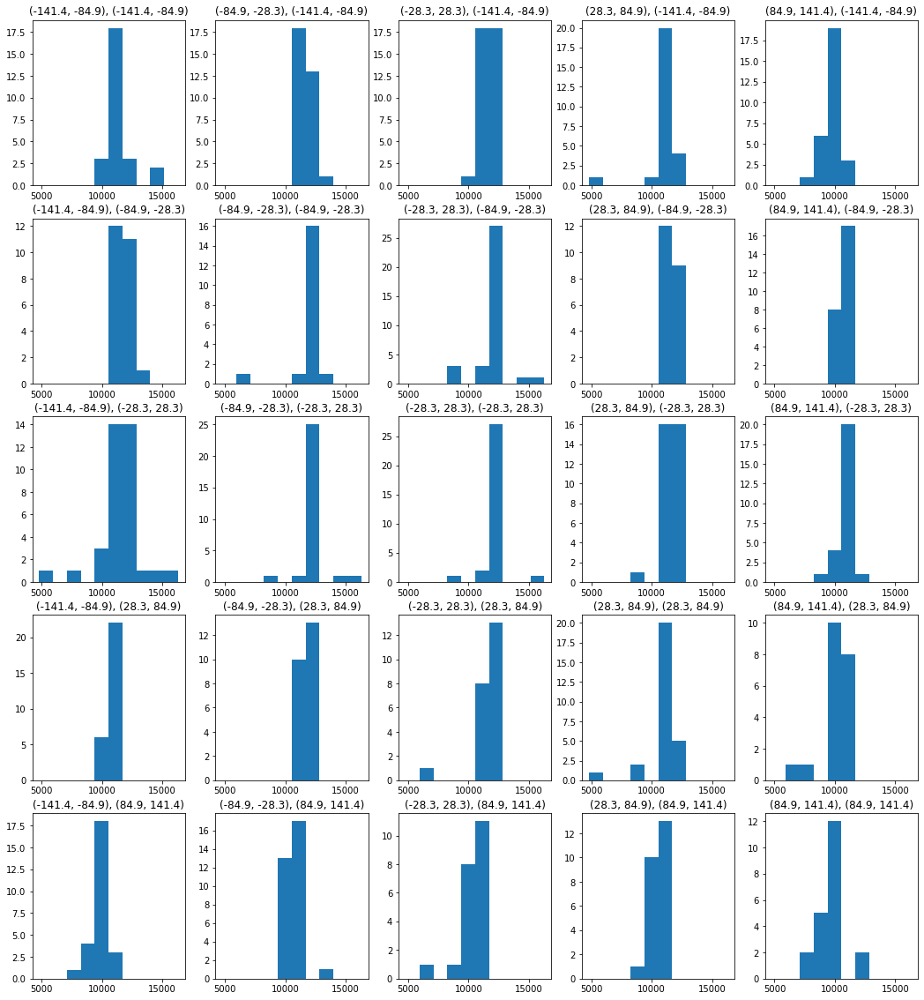

In [35]:
fig, axs = plt.subplots(len(intervals), len(intervals), figsize=(18, 20))

for ix in range(len(intervals)):
    for iy in range(len(intervals)):
        xr = intervals[ix]
        yr = intervals[iy]
        region = Emask & (xr[0] < all_Xs) & (all_Xs < xr[1]) & (yr[0] < all_Ys) & (all_Ys < yr[1]) & (all_Zgauss < 100)
        axs[iy, ix].hist(events_energy[region], range = (Ecut[0], Ecut[1]))
        axs[iy, ix].set_title(str(xr)+', '+str(yr))

In [36]:
np.percentile(events_energy, 0.25)

0.0

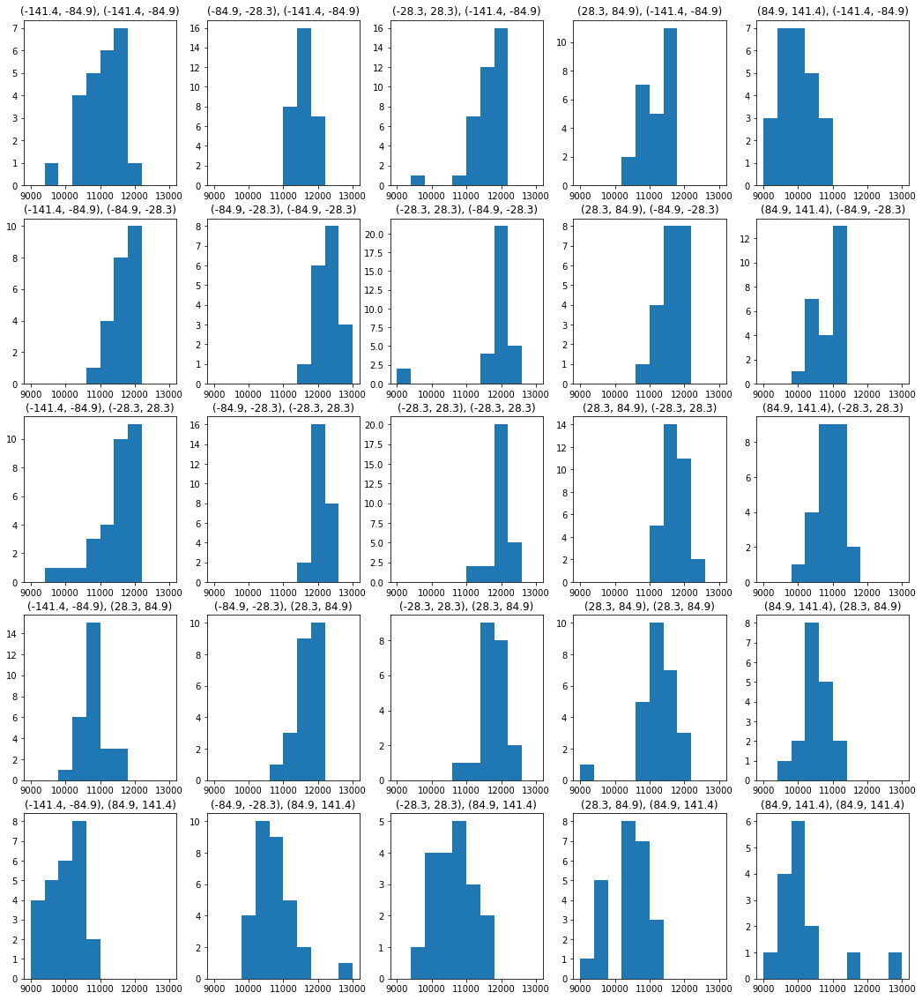

In [37]:
fig, axs = plt.subplots(len(intervals), len(intervals), figsize=(18, 20))

for ix in range(len(intervals)):
    for iy in range(len(intervals)):
        xr = intervals[ix]
        yr = intervals[iy]
        region = Emask & (xr[0] < all_Xs) & (all_Xs < xr[1]) & (yr[0] < all_Ys) & (all_Ys < yr[1]) & (all_Zgauss < 100)
        axs[iy, ix].hist(events_energy[region], range = (11000-2000, 11000+2000))
        axs[iy, ix].set_title(str(xr)+', '+str(yr))

## Determination of necessary window width

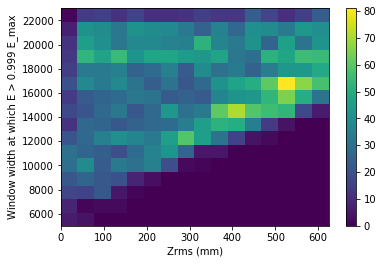

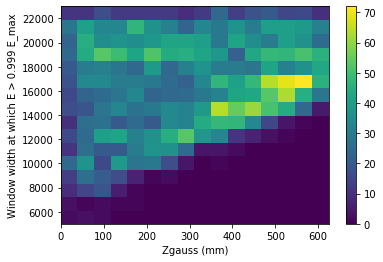

In [38]:
window_range = (5000, 23000)
bins = (16, 16)
zrange = (0, 625)

hrms = plt.hist2d(all_Zrms[Emask], all_energy_cutoffs_999[Emask], bins = bins, range = (zrange, window_range))
plt.xlim(zrange)
plt.xlabel('Zrms (mm)')
plt.ylabel('Window width at which E > 0.999 E_max')
plt.colorbar(hrms[3])
plt.show()

hgauss = plt.hist2d(all_Zgauss[Emask], all_energy_cutoffs_999[Emask], bins = bins, range = (zrange, window_range))
plt.xlim(zrange)
plt.xlabel('Zgauss (mm)')
plt.ylabel('Window width at which E > 0.999 E_max')
plt.colorbar(hgauss[3])
plt.show()

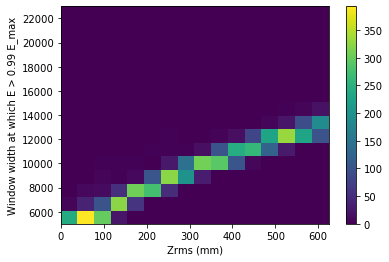

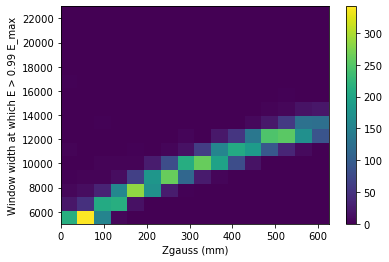

In [39]:
hrms = plt.hist2d(all_Zrms[Emask], all_energy_cutoffs_99[Emask], bins = bins, range = (zrange, window_range))
plt.xlim(zrange)
plt.xlabel('Zrms (mm)')
plt.ylabel('Window width at which E > 0.99 E_max')
plt.colorbar(hrms[3])
plt.show()

hgauss = plt.hist2d(all_Zgauss[Emask], all_energy_cutoffs_99[Emask], bins = bins, range = (zrange, window_range))
plt.xlim(zrange)
plt.xlabel('Zgauss (mm)')
plt.ylabel('Window width at which E > 0.99 E_max')
plt.colorbar(hgauss[3])
plt.show()

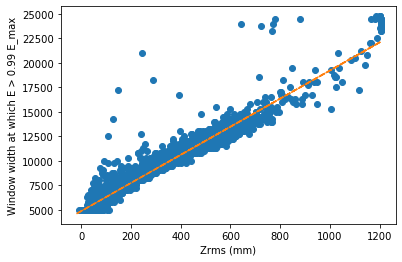

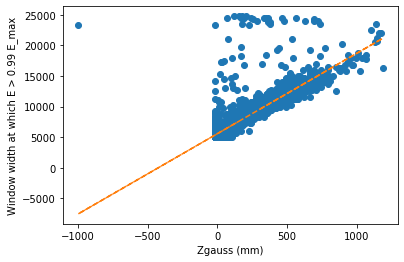

In [40]:
p = np.polyfit(all_Zrms[Emask], all_energy_cutoffs_99[Emask], 1)
myline = np.array(all_Zrms)*p[0] + p[1]
plt.xlabel('Zrms (mm)')
plt.ylabel('Window width at which E > 0.99 E_max')
plt.plot(all_Zrms[Emask], all_energy_cutoffs_99[Emask], 'o')
plt.plot(all_Zrms, myline, '--')
plt.show()

p = np.polyfit(all_Zgauss[Emask], all_energy_cutoffs_99[Emask], 1)
myline = np.array(all_Zgauss[Emask])*p[0] + p[1]
plt.xlabel('Zgauss (mm)')
plt.ylabel('Window width at which E > 0.99 E_max')
plt.plot(all_Zgauss[Emask], all_energy_cutoffs_99[Emask], 'o')
plt.plot(all_Zgauss[Emask], myline, '--')
plt.show()

## Z position characteristics, Wgauss vs Zgauss vs Zrms

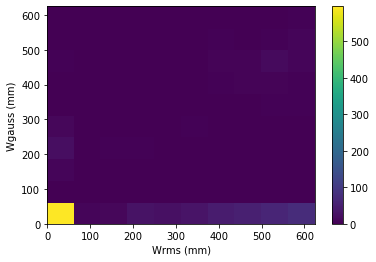

In [41]:
hW = plt.hist2d(all_Wrms, all_Wgauss, range = (zrange, zrange))
plt.xlabel('Wrms (mm)')
plt.ylabel('Wgauss (mm)')
plt.colorbar(hW[3])
plt.show()

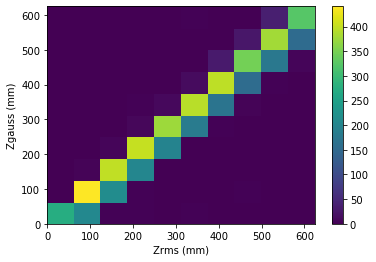

In [42]:
hZ = plt.hist2d(all_Zrms[Emask], all_Zgauss[Emask], range = (zrange, zrange))
plt.xlabel('Zrms (mm)')
plt.ylabel('Zgauss (mm)')
plt.colorbar(hZ[3])
plt.show()

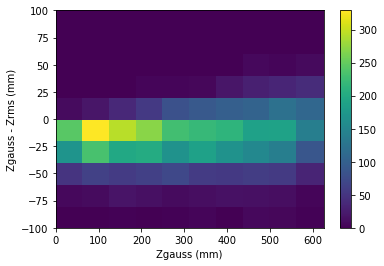

In [43]:
all_dZ = np.array(all_Zgauss[Emask]) - np.array(all_Zrms[Emask])
dzrange = (-100, 100)
hdZ = plt.hist2d(all_Zgauss[Emask], all_dZ, range = (zrange, dzrange))
plt.xlabel('Zgauss (mm)')
plt.ylabel('Zgauss - Zrms (mm)')
plt.colorbar(hdZ[3])
plt.show()

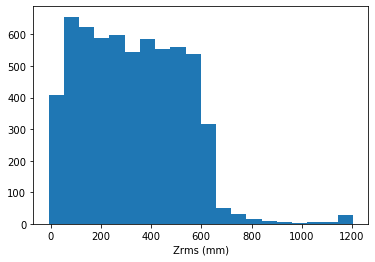

In [44]:
plt.hist(all_Zrms[Emask], bins = 20)
plt.xlabel('Zrms (mm)')
plt.show()

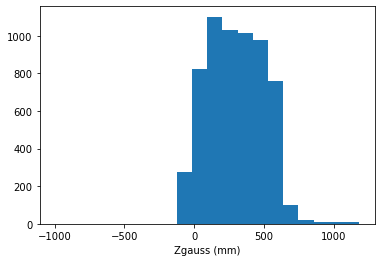

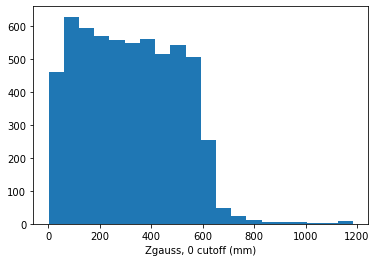

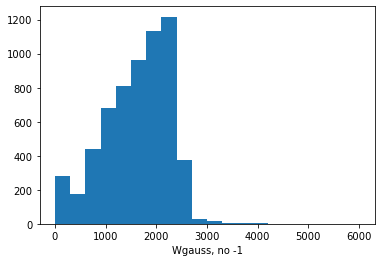

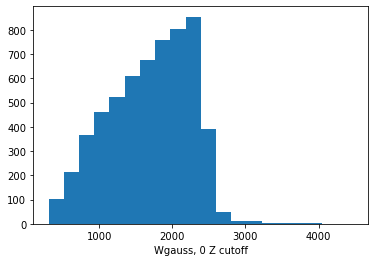

In [45]:
plt.hist(all_Zgauss[Emask], bins = 20)
plt.xlabel('Zgauss (mm)')
plt.show()

plt.hist(all_Zgauss[Emask & (all_Zgauss > 0)], bins = 20)
plt.xlabel('Zgauss, 0 cutoff (mm)')
plt.show()

plt.hist(all_Wgauss[Emask & (all_Wgauss != -1)], bins = 20)
plt.xlabel('Wgauss, no -1')
plt.show()

plt.hist(all_Wgauss[Emask & (all_Zgauss > 0)], bins = 20)
plt.xlabel('Wgauss, 0 Z cutoff')
plt.show()

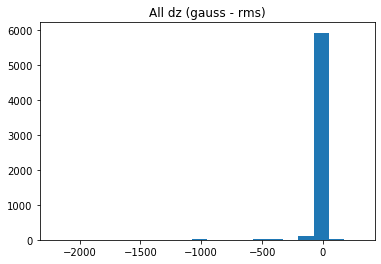

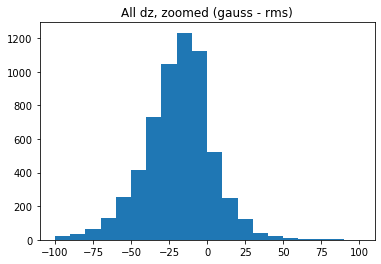

In [46]:
dZ = all_Zgauss[Emask] - all_Zrms[Emask]

plt.hist(dZ, bins = 20)
plt.title('All dz (gauss - rms)')
plt.show()

plt.hist(dZ, bins = 20, range = (-100, 100))
plt.title('All dz, zoomed (gauss - rms)')
plt.show()

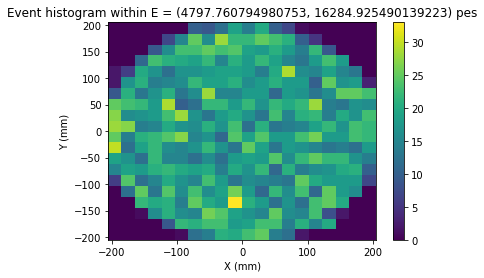

In [47]:
hxy = plt.hist2d(all_Xs[Emask], all_Ys[Emask], bins = 20)
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.title('Event histogram within E = '+str(Ecut)+' pes')
plt.colorbar(hxy[3])
plt.show()

In [48]:
ntotal  = len(events_sumwf)
nselect = len(events_sumwf[Emask])
selper  = round(100 * nselect / ntotal, 1)
print('Number of total events    =', ntotal)
print('Number of selected events =', nselect)
print('Selected percent          =', selper, '%')

Number of total events    = 33895
Number of selected events = 6127
Selected percent          = 18.1 %


## Comparisons of width vs Z, maximum allowable width

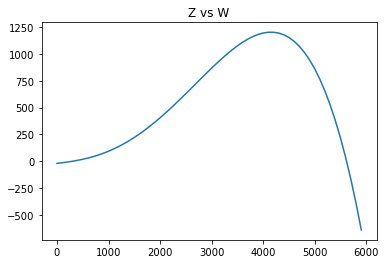

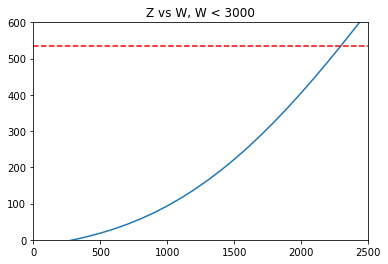

In [49]:
Ws = np.arange(0, 6000, 100)
Zs = exp_dt(Ws / 1000)
cutoff = Ws*0 + 534

plt.plot(Ws, Zs)
plt.title('Z vs W')
plt.show()

plt.plot(Ws, Zs)
plt.plot(Ws, cutoff, '--', color='r')
plt.title('Z vs W, W < 3000')
plt.xlim(0, 2500)
plt.ylim(0, 600)
plt.show()

In [50]:
# The cutoff W is the point where exp_dt gives an estimate beyond the
# chamber depth for the Z location of the event

max_depth = 534

def max_depth_offset(W):
    return (exp_dt(W/1000) - max_depth)**2

from scipy.optimize import minimize

cutoff_guess = 2300
res = minimize(max_depth_offset, cutoff_guess)

print('Cutoff value =', res['x'][0])

Cutoff value = 2293.8670244413365


In [51]:
def weighted_avg_and_std(values, weights, debug=False):
    """
    Return the weighted average and standard deviation
    values, weights -- Numpy ndarrays with the same shape.
    """
    if debug:
        print('Input values   =', values)
        print('Input weights  =', weights)
        print('Sum of weights =', np.sum(weights))

    if np.sum(weights) > 0:
        average = np.average(values, weights=weights)
        variance = np.average((values-average)**2, weights=weights)
        if debug: print('Average, variance =', average, variance)
        std = np.sqrt(max(0.,variance))
    else:
        if debug:
            print('WARNING - NOT ENOUGH WEIGHTS TO CALCULATE.')
        average = np.mean(values)
        std = 0.

    return average, std

In [52]:
print('Current time =', round((time() - t0)/60, 1), 'm')

Current time = 14.4 m


## Examine Gaussians and R2, look at potential fits

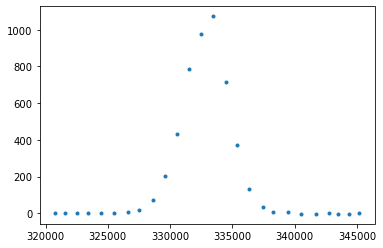

In [53]:
i_evt = 0
plt.plot(events_times[i_evt], events_sumwf[i_evt], '.')
# plt.xlim(32)
plt.show()

R2 = 0.9965658717172529
E  = 4835.684364869376


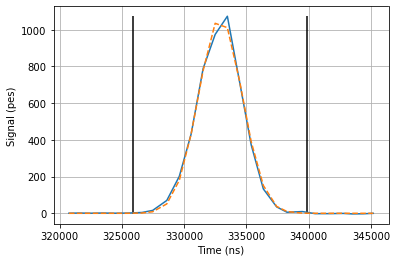

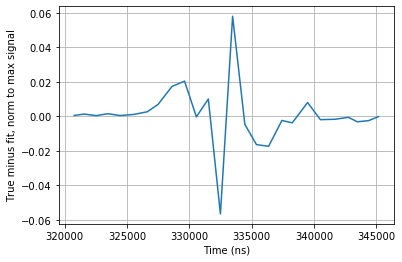

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.986868370399484
E  = 1324.5355004368564


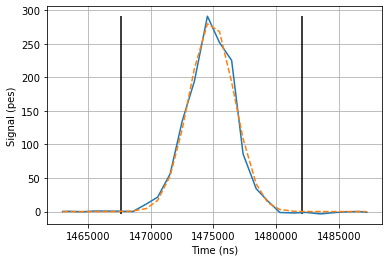

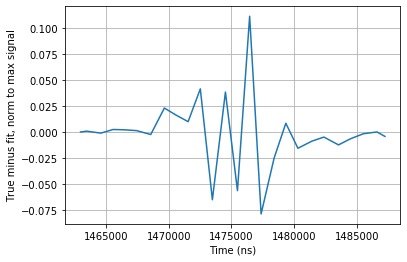

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.9718929894930259
E  = 76494.15192784781


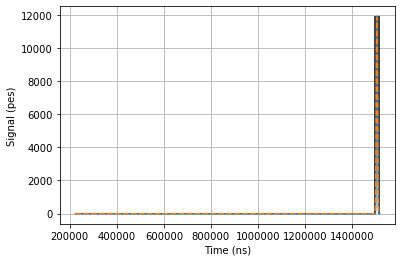

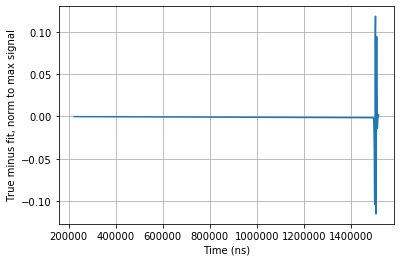

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.962742379179089
E  = 11189.205944360765


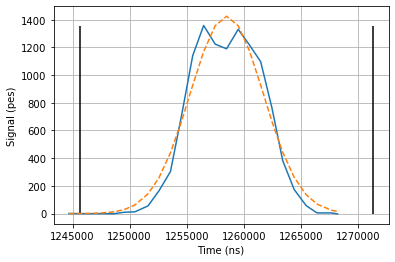

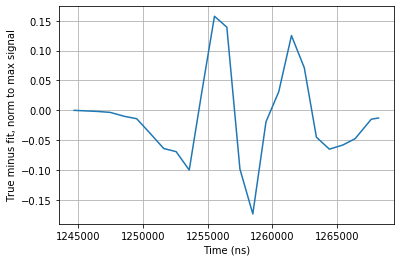

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.9589603329907993
E  = 205975.1834588274


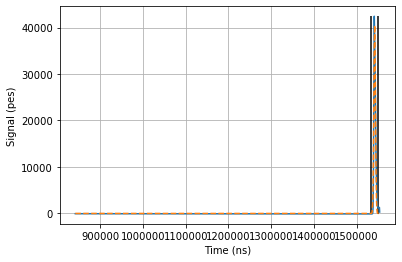

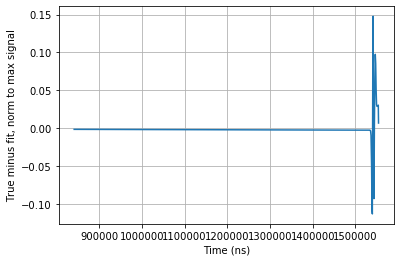

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.9442570839518296
E  = 7552.913912153196


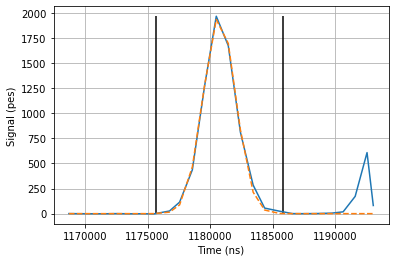

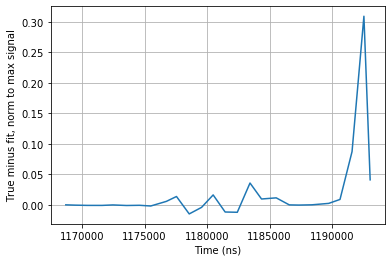

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.9371388006910486
E  = 30897.563344530943


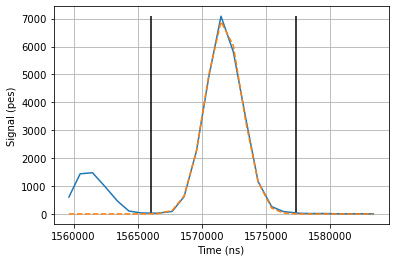

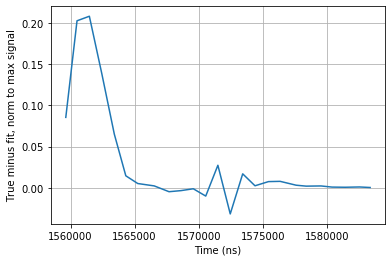

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.9294887734582231
E  = 87.80422168172855


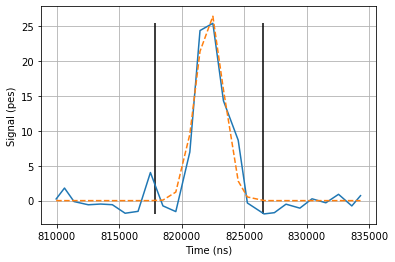

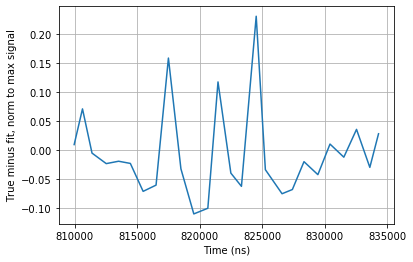

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.9186904283319509
E  = 312.9454061669886


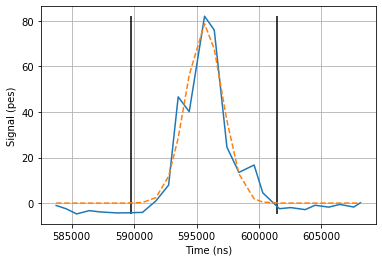

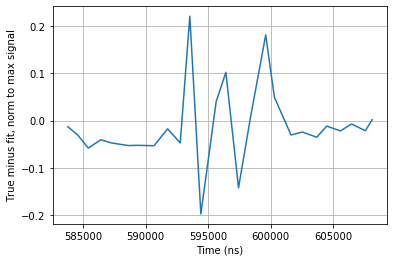

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.9097003698845954
E  = 234.2176640994833


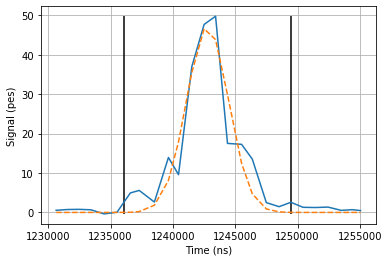

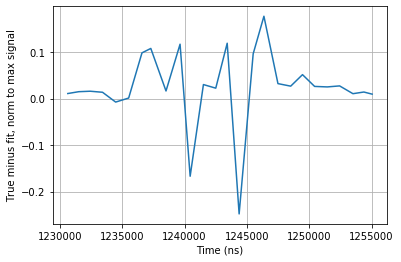

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.8964777267210874
E  = 59.06291913044957


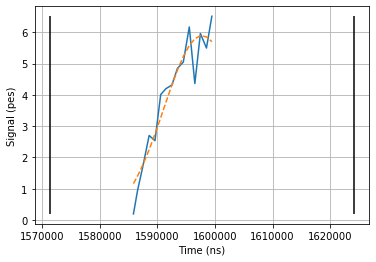

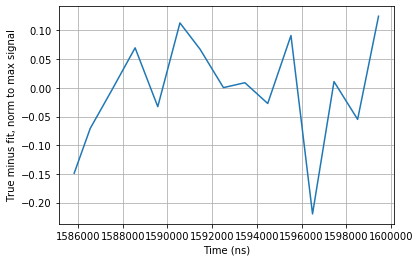

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.8863608098364373
E  = 55871.4848361013


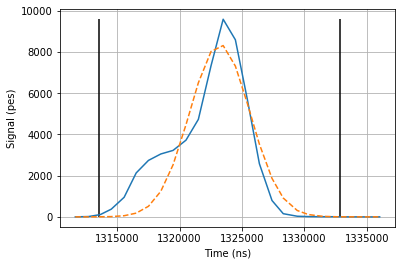

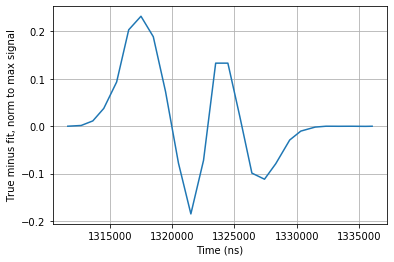

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.8770086366341532
E  = 102.45570302968147


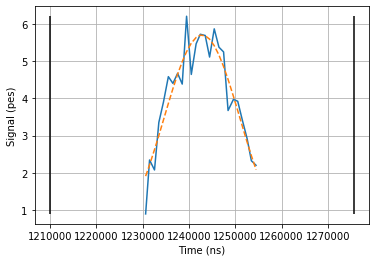

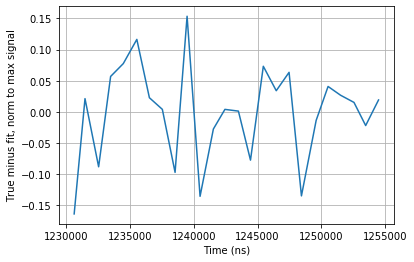

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.8655597166669698
E  = 215682.020995322


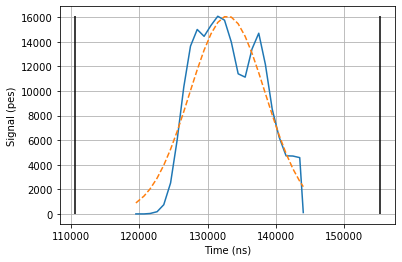

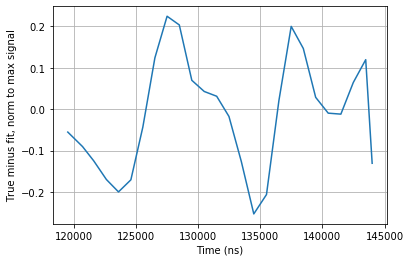

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.859040524457071
E  = 82.77240034603902


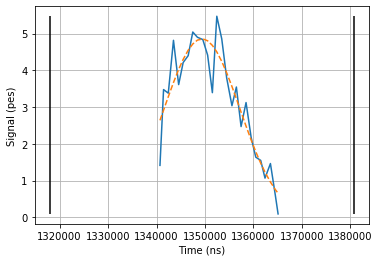

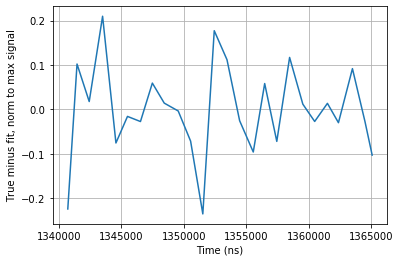

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.8438297659548747
E  = 101.83287052319734


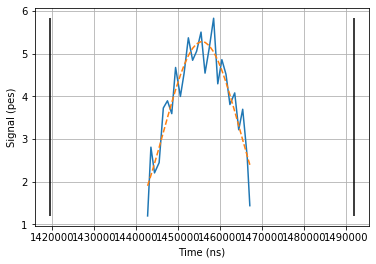

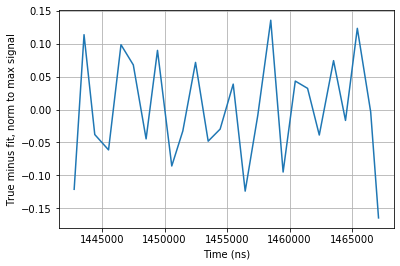

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.835574389840286
E  = 84.05907481963322


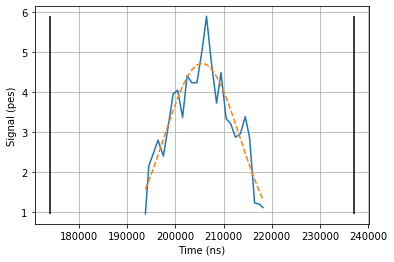

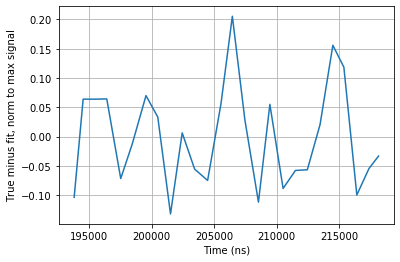

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.8218826530655983
E  = 93.61531116932676


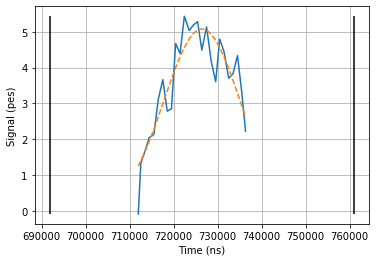

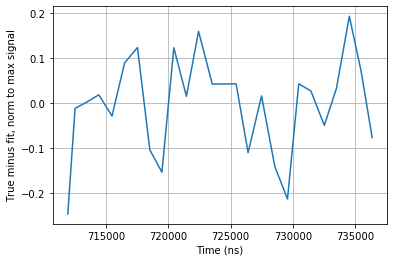

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.8116772309111502
E  = 77.40036585818453


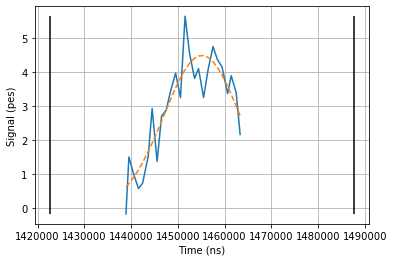

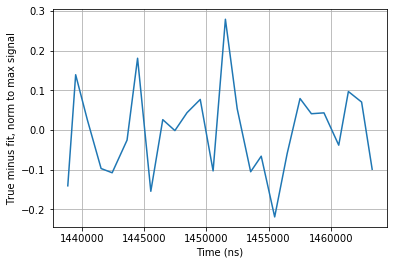

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


R2 = 0.8025587961784554
E  = 64.15953125024936


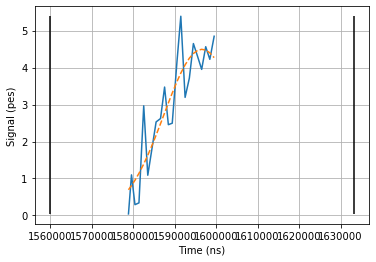

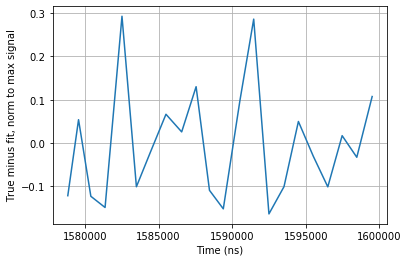

In [54]:
# Look at some R2 plots

shown = 0
showmax = 20
cut = 0

for i_evt in range(len(events_window_Zgauss)):            
    #i_evt = 0 # 7082 # 0

    if shown < showmax:

        try:

            xdata, ydata = events_times[i_evt], events_sumwf[i_evt]
            mean0, _ = weighted_avg_and_std(xdata, ydata)
            amp0 = np.max(ydata)

            # Get the stdev guess from the less edge dependent FWHM
            above_half_max = ydata > amp0 / 2
            start = np.argmax(above_half_max)
            end = len(above_half_max)-np.argmax(above_half_max[::-1])-1
            FWHM = xdata[end] - xdata[start]
            sigma0 = FWHM / (2*np.sqrt(2*np.log(2)))
            var0 = sigma0**2
            C0 = 0

            popt,  pcov  = curve_fit(gauss2, xdata, ydata, p0 = (amp0, mean0, var0))
            amp, mean, var = popt

            stdev = var**0.5
            Wgauss = stdev
            Zgauss = exp_dt(stdev/1000)

            fitcurve = gauss2(xdata, *popt)


            residuals = ydata - gauss2(xdata, *popt)
            ss_res = np.sum(residuals**2)
            ss_tot = np.sum((ydata-np.mean(ydata))**2)
            r_squared = 1 - (ss_res / ss_tot)

        except:
            r_squared = 0


        if (0.99-cut) < r_squared < (1-cut) and cut < 1:

            shown += 1

            cut += 0.01
            print('R2 =', r_squared)
            print('E  =', events_energy[i_evt])
            plt.xlabel('Time (ns)')
            plt.ylabel('Signal (pes)')
            ymin = min(events_sumwf[i_evt])
            ymax = max(events_sumwf[i_evt])
            plt.vlines(mean - 4 * stdev, ymin, ymax)
            plt.vlines(mean + 4 * stdev, ymin, ymax)
            plt.plot(events_times[i_evt], events_sumwf[i_evt])
            plt.plot(events_times[i_evt], fitcurve, '--')
            plt.grid(True)
            plt.show()

            plt.xlabel('Time (ns)')
            plt.ylabel('True minus fit, norm to max signal')
            plt.plot(events_times[i_evt], (events_sumwf[i_evt] - fitcurve)/amp0)
            plt.grid(True)
            plt.show()

In [55]:
print('Current time =', round((time() - t0)/60, 1), 'm')

Current time = 14.8 m


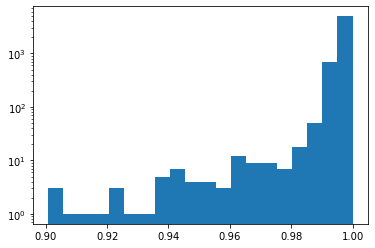

In [56]:
plt.hist(all_R2[Emask & (all_R2 > 0.9)], bins = 20)
plt.yscale('log')
plt.show()

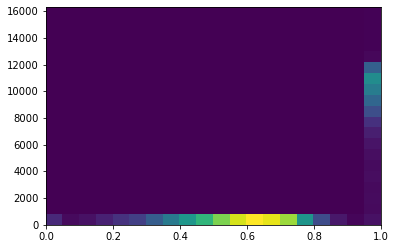

In [57]:
plt.hist2d(all_R2, events_energy, bins = 20, range=((0,1),(0, Ecut[1])))
plt.show()

## Investigate and decide on Erange for cut

In [58]:
Erange_guess = Ecut
r2mask = (all_R2 > 0.9)
Emask2 = (events_energy > Erange_guess[0]) & (events_energy < Erange_guess[1])
r2noisemask = r2mask & (events_energy > noise_bound)
selmask = r2mask & Emask2
print('R2 sel =', round(100*sum(r2mask)/len(r2mask),1))
print('Full sel =', round(100*sum(selmask)/len(selmask),1))

R2 sel = 23.1
Full sel = 17.1


In [59]:
len(events_energy[r2noisemask & (events_energy > Erange_guess[1])]) / len(events_energy[r2noisemask])

0.19606582669066597

In [60]:
for i in range(100):
    lower = (100. - i) / 2
    upper = lower + i
    print(i, '% =',lower,'to', upper,'=', np.percentile(events_energy[r2noisemask], lower), ',', np.percentile(events_energy[r2noisemask], upper))

0 % = 50.0 to 50.0 = 10513.625157359316 , 10513.625157359316
1 % = 49.5 to 50.5 = 10489.958827613716 , 10537.539554525254
2 % = 49.0 to 51.0 = 10466.04906307122 , 10561.546903057817
3 % = 48.5 to 51.5 = 10433.412432348723 , 10595.911069934778
4 % = 48.0 to 52.0 = 10405.057439034532 , 10618.673573383068
5 % = 47.5 to 52.5 = 10387.578961944006 , 10646.432420059884
6 % = 47.0 to 53.0 = 10354.537048124821 , 10672.975767785014
7 % = 46.5 to 53.5 = 10327.933211638934 , 10697.29651867781
8 % = 46.0 to 54.0 = 10297.26400688014 , 10721.654710957933
9 % = 45.5 to 54.5 = 10270.408362367278 , 10745.360175966205
10 % = 45.0 to 55.0 = 10237.454300270843 , 10768.306686099448
11 % = 44.5 to 55.5 = 10211.66771136872 , 10786.925620924565
12 % = 44.0 to 56.0 = 10188.30668869131 , 10821.782837767661
13 % = 43.5 to 56.5 = 10164.666238344249 , 10837.87086301274
14 % = 43.0 to 57.0 = 10134.939491377287 , 10858.847024771943
15 % = 42.5 to 57.5 = 10103.51669810093 , 10879.490051071616
16 % = 42.0 to 58.0 = 100

GOT LSIGMA
GOT SIGMA
GOT RSIGMA


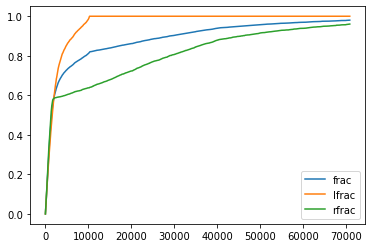

Med, lstdev, rstdev = 10513.625157359316 , 2555.071994390121 , 15543.3546325399
Fraction estimator = 3477.7368812532195 vs std of 23634.415948108617
Four sigma sym energy range = -3397.3223676535617 , 24424.572682372193
Four sigma R/L energy range = 293.33717979883295 , 72687.04368751892
Two sigma R/L energy range  = 5403.481168579075 , 41600.33442243912
R/L dble qrt energy range   = 1336.4850708028753 , 20847.853420158204
Original "by eye" range     = 4797.760794980753 , 16284.925490139223
Selfmask signal frequency = 18.4


In [61]:
sigma_frac = 0.6827
std = np.std(events_energy[r2noisemask])
med = np.median(events_energy[r2noisemask])
ns = np.linspace(0, 3, 1000)
fracs = []
lfracs = []
rfracs = []

std_est = -1
lstd_est = -1
rstd_est = -1

left_total = np.sum(r2noisemask & (events_energy < med))
right_total = np.sum(r2noisemask & (events_energy >= med))

rrq = (np.percentile(events_energy[r2noisemask], 82) - med) # lradius, quartile. Go to double IQR
lrq = 2*(med - np.percentile(events_energy[r2noisemask], 8)) # rradius, quartile. Go to double IQR

for n in ns:
    # print()
    frac = np.sum( np.abs(events_energy[r2noisemask] - med)/std < n ) / len(events_energy[r2noisemask])
    lfrac = np.sum( np.abs(events_energy[r2noisemask & (events_energy < med)]-med)/std < n ) / left_total
    rfrac = np.sum( np.abs(events_energy[r2noisemask & (events_energy >= med)]-med)/std < n ) / right_total
    fracs.append(frac)
    lfracs.append(lfrac)
    rfracs.append(rfrac)
    if frac > sigma_frac and std_est == -1:
        std_est = n * std
        print('GOT SIGMA')
    if rfrac > sigma_frac and rstd_est == -1:
        rstd_est = n * std
        print('GOT RSIGMA')
    if lfrac > sigma_frac and lstd_est == -1:
        lstd_est = n * std
        print('GOT LSIGMA')

    # print('RFrac <', round(n,1), '=', rfrac)
    # print('LFrac <', round(n,1), '=', lfrac)
    # print('SFrac <', round(n,1), '=', frac)

plt.plot(ns * std, fracs, label = 'frac')
plt.plot(ns * std, lfracs, label = 'lfrac')
plt.plot(ns * std, rfracs, label = 'rfrac')
plt.legend()
plt.show()
print('Med, lstdev, rstdev =', med, ',', lstd_est, ',', rstd_est)
print('Fraction estimator =', std_est, 'vs std of', std)
print('Four sigma sym energy range =', med - 4*std_est, ',', med + 4*std_est)
print('Four sigma R/L energy range =', med - 4*lstd_est, ',', med + 4*rstd_est)
print('Two sigma R/L energy range  =', med - 2*lstd_est, ',', med + 2*rstd_est)
print('R/L dble qrt energy range   =', med - lrq, ',', med + rrq)
print('Original "by eye" range     =', Erange_guess[0], ',', Erange_guess[1])
erangeself = (med-lrq, med+rrq)
selfmask = r2noisemask & (events_energy > med-lrq) & (events_energy < med+rrq) & (all_Zgauss > 0)
print('Selfmask signal frequency =', round(100*np.sum(selfmask) / len(selfmask),1))

In [62]:
selfmask_nor2 = (events_energy > noise_bound) & (events_energy > med-lrq) & (events_energy < med+rrq) & (all_Zgauss > 0)

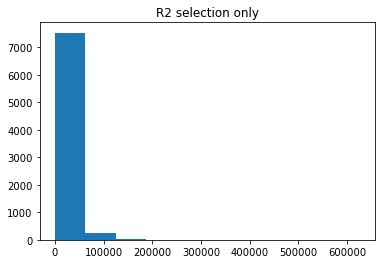

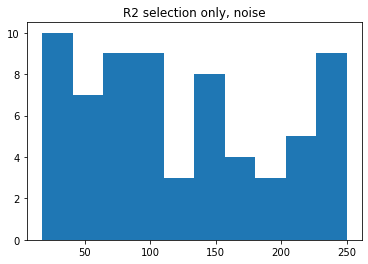

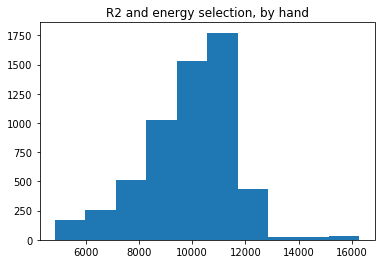

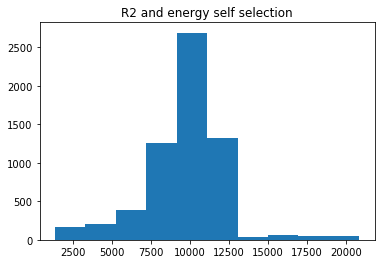

Fraction within energy cut = 0.7374123645634162


In [63]:
plt.hist(events_energy[r2mask])
plt.title('R2 selection only')
plt.show()

plt.hist(events_energy[r2mask & (events_energy < noise_bound)])
plt.title('R2 selection only, noise')
plt.show()

plt.hist(events_energy[selmask])
plt.title('R2 and energy selection, by hand')
plt.show()

plt.hist(events_energy[selfmask])
plt.title('R2 and energy self selection')
plt.show()

print('Fraction within energy cut =', len(events_energy[selmask]) / len(events_energy[r2mask]))

## Self cut spatial uniformity

In [64]:
np.arange(1, 10, 1)

array([1, 2, 3, 4, 5, 6, 7, 8, 9])

In [65]:
event_indices = np.arange(0, len(events_sum_sipms_subtracted), 1)
sel_indices = event_indices[selfmask]
sel_events_sum_sipms = events_sum_sipms_subtracted[selfmask]
sel_events_X_sipm_subtracted = events_X_sipm_subtracted[selfmask]
sel_events_Y_sipm_subtracted = events_Y_sipm_subtracted[selfmask]

In [66]:
max_sipm_by_event = np.array([np.max(sum_sipms) for sum_sipms in sel_events_sum_sipms])
print('Smallest maximal sipm =', np.min(max_sipm_by_event))
print('Occurs at index', np.argmin(max_sipm_by_event), ', which is full index', sel_indices[np.argmin(max_sipm_by_event)])

Smallest maximal sipm = 0.0
Occurs at index 232 , which is full index 1205


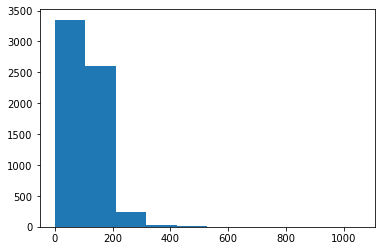

In [67]:
plt.hist(max_sipm_by_event)
plt.show()

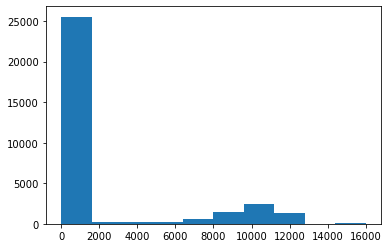

In [68]:
plt.hist(events_energy, range = (0, 16000))
plt.show()

In [69]:
len(max_sipm_by_event[max_sipm_by_event > 1])/len(max_sipm_by_event)

0.9922866784509079

In [70]:
sipms_nonzero_mask = np.array(max_sipm_by_event) > 1

In [71]:
sel_events_sum_sipms[0]

array([ 0.        ,  0.        , -1.05670391, ...,  0.        ,
        0.        ,  0.        ])

In [72]:
np.mean([])

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


nan

In [73]:
num_hits = [] # number of > 1 pe events per SiPM
num_hi_hits = [] # number of events with at least 10% of signal

nhitstart = time()
for sipm in range(nsipms):
    if sipm % 100 == 0:
        print(sipm, '...', '; time =', round((time() - nhitstart)/60, 1))
    
    hits = [ sum_sipms[sipm] > 1 for sum_sipms in sel_events_sum_sipms ]
    hits_hi = [ sum_sipms[sipm] > 0.1 * np.max(sum_sipms) for sum_sipms in sel_events_sum_sipms ]
    num_hits.append(np.sum(hits))
    num_hi_hits.append(np.sum(hits_hi))

0 ... ; time = 0.0
100 ... ; time = 0.1
200 ... ; time = 0.2
300 ... ; time = 0.3
400 ... ; time = 0.4
500 ... ; time = 0.5
600 ... ; time = 0.6
700 ... ; time = 0.7
800 ... ; time = 0.8
900 ... ; time = 0.9
1000 ... ; time = 0.9
1100 ... ; time = 1.0
1200 ... ; time = 1.1
1300 ... ; time = 1.2
1400 ... ; time = 1.3
1500 ... ; time = 1.4
1600 ... ; time = 1.5
1700 ... ; time = 1.6


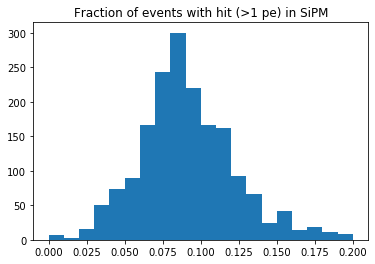

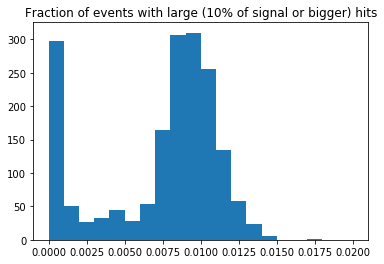

In [74]:
frac_hit = np.array(num_hits) / len(sel_events_sum_sipms)
plt.hist(frac_hit, bins = 20, range = (0, 0.2))
plt.title('Fraction of events with hit (>1 pe) in SiPM')
plt.show()

frac_hi_hit = np.array(num_hi_hits) / len(sel_events_sum_sipms)
plt.hist(frac_hi_hit, bins = 20, range = (0, 0.02))
plt.title('Fraction of events with large (10% of signal or bigger) hits')
plt.show()

In [75]:
np.argmax(frac_hit)

1346

In [76]:
np.argmax(frac_hi_hit)

1579

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700


/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:23: RuntimeWarning: invalid value encountered in true_divide
/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:24: RuntimeWarning: invalid value encountered in true_divide


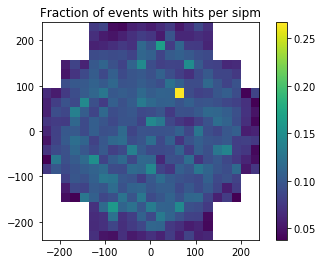

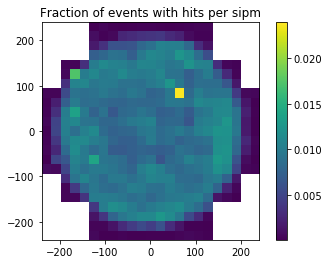

In [77]:
clim2 = 240
nbins = 23
dc = 2.0 * clim2 / nbins

hi_hits_xy = np.zeros((nbins, nbins))
hits_xy = np.zeros((nbins, nbins))
nsipms_xy = np.zeros((nbins, nbins))

for sipm in range(nsipms):
    
    if sipm % 100 == 0:
        print(sipm)
    
    myX = DataSiPM.X[sipm]
    myY = DataSiPM.Y[sipm]
    if abs(myX) < clim2 and abs(myY) < clim2:
        xbin = int(np.floor((myX + clim2) / dc))
        ybin = int(np.floor((myY + clim2) / dc))
        hits_xy[xbin][ybin] += frac_hit[sipm]
        hi_hits_xy[xbin][ybin] += frac_hi_hit[sipm]
        nsipms_xy[xbin][ybin] += 1
    
avghits_xy = hits_xy / nsipms_xy
avg_hi_hits_xy = hi_hits_xy / nsipms_xy

plt.imshow(avghits_xy, extent=[-clim2, clim2, -clim2, clim2], origin='lower')
plt.colorbar()
plt.title('Fraction of events with hits per sipm')
plt.show()

plt.imshow(avg_hi_hits_xy, extent=[-clim2, clim2, -clim2, clim2], origin='lower')
plt.colorbar()
plt.title('Fraction of events with hits per sipm')
plt.show()

In [78]:
# Correct SiPMs individually
correction_factors = []
sipmstart = time()

for sipm in range(nsipms):
    if sipm % 100 == 0:
        print(sipm, '...', '; time =', round((time() - sipmstart)/60, 1))
        
    all_energies = np.array([ sum_sipms[sipm] for sum_sipms in sel_events_sum_sipms ])
    sipm_high = np.array([ sum_sipms[sipm] >= 0.1 * np.max(sum_sipms) for sum_sipms in sel_events_sum_sipms ])
    #plt.hist(all_energies[sipm_high & sipms_nonzero_mask])
    #plt.yscale('log')
    #plt.show()
    #print('Mean = ', np.mean(all_energies[sipm_high & sipms_nonzero_mask]))
    factor = np.mean(all_energies[sipm_high & sipms_nonzero_mask])
    if np.isnan(factor) or factor == 0:
        correction_factors.append(0)
    else:
        correction_factors.append(1 / factor)

0 ... ; time = 0.0
100 ... ; time = 0.1
200 ... ; time = 0.2
300 ... ; time = 0.3
400 ... ; time = 0.4
500 ... ; time = 0.5
600 ... ; time = 0.5
700 ... ; time = 0.6
800 ... ; time = 0.7
900 ... ; time = 0.8
1000 ... ; time = 0.9
1100 ... ; time = 1.0
1200 ... ; time = 1.1
1300 ... ; time = 1.2
1400 ... ; time = 1.3
1500 ... ; time = 1.4
1600 ... ; time = 1.5
1700 ... ; time = 1.5


In [79]:
correction_factors = np.array(correction_factors)

In [80]:
sel_events_sum_sipms_cor = [ sum_sipms * correction_factors for sum_sipms in sel_events_sum_sipms ]

In [81]:
# events_X_sipm_subtracted = np.array(np.array(all_data['events_X_sipm_subtracted']))
# events_Y_sipm_subtracted = np.array(np.array(all_data['events_Y_sipm_subtracted']))
# events_prewindow_sum_sipms = np.array(np.array(all_data['events_prewindow_sum_sipms']))
# events_sum_sipms = np.array(np.array(all_data['events_sum_sipms']))
# events_sum_sipms_subtracted = np.array(np.array(all_data['events_sum_sipms_subtracted']))
# events_maxsipm_subtracted = np.array(np.array(all_data['events_maxsipm_subtracted']))

clim2 = 240
nbins = 21
dc = 2.0 * clim2 / nbins
show = False

Xrwtcor = []
Yrwtcor = []

xystart = time()

for i in range(len(sel_events_sum_sipms_cor)):
    
    if i % 100 == 0:
        print(i, '/', len(sel_events_sum_sipms_cor), '; time =', round((time() - xystart)/60, 1))
    
    if show:
        print('TEST EVENT', i)
    
    energy_dist = np.zeros((nbins, nbins))
    
    if show:
        plt.hist(sel_events_sum_sipms_cor[i][sel_events_sum_sipms_cor[i] != 0])
        plt.yscale('log')
        plt.show()

    for sipm in range(nsipms):
        myX = DataSiPM.X[sipm]
        myY = DataSiPM.Y[sipm]
        xbin = int(np.floor((myX + clim2) / dc))
        ybin = int(np.floor((myY + clim2) / dc))
        energy_dist[xbin][ybin] += sel_events_sum_sipms_cor[i][sipm]

    energy_dist_cut = np.copy(energy_dist)
    for xbin in range(len(energy_dist)):
        for ybin in range(len(energy_dist[xbin])):
            if energy_dist[xbin][ybin] == 0:
                energy_dist[xbin][ybin] = np.nan
            if energy_dist_cut[xbin][ybin] < np.nanmax(energy_dist_cut) / 10:
                energy_dist_cut[xbin][ybin] = np.nan

    if show:
        plt.imshow(energy_dist, extent=[-clim2, clim2, -clim2, clim2], origin='lower')
        plt.colorbar()
        plt.title('Event energy distribution')
        plt.show()

        plt.imshow(energy_dist_cut, extent=[-clim2, clim2, -clim2, clim2], origin='lower')
        plt.colorbar()
        plt.title('Event energy distribution, ignore bins with < max / 4 pes')
        plt.show()

    maxX = sel_events_X_sipm_subtracted[i]
    maxY = sel_events_Y_sipm_subtracted[i]

    # Get weighted location
    xsum = 0
    ysum = 0
    weights = 0
    for sipm in range(nsipms):
        if sel_events_sum_sipms_cor[i][sipm] >= np.nanmax(sel_events_sum_sipms_cor[i] / 10):
            xsum += DataSiPM.X[sipm] * sel_events_sum_sipms_cor[i][sipm]
            ysum += DataSiPM.Y[sipm] * sel_events_sum_sipms_cor[i][sipm]
            weights += sel_events_sum_sipms_cor[i][sipm]
    xsum /= weights
    ysum /= weights
    xsum = round(xsum, 1)
    ysum = round(ysum, 1)
    Xrwtcor.append(xsum)
    Yrwtcor.append(ysum)
    
    if show:
        print('Max SiPM location =', maxX, ',', maxY)
        print('Location from avg =', xsum, ',', ysum)

0 / 6223 ; time = 0.0
100 / 6223 ; time = 0.3
200 / 6223 ; time = 0.6


/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:71: RuntimeWarning: invalid value encountered in double_scalars
/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:72: RuntimeWarning: invalid value encountered in double_scalars


300 / 6223 ; time = 0.9
400 / 6223 ; time = 1.2
500 / 6223 ; time = 1.5
600 / 6223 ; time = 1.8
700 / 6223 ; time = 2.1
800 / 6223 ; time = 2.3
900 / 6223 ; time = 2.6
1000 / 6223 ; time = 2.9
1100 / 6223 ; time = 3.2
1200 / 6223 ; time = 3.5
1300 / 6223 ; time = 3.8
1400 / 6223 ; time = 4.1
1500 / 6223 ; time = 4.5
1600 / 6223 ; time = 4.8
1700 / 6223 ; time = 5.1
1800 / 6223 ; time = 5.4
1900 / 6223 ; time = 5.7
2000 / 6223 ; time = 6.0
2100 / 6223 ; time = 6.3
2200 / 6223 ; time = 6.6
2300 / 6223 ; time = 6.9
2400 / 6223 ; time = 7.2
2500 / 6223 ; time = 7.4
2600 / 6223 ; time = 7.7
2700 / 6223 ; time = 8.0
2800 / 6223 ; time = 8.3
2900 / 6223 ; time = 8.6
3000 / 6223 ; time = 8.9
3100 / 6223 ; time = 9.2
3200 / 6223 ; time = 9.4
3300 / 6223 ; time = 9.7
3400 / 6223 ; time = 10.0
3500 / 6223 ; time = 10.3
3600 / 6223 ; time = 10.6
3700 / 6223 ; time = 10.9
3800 / 6223 ; time = 11.1
3900 / 6223 ; time = 11.4
4000 / 6223 ; time = 11.7
4100 / 6223 ; time = 12.0
4200 / 6223 ; time = 12.

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


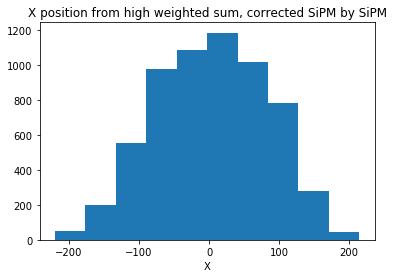

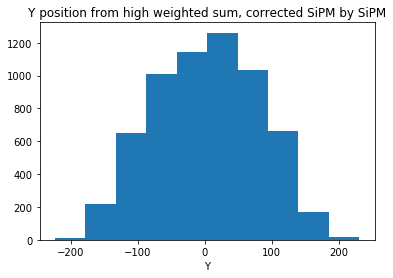

In [82]:
plt.hist(Xrwtcor)
plt.title('X position from high weighted sum, corrected SiPM by SiPM')
plt.xlabel('X')
plt.show()

plt.hist(Yrwtcor)
plt.title('Y position from high weighted sum, corrected SiPM by SiPM')
plt.xlabel('Y')
plt.show()

In [83]:
# events_X_sipm_subtracted = np.array(np.array(all_data['events_X_sipm_subtracted']))
# events_Y_sipm_subtracted = np.array(np.array(all_data['events_Y_sipm_subtracted']))
# events_prewindow_sum_sipms = np.array(np.array(all_data['events_prewindow_sum_sipms']))
# events_sum_sipms = np.array(np.array(all_data['events_sum_sipms']))
# events_sum_sipms_subtracted = np.array(np.array(all_data['events_sum_sipms_subtracted']))
# events_maxsipm_subtracted = np.array(np.array(all_data['events_maxsipm_subtracted']))

clim2 = 240
nbins = 21
dc = 2.0 * clim2 / nbins
show = False

Xrwt = []
Yrwt = []

xystart = time()

for i in range(len(sel_events_sum_sipms)):
    
    if i % 100 == 0:
        print(i, '/', len(sel_events_sum_sipms), '; time =', round((time() - xystart)/60, 1))
    
    if show:
        print('TEST EVENT', i)
    
    energy_dist = np.zeros((nbins, nbins))
    
    if show:
        plt.hist(sel_events_sum_sipms[i][sel_events_sum_sipms[i] != 0])
        plt.yscale('log')
        plt.show()

    for sipm in range(nsipms):
        myX = DataSiPM.X[sipm]
        myY = DataSiPM.Y[sipm]
        xbin = int(np.floor((myX + clim2) / dc))
        ybin = int(np.floor((myY + clim2) / dc))
        energy_dist[xbin][ybin] += sel_events_sum_sipms[i][sipm]

    energy_dist_cut = np.copy(energy_dist)
    for xbin in range(len(energy_dist)):
        for ybin in range(len(energy_dist[xbin])):
            if energy_dist[xbin][ybin] == 0:
                energy_dist[xbin][ybin] = np.nan
            if energy_dist_cut[xbin][ybin] < np.nanmax(energy_dist_cut) / 10:
                energy_dist_cut[xbin][ybin] = np.nan

    if show:
        plt.imshow(energy_dist, extent=[-clim2, clim2, -clim2, clim2], origin='lower')
        plt.colorbar()
        plt.title('Event energy distribution')
        plt.show()

        plt.imshow(energy_dist_cut, extent=[-clim2, clim2, -clim2, clim2], origin='lower')
        plt.colorbar()
        plt.title('Event energy distribution, ignore bins with < max / 4 pes')
        plt.show()

    maxX = sel_events_X_sipm_subtracted[i]
    maxY = sel_events_Y_sipm_subtracted[i]

    # Get weighted location
    xsum = 0
    ysum = 0
    weights = 0
    for sipm in range(nsipms):
        if sel_events_sum_sipms[i][sipm] >= np.nanmax(sel_events_sum_sipms[i] / 10):
            xsum += DataSiPM.X[sipm] * sel_events_sum_sipms[i][sipm]
            ysum += DataSiPM.Y[sipm] * sel_events_sum_sipms[i][sipm]
            weights += sel_events_sum_sipms[i][sipm]
    xsum /= weights
    ysum /= weights
    xsum = round(xsum, 1)
    ysum = round(ysum, 1)
    Xrwt.append(xsum)
    Yrwt.append(ysum)
    
    if show:
        print('Max SiPM location =', maxX, ',', maxY)
        print('Location from avg =', xsum, ',', ysum)

0 / 6223 ; time = 0.0
100 / 6223 ; time = 0.3
200 / 6223 ; time = 0.6


/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:71: RuntimeWarning: invalid value encountered in double_scalars
/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:72: RuntimeWarning: invalid value encountered in double_scalars


300 / 6223 ; time = 0.8
400 / 6223 ; time = 1.1
500 / 6223 ; time = 1.4
600 / 6223 ; time = 1.7
700 / 6223 ; time = 2.0
800 / 6223 ; time = 2.3
900 / 6223 ; time = 2.6
1000 / 6223 ; time = 2.9
1100 / 6223 ; time = 3.1
1200 / 6223 ; time = 3.4
1300 / 6223 ; time = 3.7
1400 / 6223 ; time = 4.0
1500 / 6223 ; time = 4.3
1600 / 6223 ; time = 4.6
1700 / 6223 ; time = 4.8
1800 / 6223 ; time = 5.1
1900 / 6223 ; time = 5.4
2000 / 6223 ; time = 5.7
2100 / 6223 ; time = 6.0
2200 / 6223 ; time = 6.2
2300 / 6223 ; time = 6.5
2400 / 6223 ; time = 6.8
2500 / 6223 ; time = 7.1
2600 / 6223 ; time = 7.4
2700 / 6223 ; time = 7.7
2800 / 6223 ; time = 7.9
2900 / 6223 ; time = 8.2
3000 / 6223 ; time = 8.5
3100 / 6223 ; time = 8.8
3200 / 6223 ; time = 9.1
3300 / 6223 ; time = 9.4
3400 / 6223 ; time = 9.6
3500 / 6223 ; time = 9.9
3600 / 6223 ; time = 10.2
3700 / 6223 ; time = 10.5
3800 / 6223 ; time = 10.8
3900 / 6223 ; time = 11.0
4000 / 6223 ; time = 11.3
4100 / 6223 ; time = 11.6
4200 / 6223 ; time = 11.9


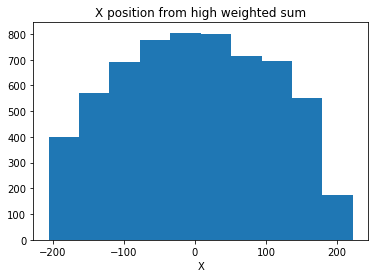

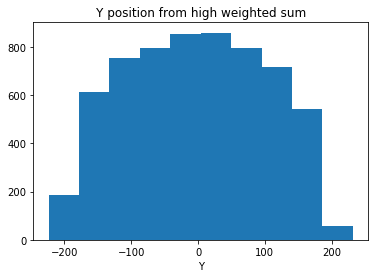

In [84]:
plt.hist(Xrwt)
plt.title('X position from high weighted sum')
plt.xlabel('X')
plt.show()

plt.hist(Yrwt)
plt.title('Y position from high weighted sum')
plt.xlabel('Y')
plt.show()

TEST EVENT 0


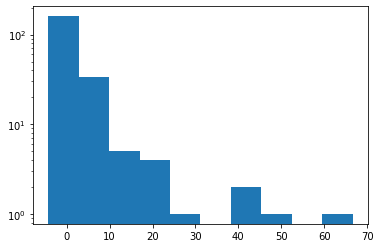

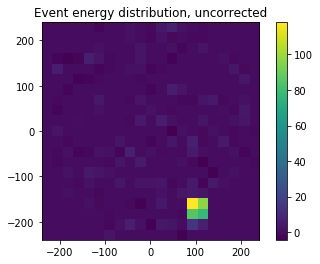

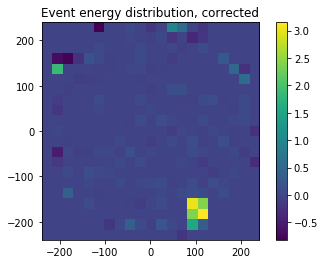

Max SiPM location      = -165.0 , 95.0
Location from avg      = -169.4 , 99.9
Location from avg, cor = -85.6 , 64.5
TEST EVENT 1


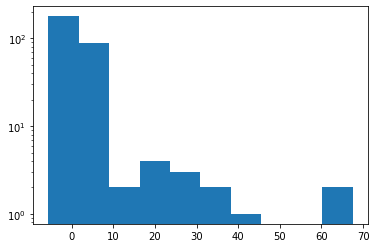

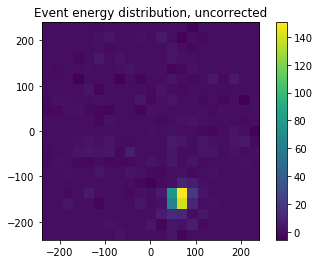

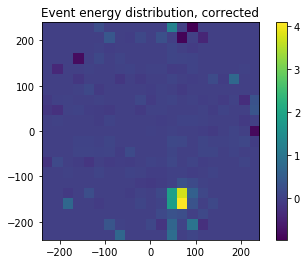

Max SiPM location      = -145.0 , 65.0
Location from avg      = -148.2 , 63.3
Location from avg, cor = -94.9 , 46.3
TEST EVENT 2


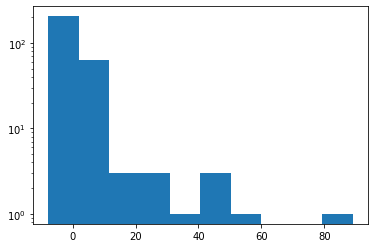

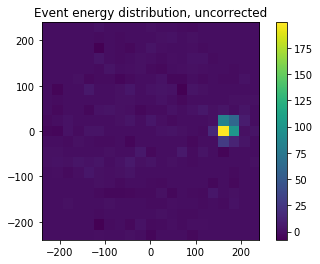

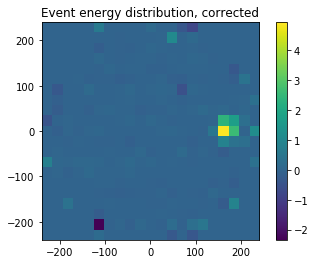

Max SiPM location      = 5.0 , 165.0
Location from avg      = 5.0 , 166.8
Location from avg, cor = -4.5 , 127.1
TEST EVENT 3


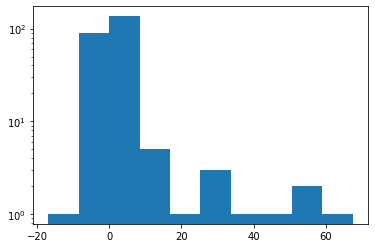

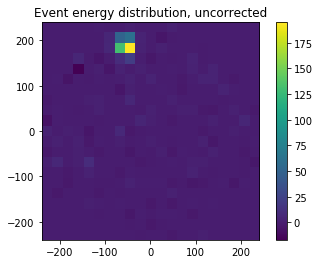

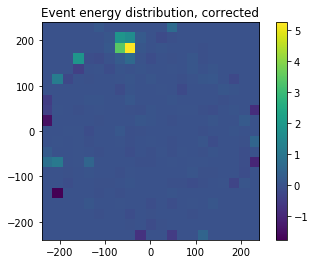

Max SiPM location      = 175.0 , -55.0
Location from avg      = 174.2 , -60.2
Location from avg, cor = 124.2 , -70.4
TEST EVENT 4


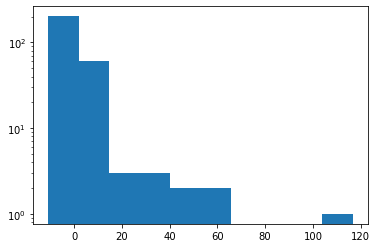

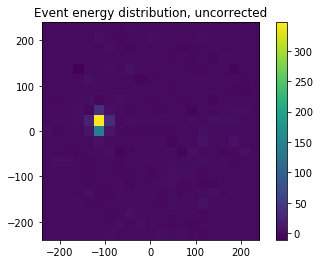

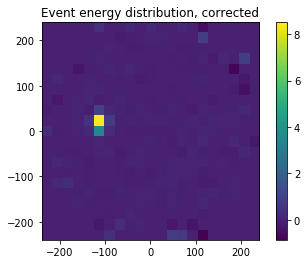

Max SiPM location      = 15.0 , -115.0
Location from avg      = 15.1 , -114.2
Location from avg, cor = 1.9 , -76.7
TEST EVENT 5


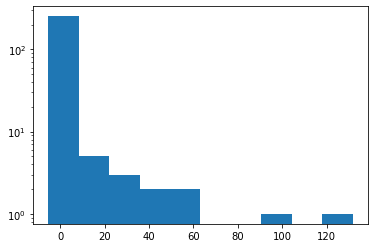

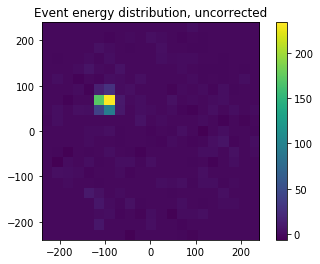

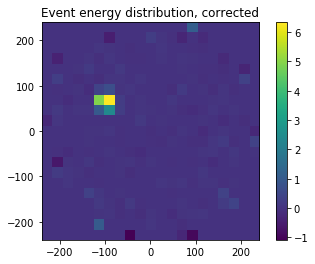

Max SiPM location      = 65.0 , -95.0
Location from avg      = 65.3 , -97.8
Location from avg, cor = 60.7 , -65.7
TEST EVENT 6


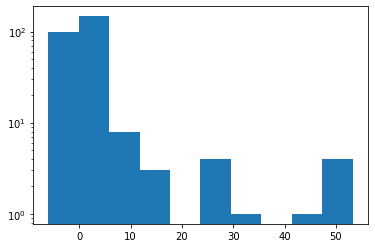

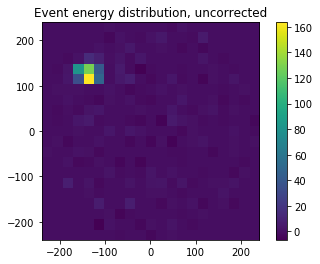

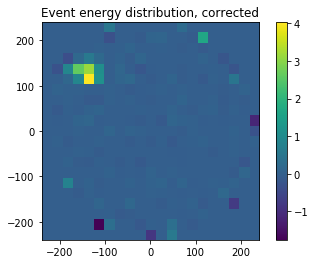

Max SiPM location      = 135.0 , -135.0
Location from avg      = 128.2 , -141.7
Location from avg, cor = 104.4 , -95.9
TEST EVENT 7


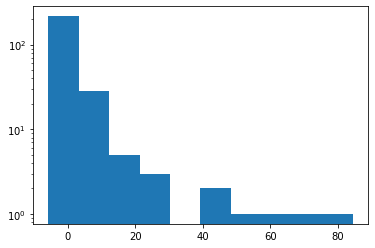

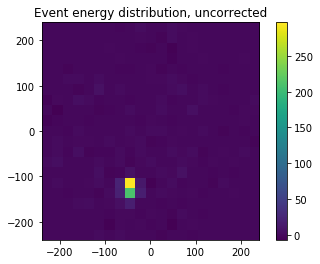

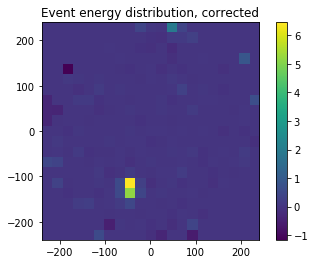

Max SiPM location      = -125.0 , -45.0
Location from avg      = -128.8 , -45.8
Location from avg, cor = -59.1 , -18.0
TEST EVENT 8


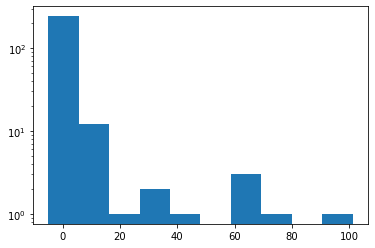

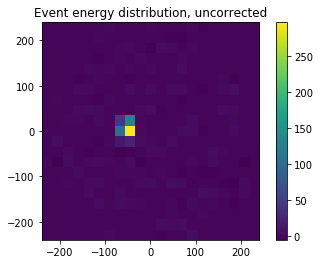

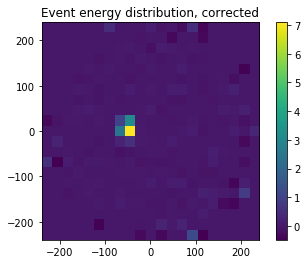

Max SiPM location      = 5.0 , -55.0
Location from avg      = 4.5 , -53.7
Location from avg, cor = -11.8 , -21.6
TEST EVENT 9


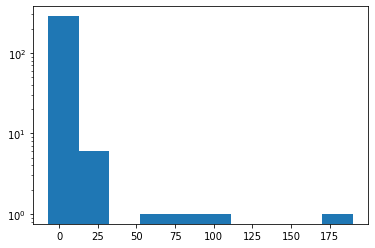

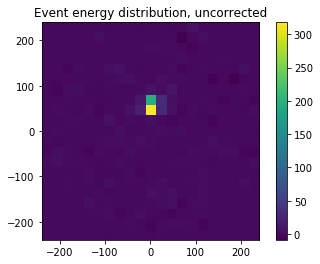

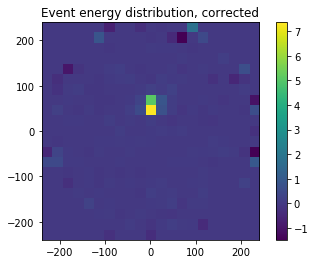

Max SiPM location      = 55.0 , 5.0
Location from avg      = 58.5 , 1.8
Location from avg, cor = 77.8 , 24.2


In [85]:
# events_X_sipm_subtracted = np.array(np.array(all_data['events_X_sipm_subtracted']))
# events_Y_sipm_subtracted = np.array(np.array(all_data['events_Y_sipm_subtracted']))
# events_prewindow_sum_sipms = np.array(np.array(all_data['events_prewindow_sum_sipms']))
# events_sum_sipms = np.array(np.array(all_data['events_sum_sipms']))
# events_sum_sipms_subtracted = np.array(np.array(all_data['events_sum_sipms_subtracted']))
# events_maxsipm_subtracted = np.array(np.array(all_data['events_maxsipm_subtracted']))

clim2 = 240
nbins = 21
dc = 2.0 * clim2 / nbins
show = True

xystart = time()

for i in range(10):
    
    if show:
        print('TEST EVENT', i)
    
    energy_dist = np.zeros((nbins, nbins))
    energy_dist_cor = np.zeros((nbins, nbins))
    
    if show:
        plt.hist(sel_events_sum_sipms[i][sel_events_sum_sipms[i] != 0])
        plt.yscale('log')
        plt.show()

    for sipm in range(nsipms):
        myX = DataSiPM.X[sipm]
        myY = DataSiPM.Y[sipm]
        xbin = int(np.floor((myX + clim2) / dc))
        ybin = int(np.floor((myY + clim2) / dc))
        energy_dist[xbin][ybin] += sel_events_sum_sipms[i][sipm]
        energy_dist_cor[xbin][ybin] += sel_events_sum_sipms_cor[i][sipm]

#     energy_dist_cut = np.copy(energy_dist)
#     for xbin in range(len(energy_dist)):
#         for ybin in range(len(energy_dist[xbin])):
#             if energy_dist[xbin][ybin] == 0:
#                 energy_dist[xbin][ybin] = np.nan
#             if energy_dist_cut[xbin][ybin] < np.nanmax(energy_dist_cut) / 10:
#                 energy_dist_cut[xbin][ybin] = np.nan

    if show:
        plt.imshow(energy_dist, extent=[-clim2, clim2, -clim2, clim2], origin='lower')
        plt.colorbar()
        plt.title('Event energy distribution, uncorrected')
        plt.show()

        plt.imshow(energy_dist_cor, extent=[-clim2, clim2, -clim2, clim2], origin='lower')
        plt.colorbar()
        plt.title('Event energy distribution, corrected')
        plt.show()

#         plt.imshow(energy_dist_cut, extent=[-clim2, clim2, -clim2, clim2], origin='lower')
#         plt.colorbar()
#         plt.title('Event energy distribution, ignore bins with < max / 4 pes')
#         plt.show()

    maxX = sel_events_X_sipm_subtracted[i]
    maxY = sel_events_Y_sipm_subtracted[i]

    # Get weighted location
    xsum = 0
    ysum = 0
    weights = 0
    for sipm in range(nsipms):
        if sel_events_sum_sipms[i][sipm] >= np.nanmax(sel_events_sum_sipms[i] / 10):
            xsum += DataSiPM.X[sipm] * sel_events_sum_sipms[i][sipm]
            ysum += DataSiPM.Y[sipm] * sel_events_sum_sipms[i][sipm]
            weights += sel_events_sum_sipms[i][sipm]
    xsum /= weights
    ysum /= weights
    xsum = round(xsum, 1)
    ysum = round(ysum, 1)
    
    # Get weighted location, cor
    xsumc = 0
    ysumc = 0
    weights = 0
    for sipm in range(nsipms):
        if sel_events_sum_sipms_cor[i][sipm] >= np.nanmax(sel_events_sum_sipms_cor[i] / 10):
            xsumc += DataSiPM.X[sipm] * sel_events_sum_sipms_cor[i][sipm]
            ysumc += DataSiPM.Y[sipm] * sel_events_sum_sipms_cor[i][sipm]
            weights += sel_events_sum_sipms_cor[i][sipm]
    xsumc /= weights
    ysumc /= weights
    xsumc = round(xsumc, 1)
    ysumc = round(ysumc, 1)

    if show:
        print('Max SiPM location      =', maxX, ',', maxY)
        print('Location from avg      =', xsum, ',', ysum)
        print('Location from avg, cor =', xsumc, ',', ysumc)

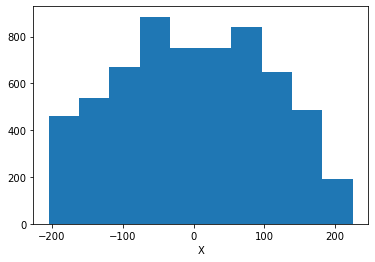

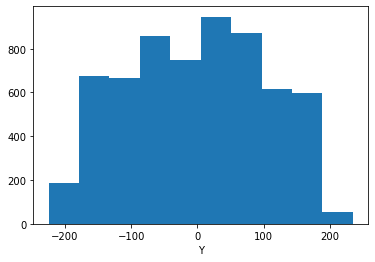

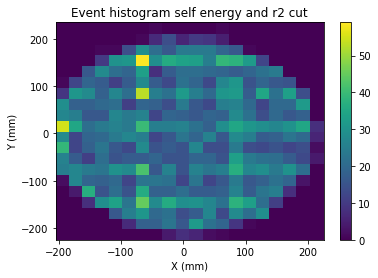

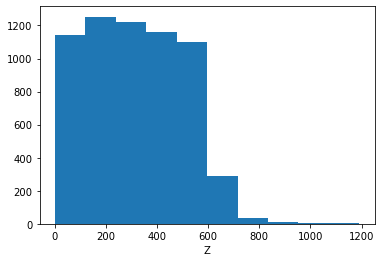

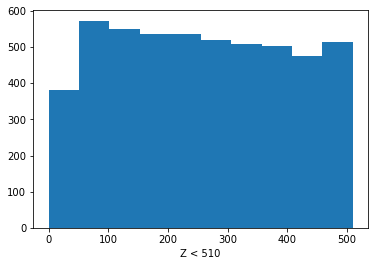

In [86]:
plt.hist(all_Xs[selfmask])
plt.xlabel('X')
plt.show()

plt.hist(all_Ys[selfmask])
plt.xlabel('Y')
plt.show()

hxy = plt.hist2d(all_Xs[selfmask], all_Ys[selfmask], bins = 20)
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.title('Event histogram self energy and r2 cut')
plt.colorbar(hxy[3])
plt.show()

plt.hist(all_Zgauss[selfmask])
plt.xlabel('Z')
plt.show()

plt.hist(all_Zgauss[selfmask], range=(0, 510))
plt.xlabel('Z < 510')
plt.show()

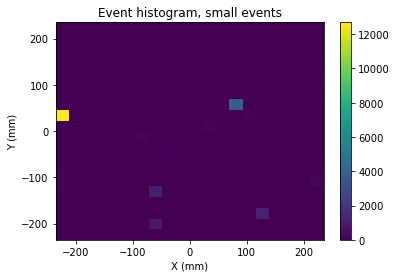

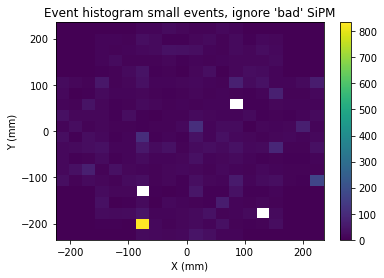

In [87]:
nobadsipm = (all_Xs != -235) & (all_Ys != 45)
smallevents = events_energy < 600

hxy = plt.hist2d(all_Xs[smallevents], all_Ys[smallevents], bins = 20)
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.title('Event histogram, small events')
plt.colorbar(hxy[3])
plt.show()

hxy = plt.hist2d(all_Xs[smallevents & nobadsipm], all_Ys[smallevents & nobadsipm], bins = 20, cmax = 1000)
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.title('Event histogram small events, ignore \'bad\' SiPM')
plt.colorbar(hxy[3])
plt.show()

## SiPM information

In [88]:
events_prewindow_sipm_summed = np.array([ np.sum(events_prewindow_sum_sipms[i]) for i in range(len(events_prewindow_sum_sipms)) ])

In [89]:
maskprepmt  = (events_prewindow_sums < 150) & (events_prewindow_sums > -150)
maskpresipm = (events_prewindow_sipm_summed < 270) & (events_prewindow_sipm_summed > 150)

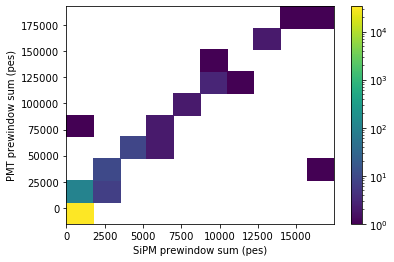

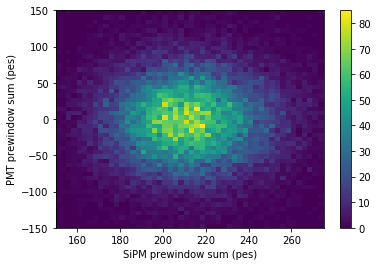

In [90]:
import matplotlib as mpl

hnoise = plt.hist2d(events_prewindow_sipm_summed, events_prewindow_sums, norm=mpl.colors.LogNorm())
plt.xlabel('SiPM prewindow sum (pes)')
plt.ylabel('PMT prewindow sum (pes)')
plt.colorbar(hnoise[3])
plt.show()

hnoise = plt.hist2d(events_prewindow_sipm_summed, events_prewindow_sums, bins = 50, range=((150,275),(-150,150)))
plt.xlabel('SiPM prewindow sum (pes)')
plt.ylabel('PMT prewindow sum (pes)')
plt.colorbar(hnoise[3])
plt.show()

## Small event investigation

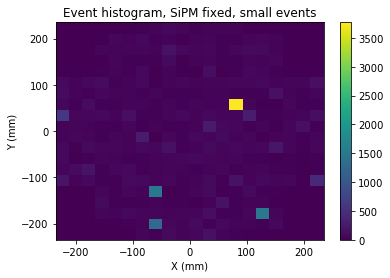

In [91]:
nobadsipm = (all_Xs != -235) & (all_Ys != 45)
smallevents = events_energy_subtracted < 600

hxy = plt.hist2d(events_X_sipm_subtracted[smallevents], events_Y_sipm_subtracted[smallevents], bins = 20)
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.title('Event histogram, SiPM fixed, small events')
plt.colorbar(hxy[3])
#plt.clim(0, 100)
plt.show()

In [92]:
event_signal_in_max_sipm = np.array([ np.max(e) for e in events_sum_sipms_subtracted ])

Mode x,y = 85.0 , 65.0


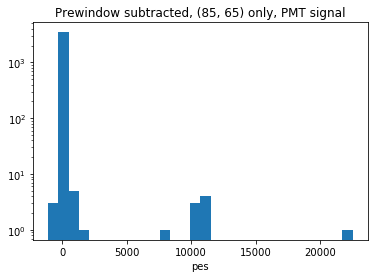

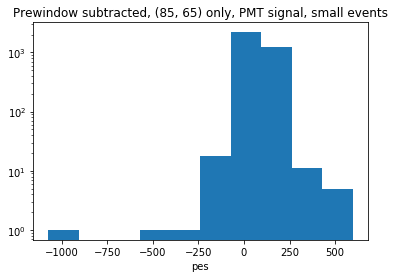

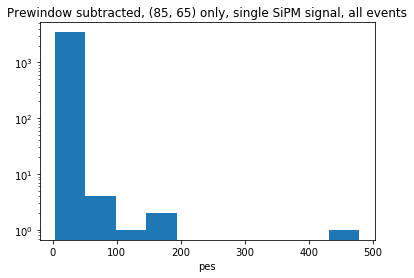

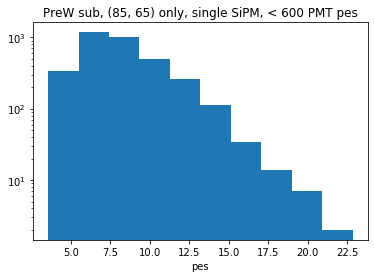

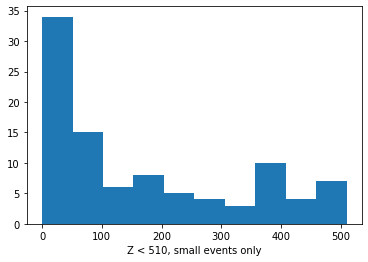

In [93]:
from scipy import stats
xmode = stats.mode(events_X_sipm_subtracted[smallevents]).mode[0]
ymode = stats.mode(events_Y_sipm_subtracted[smallevents]).mode[0]
print('Mode x,y =', xmode, ',', ymode)

high_sipm_cut = (events_X_sipm_subtracted == xmode) & (events_Y_sipm_subtracted == ymode)

plt.title('Prewindow subtracted, (85, 65) only, PMT signal')
plt.hist(events_energy_subtracted[high_sipm_cut], bins = 30)
plt.yscale('log')
plt.xlabel('pes')
plt.show()

plt.title('Prewindow subtracted, (85, 65) only, PMT signal, small events')
plt.hist(events_energy_subtracted[high_sipm_cut & smallevents], bins = 10)
plt.yscale('log')
plt.xlabel('pes')
plt.show()

plt.title('Prewindow subtracted, (85, 65) only, single SiPM signal, all events')
plt.hist(event_signal_in_max_sipm[high_sipm_cut], bins = 10)
plt.yscale('log')
plt.xlabel('pes')
plt.show()

plt.title('PreW sub, (85, 65) only, single SiPM, < 600 PMT pes')
plt.hist(event_signal_in_max_sipm[high_sipm_cut & smallevents], bins = 10)
plt.yscale('log')
plt.xlabel('pes')
plt.show()

plt.hist(all_Zgauss[high_sipm_cut & smallevents], range=(0, 510))
plt.xlabel('Z < 510, small events only')
plt.show()

In [94]:
max_signal_sipm = np.zeros(len(events_sum_sipms_subtracted[0]))
for i in range(len(max_signal_sipm)):
    all_signals_sipm = [ events_sum_sipms_subtracted[e][i] for e in range(len(events_sum_sipms_subtracted)) ]
    max_signal_sipm[i] = np.max(all_signals_sipm)

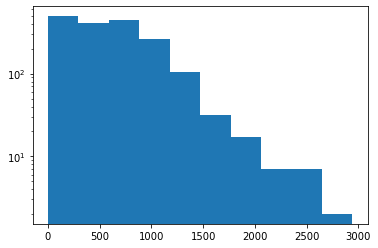

In [95]:
plt.hist(max_signal_sipm)
plt.yscale('log')
plt.show()

In [96]:
events_summed_sipms_subtracted = np.array([ np.sum(sipms) for sipms in events_sum_sipms_subtracted ])
events_summed_sipms = np.array([ np.sum(sipms) for sipms in events_sum_sipms ])

In [97]:
SiPMFullCut = (np.percentile(events_summed_sipms[selfmask & maskpresipm], 5), np.percentile(events_summed_sipms[selfmask & maskpresipm], 95))
SiPMSubCut  =  (np.percentile(events_summed_sipms_subtracted[selfmask & maskpresipm], 5), np.percentile(events_summed_sipms_subtracted[selfmask & maskpresipm], 95))

In [98]:
print('Current time =', round((time() - t0)/60, 1), 'm')

Current time = 55.1 m


## SiPM spectra, and SiPM vs PMT comparison

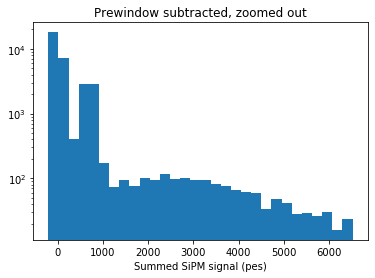

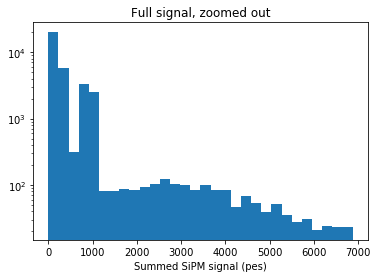

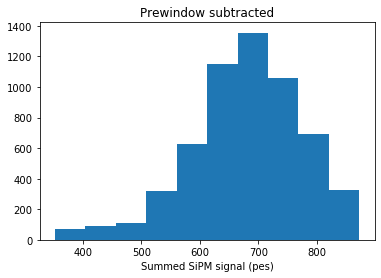

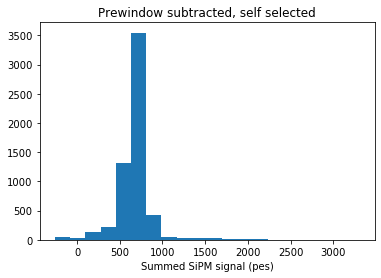

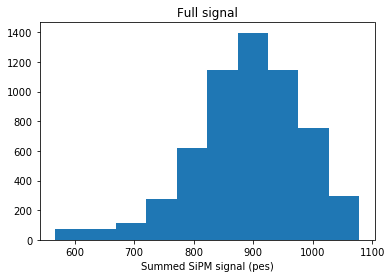

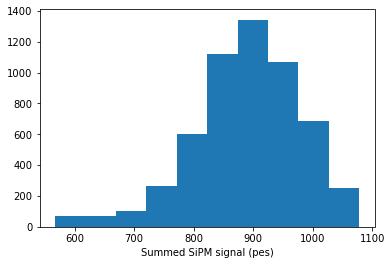

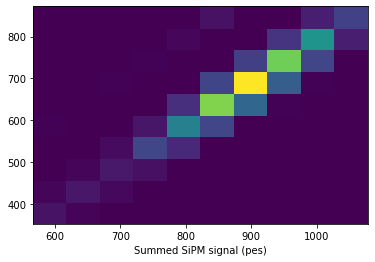

In [99]:
plt.title('Prewindow subtracted, zoomed out')
plt.hist(events_summed_sipms_subtracted, range=(np.percentile(events_summed_sipms_subtracted, 1), np.percentile(events_summed_sipms_subtracted, 99)), bins = 30)
plt.yscale('log')
plt.xlabel('Summed SiPM signal (pes)')
plt.show()

plt.title('Full signal, zoomed out')
plt.hist(events_summed_sipms, range=(0, np.percentile(events_summed_sipms, 99)), bins = 30)
plt.yscale('log')
plt.xlabel('Summed SiPM signal (pes)')
plt.show()

plt.title('Prewindow subtracted')
plt.hist(events_summed_sipms_subtracted, range=SiPMSubCut)
plt.xlabel('Summed SiPM signal (pes)')
plt.show()

plt.title('Prewindow subtracted, self selected')
plt.hist(events_summed_sipms_subtracted[selfmask & maskpresipm], bins = 20)
plt.xlabel('Summed SiPM signal (pes)')
plt.show()

plt.title('Full signal')
plt.hist(events_summed_sipms, range=SiPMFullCut)
plt.xlabel('Summed SiPM signal (pes)')
plt.show()

plt.hist(events_summed_sipms[selfmask], range=SiPMFullCut)
plt.xlabel('Summed SiPM signal (pes)')
plt.show()

plt.hist2d(events_summed_sipms, events_summed_sipms_subtracted, range=(SiPMFullCut,SiPMSubCut))
plt.xlabel('Summed SiPM signal (pes)')
plt.show()

In [100]:
print('Current time =', round((time() - t0)/60, 1), 'm')

Current time = 55.2 m


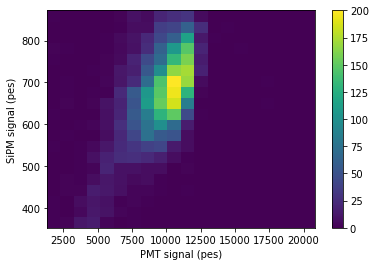

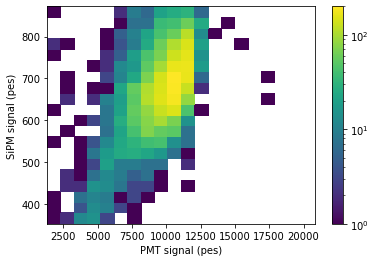

In [101]:
import matplotlib as mpl

hsub = plt.hist2d(events_energy_subtracted[selfmask], events_summed_sipms_subtracted[selfmask], bins = 20, range=(erangeself,SiPMSubCut))
plt.colorbar(hsub[3])
plt.xlabel('PMT signal (pes)')
plt.ylabel('SiPM signal (pes)')
plt.show()

hsub = plt.hist2d(events_energy_subtracted[selfmask], events_summed_sipms_subtracted[selfmask], bins = 20, norm=mpl.colors.LogNorm(), range=(erangeself,SiPMSubCut))
plt.colorbar(hsub[3])
plt.xlabel('PMT signal (pes)')
plt.ylabel('SiPM signal (pes)')
plt.show()

## Bad SiPM determination

In [102]:
num_events_in_sipm = np.zeros(len(events_prewindow_sum_sipms[0]))
for i in range(len(num_events_in_sipm)):
    num_events_in_sipm[i] = np.sum(events_maxsipm_subtracted == i)

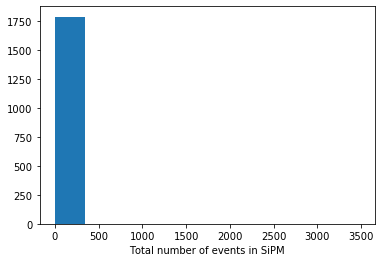

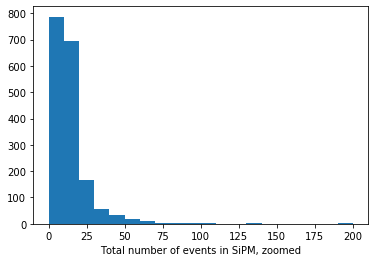

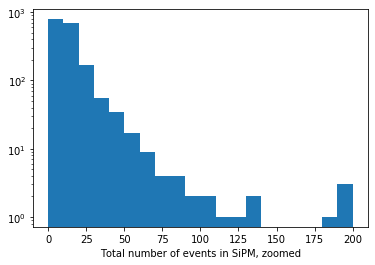

Percentiles (90, 95, 99, 99.9) =
26.0
39.0
91.0
1518.0900000000029


In [103]:
plt.hist(num_events_in_sipm)
plt.xlabel('Total number of events in SiPM')
plt.show()

plt.hist(num_events_in_sipm, range = (0,200), bins = 20)
plt.xlabel('Total number of events in SiPM, zoomed')
plt.show()

plt.hist(num_events_in_sipm, range = (0,200), bins = 20)
plt.xlabel('Total number of events in SiPM, zoomed')
plt.yscale('log')
plt.show()

print('Percentiles (90, 95, 99, 99.9) =')
print(np.percentile(num_events_in_sipm, 90))
print(np.percentile(num_events_in_sipm, 95))
print(np.percentile(num_events_in_sipm, 99))
print(np.percentile(num_events_in_sipm, 99.9))

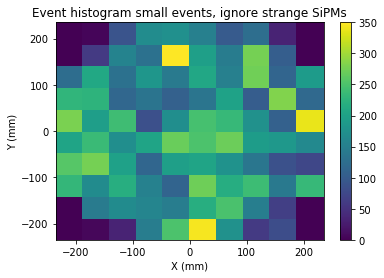

In [104]:
highsipms = np.ones(len(events_maxsipm_subtracted), dtype=bool)
for e in range(len(highsipms)):
    if num_events_in_sipm[events_maxsipm_subtracted[e]] > 150:
        highsipms[e] = False

smallevents = events_energy < 600

hxy = plt.hist2d(events_X_sipm_subtracted[smallevents & highsipms], events_Y_sipm_subtracted[smallevents & highsipms], bins = 10)
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.title('Event histogram small events, ignore strange SiPMs')
plt.colorbar(hxy[3])
plt.show()

In [105]:
presignal_sipm_max = np.zeros(len(events_prewindow_sum_sipms[0]))
presignal_sipm_mean = np.zeros(len(events_prewindow_sum_sipms[0]))
for i in range(len(presignal_sipm_mean)):
    all_signals_sipm = [ events_prewindow_sum_sipms[e][i] for e in range(len(events_prewindow_sum_sipms)) ]
    presignal_sipm_max[i] = np.max(all_signals_sipm)
    presignal_sipm_mean[i] = np.mean(all_signals_sipm)

In [106]:
np.argmax(presignal_sipm_mean)

1346

In [107]:
np.percentile(presignal_sipm_mean, 99)

0.4001275503989565

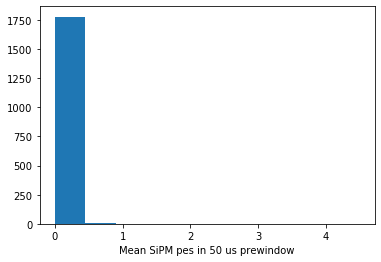

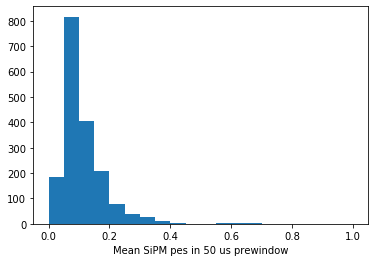

In [108]:
plt.hist(presignal_sipm_mean)
plt.xlabel('Mean SiPM pes in 50 us prewindow')
plt.show()

plt.hist(presignal_sipm_mean, range=(0,1), bins = 20)
plt.xlabel('Mean SiPM pes in 50 us prewindow')
plt.show()

In [109]:
DataSiPM.SensorID[1346]

22002

In [110]:
DataSiPM.X[1346], DataSiPM.Y[1346]

(85.0, 65.0)

In [111]:
high_prewindow_sipms = []
high_nevt_sipms = []
for i in range(nsipms):

    if presignal_sipm_mean[i] > 0.4:
        high_prewindow_sipms.append(i)
        
    if num_events_in_sipm[i] > 150:
        high_nevt_sipms.append(i)
        
print(len(high_prewindow_sipms))
print(high_prewindow_sipms)

print(len(high_nevt_sipms))
print(high_nevt_sipms)

badsipms = []
for i in high_nevt_sipms:
    if high_prewindow_sipms.count(i) != 0:
        badsipms.append(i)
        
print('Definitely bad sipms:', badsipms)

19
[58, 123, 188, 379, 544, 778, 843, 1041, 1086, 1201, 1214, 1247, 1345, 1346, 1352, 1395, 1465, 1579, 1693]
11
[0, 379, 778, 843, 1041, 1086, 1346, 1352, 1465, 1579, 1768]
Definitely bad sipms: [379, 778, 843, 1041, 1086, 1346, 1352, 1465, 1579]


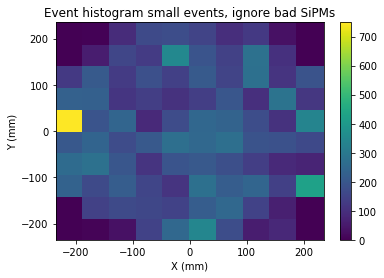

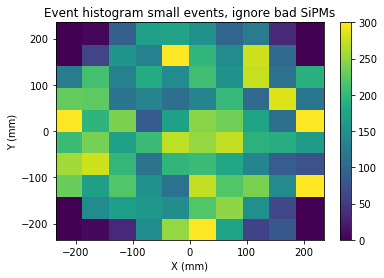

In [112]:
badsipmmask = np.ones(len(events_maxsipm_subtracted), dtype=bool)
for e in range(len(badsipmmask)):
    if badsipms.count(events_maxsipm_subtracted[e]) > 0:
        badsipmmask[e] = False

smallevents = events_energy < 600

hxy = plt.hist2d(events_X_sipm_subtracted[smallevents & badsipmmask], events_Y_sipm_subtracted[smallevents & badsipmmask], bins = 10)
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.title('Event histogram small events, ignore bad SiPMs')
plt.colorbar(hxy[3])
plt.show()

hxy = plt.hist2d(events_X_sipm_subtracted[smallevents & badsipmmask], events_Y_sipm_subtracted[smallevents & badsipmmask], bins = 10)
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.title('Event histogram small events, ignore bad SiPMs')
plt.colorbar(hxy[3])
plt.clim(0, 300)
plt.show()

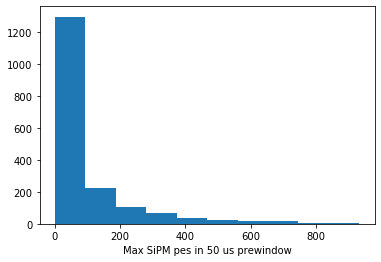

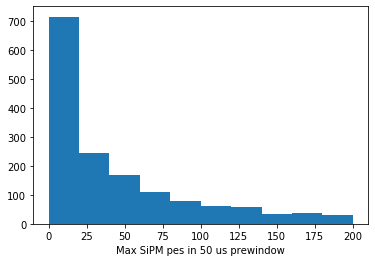

In [113]:
plt.hist(presignal_sipm_max)
plt.xlabel('Max SiPM pes in 50 us prewindow')
plt.show()

plt.hist(presignal_sipm_max, range=(0,200))
plt.xlabel('Max SiPM pes in 50 us prewindow')
plt.show()

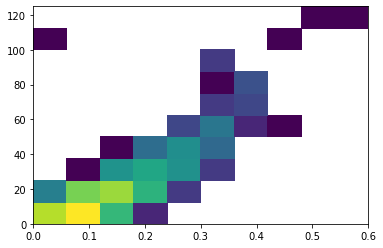

In [114]:
plt.hist2d(presignal_sipm_mean, num_events_in_sipm, range=((0, 0.6),(0, 125)), norm=mpl.colors.LogNorm())
plt.show()

In [115]:
print('Total time =', time() - t0)
print('Total time, min =', (time() - t0)/60)

Total time = 3362.2156410217285
Total time, min = 56.03693866332372


In [116]:
len(DataSiPM.X)

1792

## Investigate signal in SiPMs nearest the max (position determining) SiPM

In [117]:
def nearest(isipm):
    x, y = DataSiPM.X[isipm], DataSiPM.Y[isipm]
    closest = []
    for j in range(len(DataSiPM.X)):
        x1, y1 = DataSiPM.X[j], DataSiPM.Y[j]
        if (x - x1)**2 <= 100 and (y - y1)**2 <= 100 and j != isipm:
            closest.append(j)
    return closest

In [118]:
bright_sipm = stats.mode(events_maxsipm_subtracted).mode[0]
center_sipm = np.argmin(DataSiPM.X**2+DataSiPM.Y**2)

In [119]:
nns_by_sipm = [ nearest(i) for i in range(len(events_sum_sipms_subtracted[0]))]
nns_by_sipm[1]

[0, 2, 8, 9, 10]

In [120]:
nn_sum_vs_evt = []
nn_sum_over_center_vs_evt = []

for e in range(0,len(events_sum_sipms_subtracted)):
    center_sipm = events_maxsipm_subtracted[e]
    inns = nns_by_sipm[center_sipm]
    nnmask = np.arange(0, len(events_sum_sipms_subtracted[e])) == -1
    for inn in inns:
        mask = np.arange(0, len(events_sum_sipms_subtracted[e])) == inn
        nnmask = nnmask | mask
    nbhr_sum = np.sum(events_sum_sipms_subtracted[e][nnmask])
    nn_sum_vs_evt.append(nbhr_sum)
    if events_sum_sipms_subtracted[e][center_sipm] > 0:
        nn_sum_over_center_vs_evt.append(nbhr_sum / events_sum_sipms_subtracted[e][center_sipm])
    else:
        nn_sum_over_center_vs_evt.append(0)
nn_sum_vs_evt = np.array(nn_sum_vs_evt)
nn_sum_over_center_vs_evt = np.array(nn_sum_over_center_vs_evt)

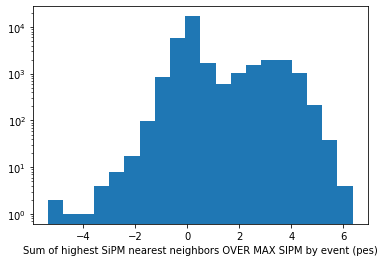

In [121]:
plt.hist(nn_sum_over_center_vs_evt, bins = 20)
plt.xlabel('Sum of highest SiPM nearest neighbors OVER MAX SIPM by event (pes)')
plt.yscale('log')
plt.show()

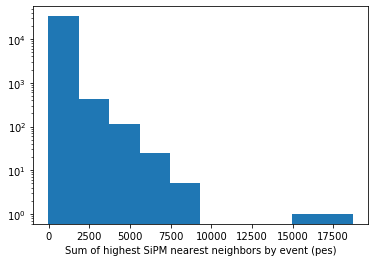

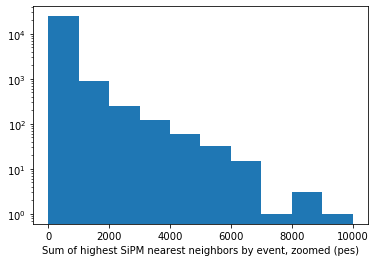

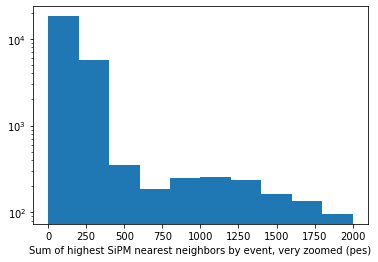

In [122]:
plt.hist(nn_sum_vs_evt)
plt.xlabel('Sum of highest SiPM nearest neighbors by event (pes)')
plt.yscale('log')
plt.show()

plt.hist(nn_sum_vs_evt, range = (0, 10000))
plt.xlabel('Sum of highest SiPM nearest neighbors by event, zoomed (pes)')
plt.yscale('log')
plt.show()

plt.hist(nn_sum_vs_evt, range = (0, 2000))
plt.xlabel('Sum of highest SiPM nearest neighbors by event, very zoomed (pes)')
plt.yscale('log')
plt.show()

In [123]:
def hist_nns(isipm):
    sum_nns = []
    inns = nns_by_sipm[isipm]
    for e in range(0,len(events_sum_sipms_subtracted)):
        if events_maxsipm_subtracted[e] == isipm:
            #print('Enter event')
            nnmask = np.arange(0, len(events_sum_sipms_subtracted[e])) == -1
            for inn in inns:
                mask = np.arange(0, len(events_sum_sipms_subtracted[e])) == inn
                nnmask = nnmask | mask
            nbhr_sum = np.sum(events_sum_sipms_subtracted[e][nnmask])
            sum_nns.append(nbhr_sum)
    return sum_nns

In [124]:
bright_nn_sums = hist_nns(bright_sipm)
center_nn_sums = hist_nns(center_sipm)

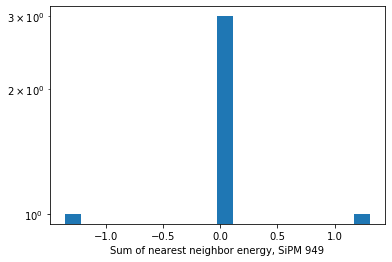

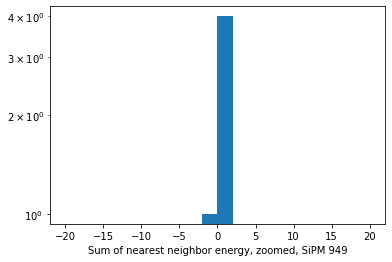

In [125]:
plt.hist(center_nn_sums, bins = 20)
plt.yscale('log')
plt.xlabel('Sum of nearest neighbor energy, SiPM '+str(center_sipm))
plt.show()

plt.hist(center_nn_sums, bins = 20, range=(-20,20))
plt.yscale('log')
plt.xlabel('Sum of nearest neighbor energy, zoomed, SiPM '+str(center_sipm))
plt.show()

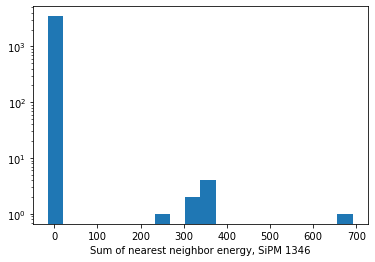

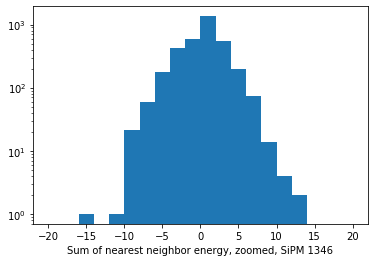

In [126]:
plt.hist(bright_nn_sums, bins = 20)
plt.yscale('log')
plt.xlabel('Sum of nearest neighbor energy, SiPM '+str(bright_sipm))
plt.show()

plt.hist(bright_nn_sums, bins = 20, range=(-20,20))
plt.yscale('log')
plt.xlabel('Sum of nearest neighbor energy, zoomed, SiPM '+str(bright_sipm))
plt.show()

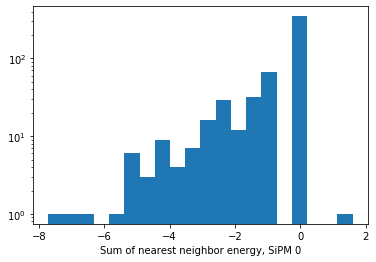

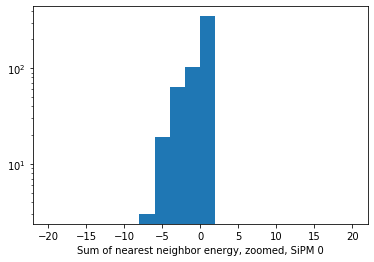

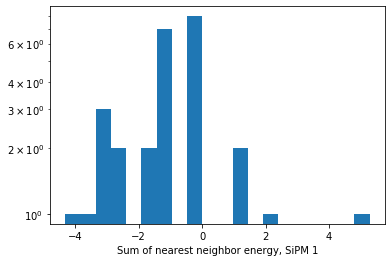

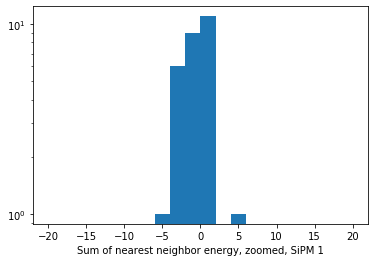

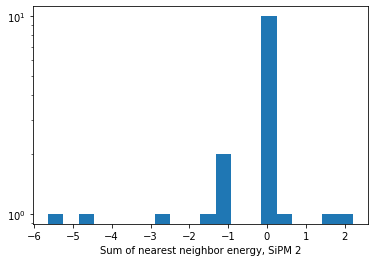

...

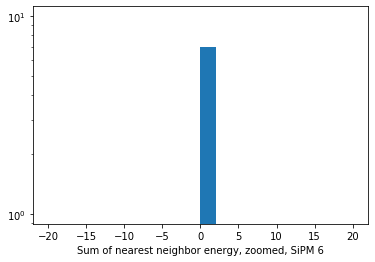

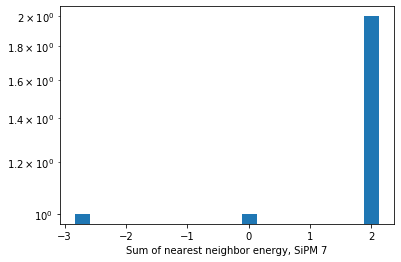

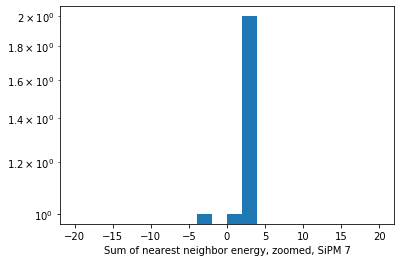

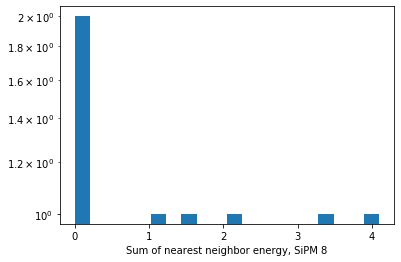

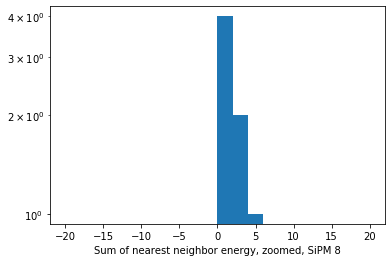

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:5: UserWarning: Data has no positive values, and therefore cannot be log-scaled.


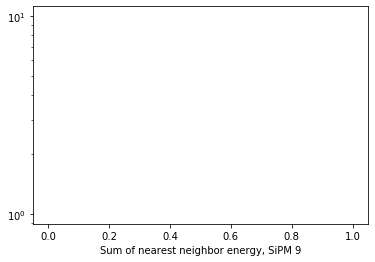

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:10: UserWarning: Data has no positive values, and therefore cannot be log-scaled.


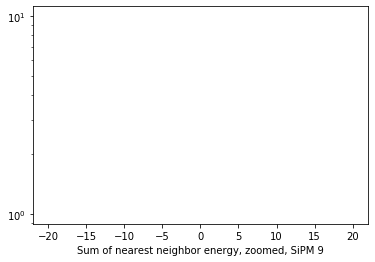

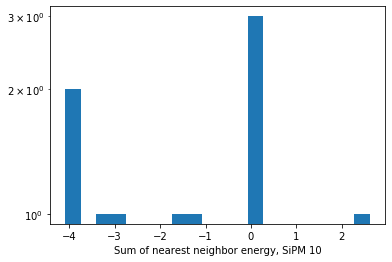

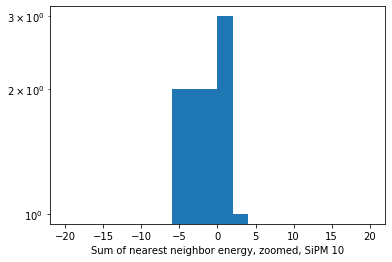

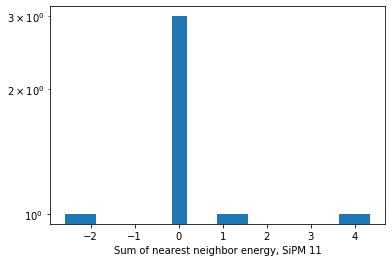

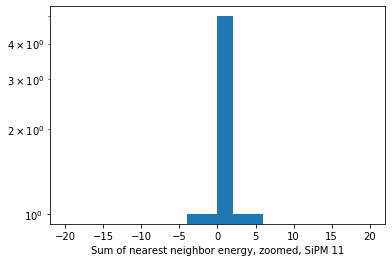

...

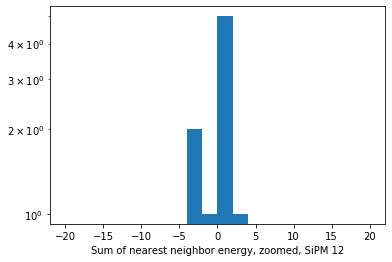

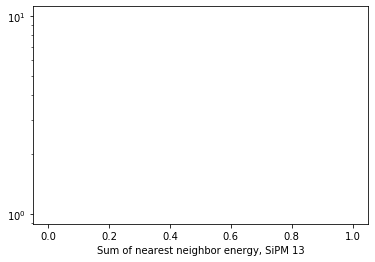

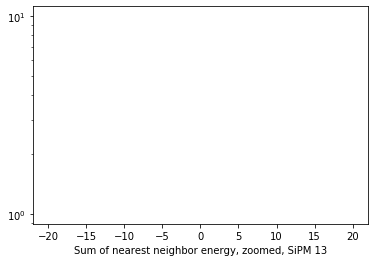

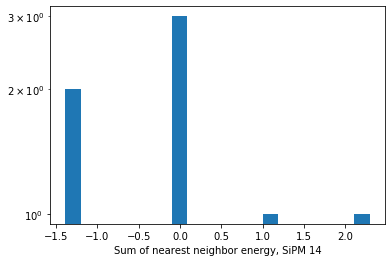

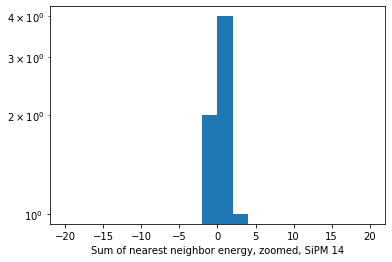

In [127]:
for i in range(min(nsipms,15)):
    sipm_nn_sums = hist_nns(i)
    
    plt.hist(sipm_nn_sums, bins = 20)
    plt.yscale('log')
    plt.xlabel('Sum of nearest neighbor energy, SiPM '+str(i))
    plt.show()
    
    plt.hist(sipm_nn_sums, bins = 20, range=(-20,20))
    plt.yscale('log')
    plt.xlabel('Sum of nearest neighbor energy, zoomed, SiPM '+str(i))
    plt.show()

## Create your own correction map

In [128]:
print('Current time =', round((time() - t0)/60, 1), 'm')

Current time = 60.9 m


/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in true_divide


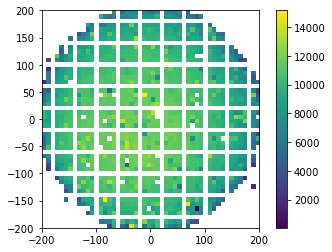

In [129]:
# Create own correction map

nbins = 50
clim = 200
dbin = 2 * clim / nbins
coord_range = np.linspace(-clim, clim, nbins + 1)
coord_bins = np.vstack((coord_range[:-1], coord_range[1:])).T

energy_sum = np.zeros((len(coord_bins),len(coord_bins)))
events_sum = np.zeros((len(coord_bins),len(coord_bins)))
for ix in range(len(coord_bins)):
    for iy in range(len(coord_bins)):
        xbin = coord_bins[ix]
        ybin = coord_bins[iy]
        xmask = (events_X_sipm_subtracted > xbin[0]) & (events_X_sipm_subtracted <= xbin[1])
        ymask = (events_Y_sipm_subtracted > ybin[0]) & (events_Y_sipm_subtracted <= ybin[1])
        xymask = xmask & ymask
        events_sum[ix][iy] = np.sum(xymask & selfmask)
        energy_sum[ix][iy] = np.sum(events_energy_subtracted[xymask & selfmask])
        
energy_xy = energy_sum / events_sum
energy_xy_bounds = ((-200, 200), (-200, 200))

plt.imshow(energy_xy, extent=[-200, 200, -200, 200], origin = 'lower')
plt.colorbar()
plt.show()

## Apply various correction maps and check the output resolution

In [130]:
import itertools as it
zlims = [100, 200, 300, 400, 510]
rlims = [50, 100, 150, 180]
nomask = np.ones(len(events_X_sipm_subtracted), dtype='bool')

def get_bin_from_xy(x, y, emap, bounds):
    lowerx, lowery = bounds[0][0], bounds[1][0]
    upperx, uppery = bounds[0][1], bounds[1][1]
    nbinsx = len(emap)
    nbinsy = len(emap[0])
    dbinx = (bounds[0][1] - bounds[0][0]) / nbinsx
    dbiny = (bounds[1][1] - bounds[1][0]) / nbinsy
    ix = min(floor((x - lowerx) / dbinx), nbinsx-1)
    iy = min(floor((y - lowery) / dbiny), nbinsy-1)
    return ix, iy

def correct_energies(emap, bounds, umask = nomask, ltmap = None, show = True, xvals = events_X_sipm_subtracted, yvals = events_Y_sipm_subtracted, energies = events_energy_subtracted, vocal = False):
    if vocal:
        print('Correcting energies...')
    ecorrs = []
    xymask = (xvals > bounds[0][0]) & (xvals < bounds[0][1]) & (yvals > bounds[1][0]) & (yvals < bounds[1][1])
    tcorstart = time()
    masked_xvals, masked_yvals = xvals[umask & xymask], yvals[umask & xymask]
    masked_energies = energies[umask & xymask]
    ncorevents = len(masked_xvals)
    factor_default = emap[int(len(emap)/2)][int(len(emap)/2)]
    for e in range(ncorevents):
        if vocal and e % 10000 == 0:
            print(e, '/', len(xvals[umask & xymask]))
            if e > 0:
                print('Est remaining =', round((ncorevents - e)*(time() - tcorstart) / e, 1))
        x, y = masked_xvals[e], masked_yvals[e]
        ix, iy = get_bin_from_xy(x, y, emap, bounds)
        factor = emap[ix][iy]
        if factor == 0 or np.isnan(factor):
            factor = factor_default
        if ltmap is not None:
            ixlt, iylt = get_bin_from_xy(x, y, ltmap, bounds)
            lt = ltmap[ixlt][iylt]
            z = all_Zgauss[umask & xymask][e]
            ltcorr = np.exp(z / lt)
            factor /= ltcorr
        ecorr = masked_energies[e] / factor
        ecorrs.append(ecorr)
    if show:
        plt.hist(ecorrs)
        plt.show()
    return np.array(ecorrs)

def fit_res_vs_zr(energies, emap, bounds, umask = nomask, show = True, xvals = events_X_sipm_subtracted, yvals = events_Y_sipm_subtracted, zvals = all_Zgauss):
    res_vs_zr = {}
    xymask = (xvals > bounds[0][0]) & (xvals < bounds[0][1]) & (yvals > bounds[1][0]) & (yvals < bounds[1][1])
    masked_xvals, masked_yvals, masked_zvals = xvals[umask & xymask], yvals[umask & xymask], zvals[umask & xymask]

    for zlim, rlim in it.product(zlims, rlims):
    
        fidmask = ((masked_xvals**2 + masked_yvals**2) < rlim**2) & (masked_zvals < zlim)
        h = plt.hist(energies[fidmask], range=(0.85, 1.15), bins = 30)

        xdata = (h[1][:-1] + h[1][1:]) / 2
        ydata = h[0]

        (A0, m0, s0) = (np.max(ydata), 1, np.std(energies[fidmask]))
        print('Attempting to fit a Gaussian with guess (A0, m0, s0) =', (A0, m0, s0))
        popt, pcov = curve_fit(gauss, xdata, ydata, p0 = (A0, m0, s0))
        fitgauss = gauss(xdata, *popt)

        FWHM = 2.355 * popt[2]
        mean = popt[1]
        resolution = 100 * FWHM / mean

        res_vs_zr[zlim*1000+rlim] = resolution

        if show:
            plt.title('Z < '+str(zlim)+'; R < '+str(rlim)+'. Resolution = '+str(round(resolution, 1))+'%')
            plt.plot(xdata, fitgauss)
            plt.show()
    
    return res_vs_zr

def plot_res_vs_zr(res_vs_zr):
    for rlim in rlims:
        res_vs_z = [ res_vs_zr[1000*zlim + rlim] for zlim in zlims ]
        plt.plot(zlims, res_vs_z, 'o', label = 'rlim = '+str(rlim)+' mm')
    plt.legend()
    plt.xlabel('Z upper limit (mm)')
    plt.ylabel('Resolution (%)')
    plt.show()
    print('Best resolution = ', round(min(res_vs_zr.values()), 1), '%')
    
import h5py

def load_maps_from_file(filename, show = True):
    f = h5py.File(filename, 'r')
    e0map = np.array(f['e0']['block0_values'])
    ltmap = np.array(f['lt']['block0_values'])
    # f['mapinfo']['index'][i] tells you what is stored is stored in f['mapinfo']['values'][i]
    bounds = ((f['mapinfo']['values'][0], f['mapinfo']['values'][1]), (f['mapinfo']['values'][2], f['mapinfo']['values'][3]))
    f.close()

    if show:
        plt.imshow(e0map, extent=[bounds[0][0], bounds[0][1], bounds[1][0], bounds[1][1]], origin = 'lower')
        plt.colorbar()
        plt.title('E0')
        plt.show()

        plt.imshow(ltmap, extent=[bounds[0][0], bounds[0][1], bounds[1][0], bounds[1][1]], origin = 'lower')
        plt.colorbar()
        plt.title('LT')
        plt.clim(5000, 10000)
        plt.show()
    
    return e0map, ltmap, bounds

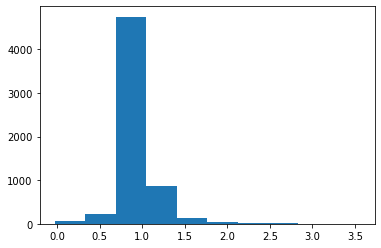

Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.12546982375304863)


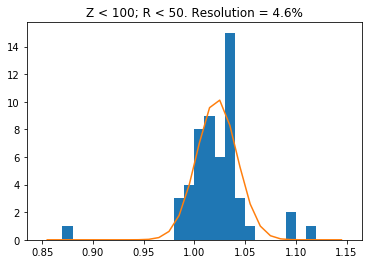

Attempting to fit a Gaussian with guess (A0, m0, s0) = (40.0, 1, 0.11381743255482334)


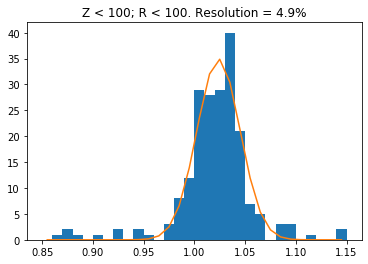

Attempting to fit a Gaussian with guess (A0, m0, s0) = (77.0, 1, 0.13485124128682677)


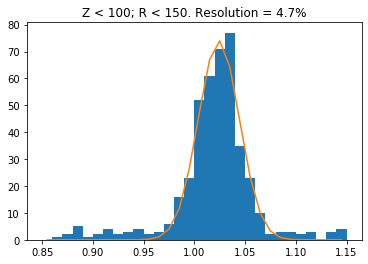

Attempting to fit a Gaussian with guess (A0, m0, s0) = (102.0, 1, 0.13345721866178267)


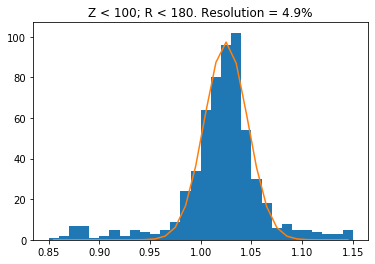

Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.1342873198005426)


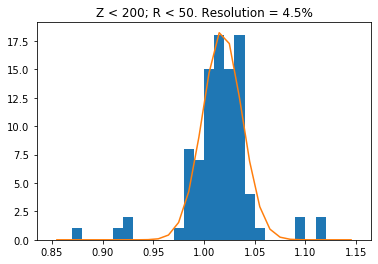

Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.10394191609402441)


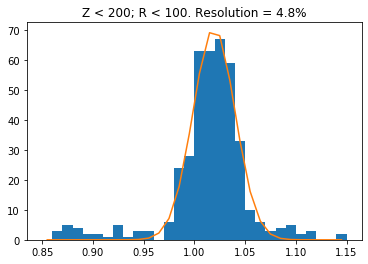

Attempting to fit a Gaussian with guess (A0, m0, s0) = (156.0, 1, 0.12438767444302669)


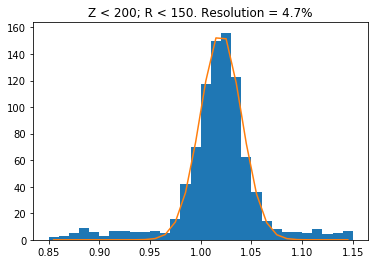

Attempting to fit a Gaussian with guess (A0, m0, s0) = (197.0, 1, 0.13237691850026825)


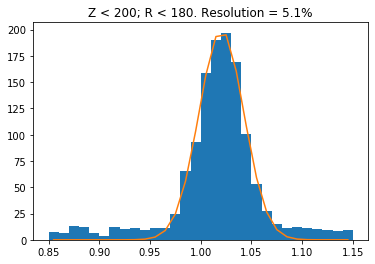

Attempting to fit a Gaussian with guess (A0, m0, s0) = (27.0, 1, 0.12222337781698885)


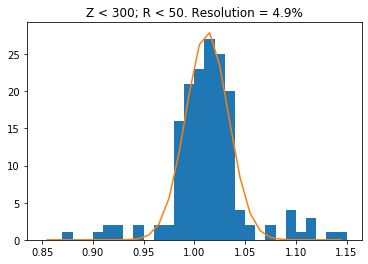

Attempting to fit a Gaussian with guess (A0, m0, s0) = (103.0, 1, 0.10539003089224443)


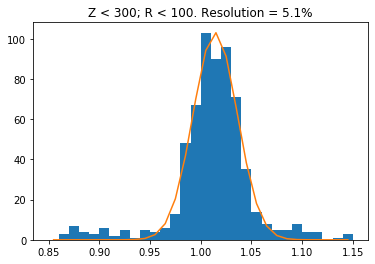

Attempting to fit a Gaussian with guess (A0, m0, s0) = (222.0, 1, 0.1198509213670923)


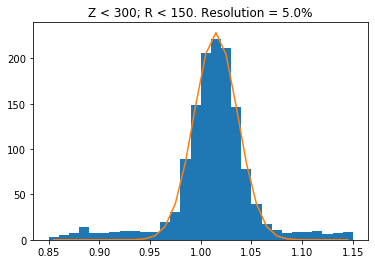

Attempting to fit a Gaussian with guess (A0, m0, s0) = (286.0, 1, 0.13019935574174824)


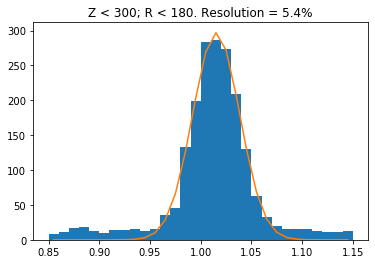

Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.1103678472317277)


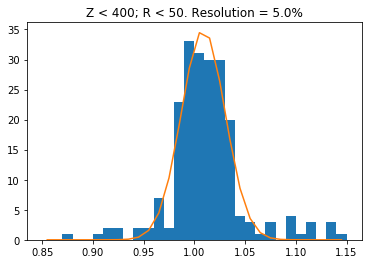

Attempting to fit a Gaussian with guess (A0, m0, s0) = (142.0, 1, 0.10277717883760958)


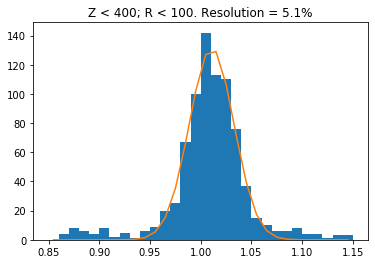

Attempting to fit a Gaussian with guess (A0, m0, s0) = (294.0, 1, 0.11752191189541403)


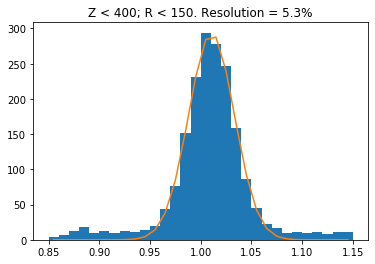

Attempting to fit a Gaussian with guess (A0, m0, s0) = (394.0, 1, 0.12814779925332792)


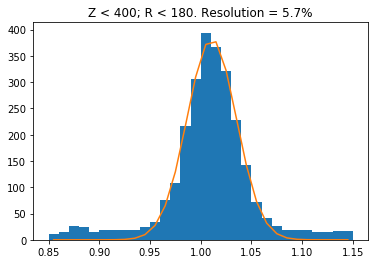

Attempting to fit a Gaussian with guess (A0, m0, s0) = (47.0, 1, 0.10635395339684474)


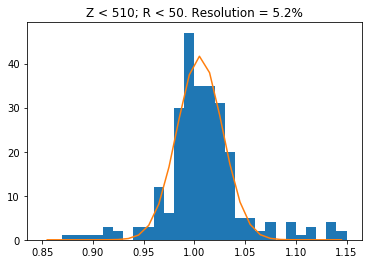

Attempting to fit a Gaussian with guess (A0, m0, s0) = (166.0, 1, 0.10531957028958448)


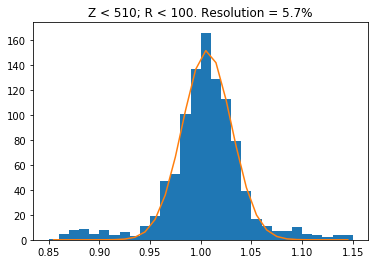

Attempting to fit a Gaussian with guess (A0, m0, s0) = (367.0, 1, 0.11217971065776466)


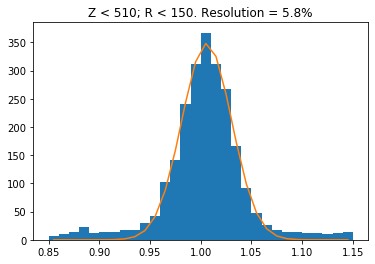

Attempting to fit a Gaussian with guess (A0, m0, s0) = (494.0, 1, 0.1236242509742718)


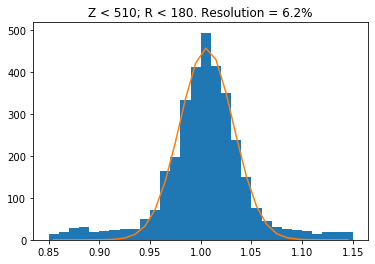

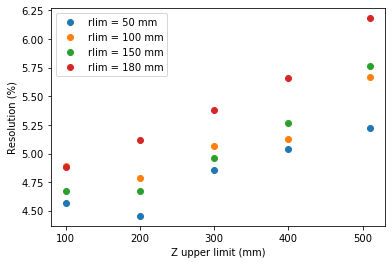

Best resolution =  4.5 %


In [131]:
# Correct energy and examine resolution using self generated correction map
scaled_energy = correct_energies(energy_xy, energy_xy_bounds, umask = selfmask)
self_res_vs_zr = fit_res_vs_zr(scaled_energy, energy_xy, energy_xy_bounds, umask = selfmask)
plot_res_vs_zr(self_res_vs_zr)

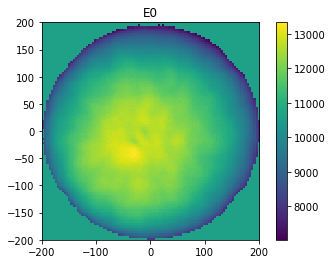

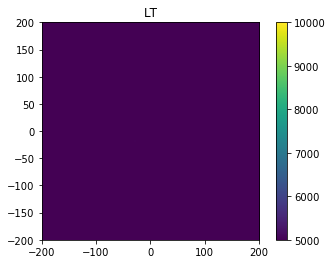

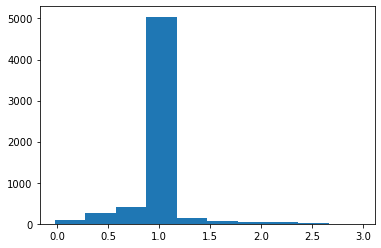

Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11947526403059817)


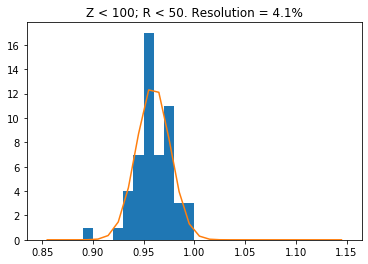

Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.10568351914122623)


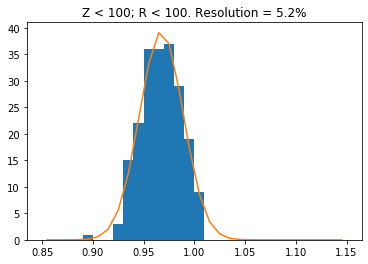

Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.13419746843664665)


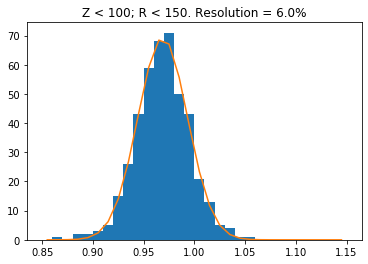

Attempting to fit a Gaussian with guess (A0, m0, s0) = (89.0, 1, 0.1407653331237431)


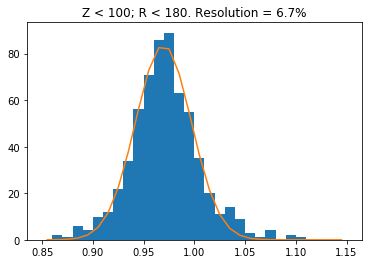

Attempting to fit a Gaussian with guess (A0, m0, s0) = (23.0, 1, 0.13435454785645085)


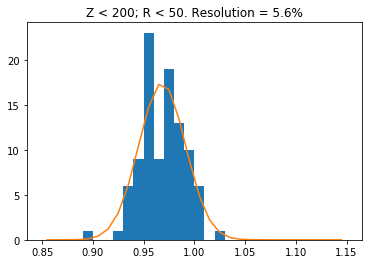

Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.0989490865210833)


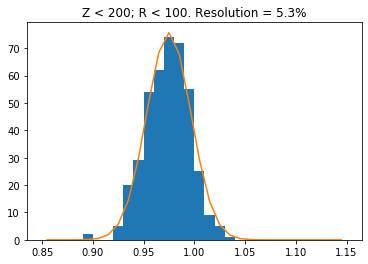

Attempting to fit a Gaussian with guess (A0, m0, s0) = (144.0, 1, 0.1257527110521742)


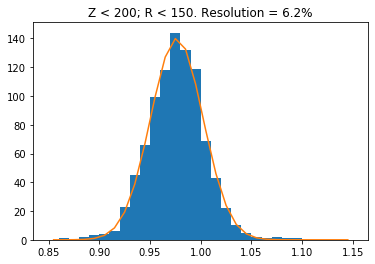

Attempting to fit a Gaussian with guess (A0, m0, s0) = (173.0, 1, 0.14524439469917325)


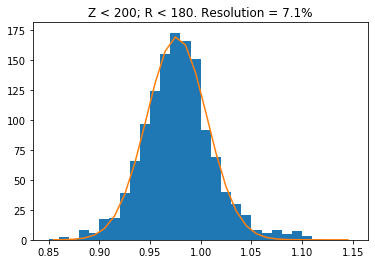

Attempting to fit a Gaussian with guess (A0, m0, s0) = (29.0, 1, 0.12884182583164006)


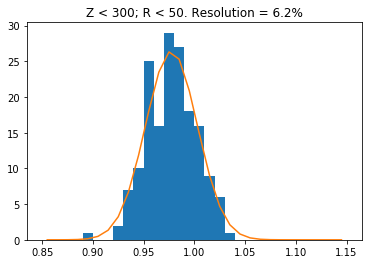

Attempting to fit a Gaussian with guess (A0, m0, s0) = (108.0, 1, 0.10891769701429468)


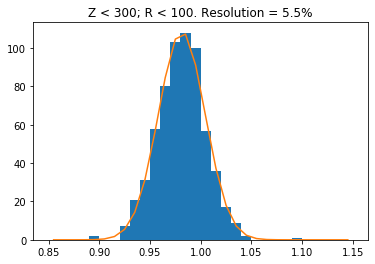

Attempting to fit a Gaussian with guess (A0, m0, s0) = (213.0, 1, 0.12606652371059301)


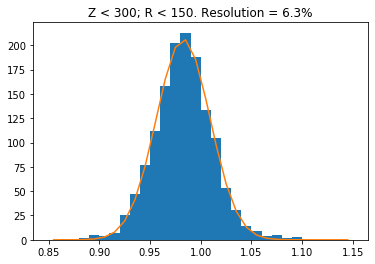

Attempting to fit a Gaussian with guess (A0, m0, s0) = (257.0, 1, 0.14855566755458666)


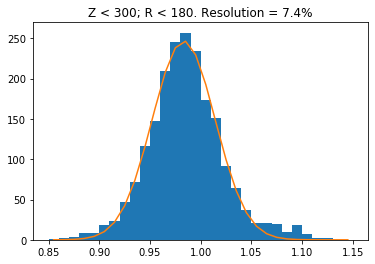

Attempting to fit a Gaussian with guess (A0, m0, s0) = (35.0, 1, 0.11598749388743407)


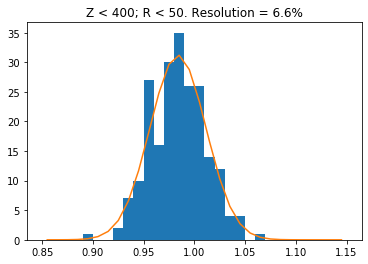

Attempting to fit a Gaussian with guess (A0, m0, s0) = (128.0, 1, 0.10808431352731342)


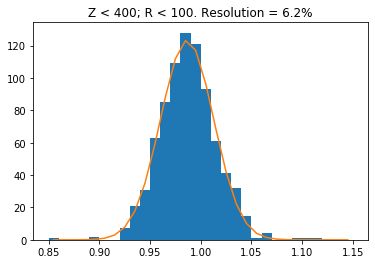

Attempting to fit a Gaussian with guess (A0, m0, s0) = (254.0, 1, 0.12811851246707331)


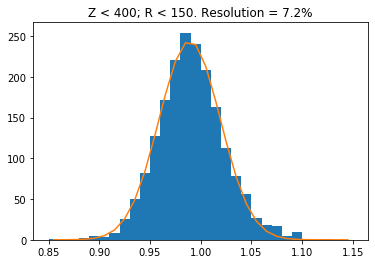

Attempting to fit a Gaussian with guess (A0, m0, s0) = (308.0, 1, 0.14929952446047318)


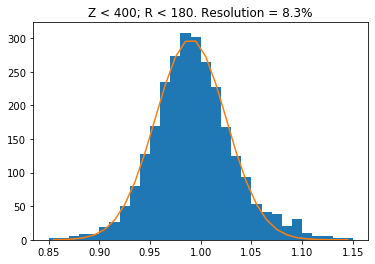

Attempting to fit a Gaussian with guess (A0, m0, s0) = (38.0, 1, 0.12194487453361486)


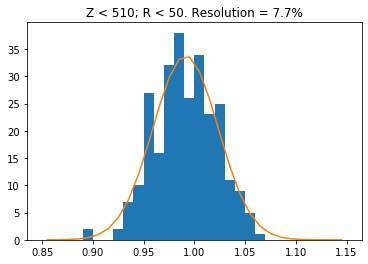

Attempting to fit a Gaussian with guess (A0, m0, s0) = (137.0, 1, 0.11668965818729966)


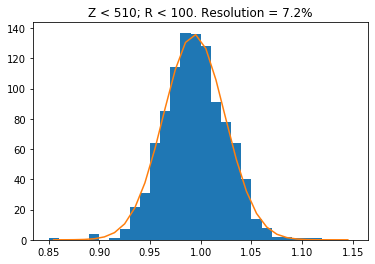

Attempting to fit a Gaussian with guess (A0, m0, s0) = (283.0, 1, 0.12450118170602952)


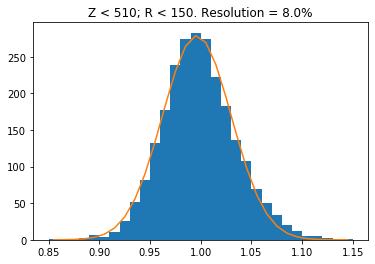

Attempting to fit a Gaussian with guess (A0, m0, s0) = (360.0, 1, 0.14699486879558268)


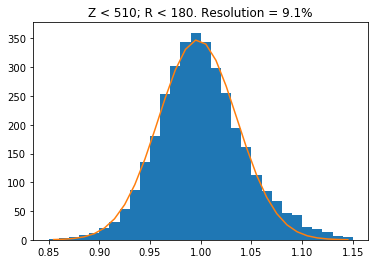

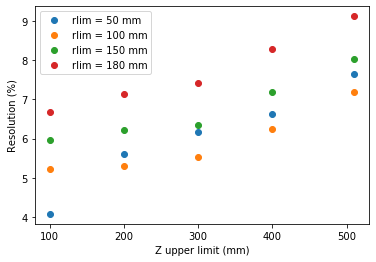

Best resolution =  4.1 %


In [132]:
# Bootstrap with file used in Kr correction as bootstrap
file_bootstrap   = '/Users/jmhaefner/Documents/NEXT_code/IC_current/IC_test/IC/invisible_cities/database/test_data/kr_emap_xy_100_100_r_6573_time.h5'

e0_boot, lt_boot, bounds_boot = load_maps_from_file(file_bootstrap)
boot_scaled_energy = correct_energies(e0_boot, bounds_boot, umask = selfmask, ltmap = lt_boot)
boot_res_vs_zr = fit_res_vs_zr(boot_scaled_energy, e0_boot, bounds_boot, umask = selfmask)
plot_res_vs_zr(boot_res_vs_zr)

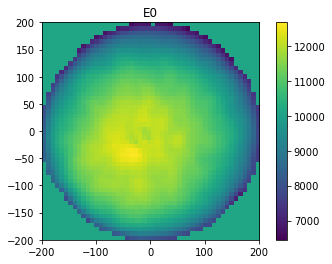

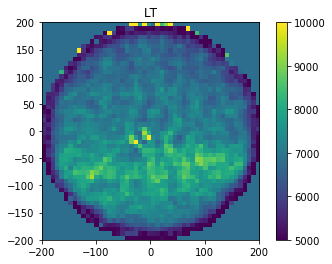

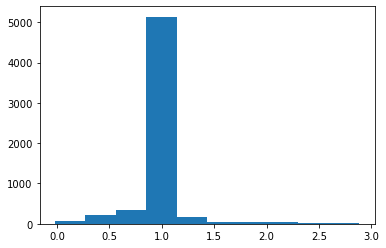

Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12427430737968649)


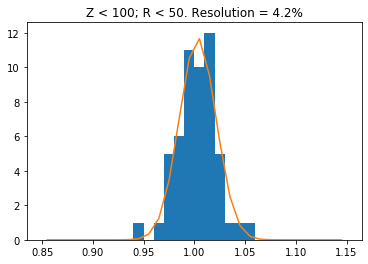

Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.10954402011872355)


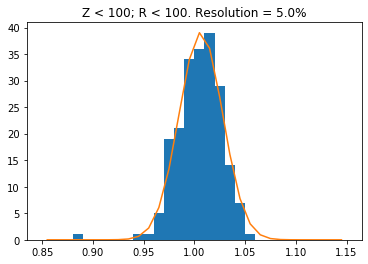

Attempting to fit a Gaussian with guess (A0, m0, s0) = (70.0, 1, 0.1390133488792476)


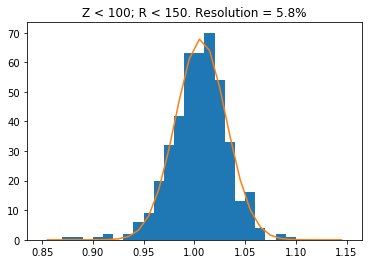

Attempting to fit a Gaussian with guess (A0, m0, s0) = (83.0, 1, 0.1459698964799955)


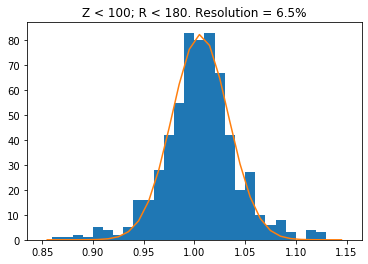

Attempting to fit a Gaussian with guess (A0, m0, s0) = (24.0, 1, 0.13906360295800965)


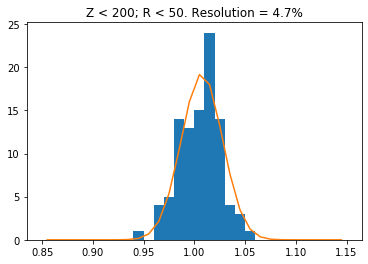

Attempting to fit a Gaussian with guess (A0, m0, s0) = (84.0, 1, 0.10211069056648564)


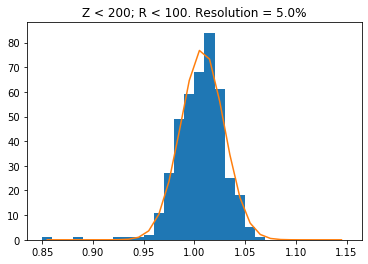

Attempting to fit a Gaussian with guess (A0, m0, s0) = (153.0, 1, 0.12956182680928865)


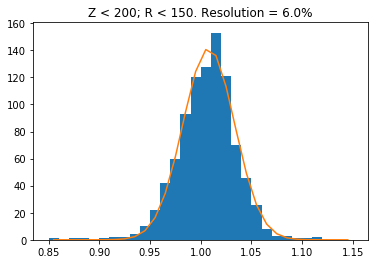

Attempting to fit a Gaussian with guess (A0, m0, s0) = (182.0, 1, 0.14944552096111574)


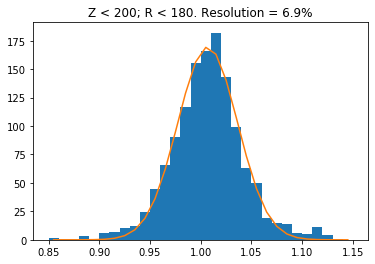

Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.13087303175205459)


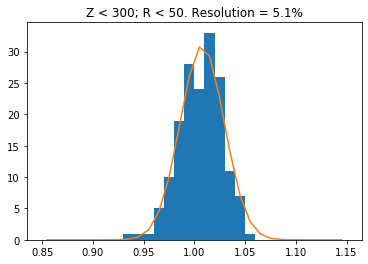

Attempting to fit a Gaussian with guess (A0, m0, s0) = (116.0, 1, 0.11073635151039048)


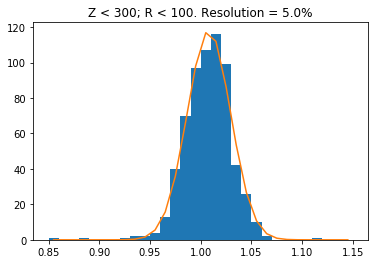

Attempting to fit a Gaussian with guess (A0, m0, s0) = (212.0, 1, 0.12848742106774852)


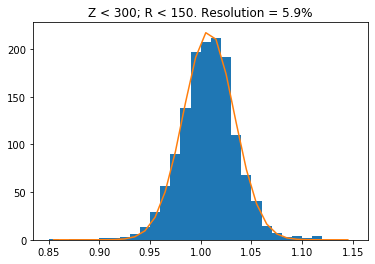

Attempting to fit a Gaussian with guess (A0, m0, s0) = (260.0, 1, 0.1509922611483837)


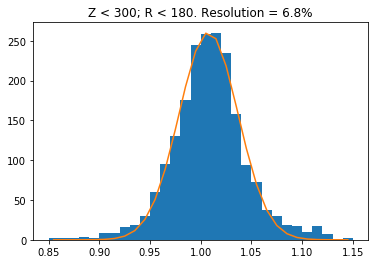

Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.11677842329269568)


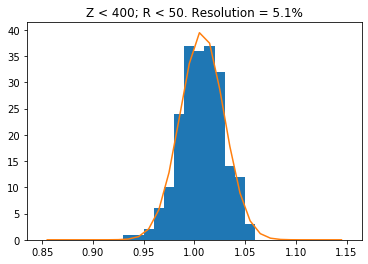

Attempting to fit a Gaussian with guess (A0, m0, s0) = (144.0, 1, 0.10895989866345687)


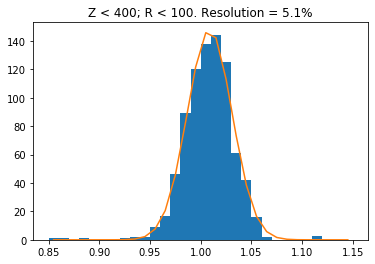

Attempting to fit a Gaussian with guess (A0, m0, s0) = (278.0, 1, 0.12888845524019496)


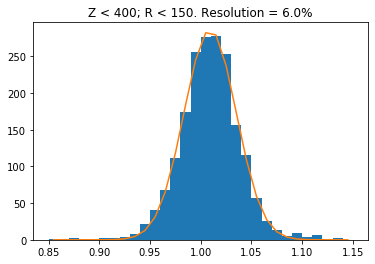

Attempting to fit a Gaussian with guess (A0, m0, s0) = (350.0, 1, 0.15037992175172504)


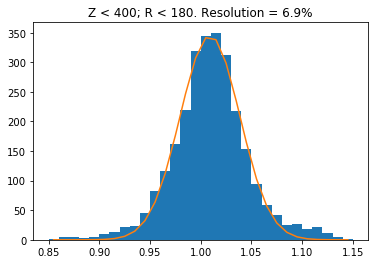

Attempting to fit a Gaussian with guess (A0, m0, s0) = (50.0, 1, 0.11991023766942006)


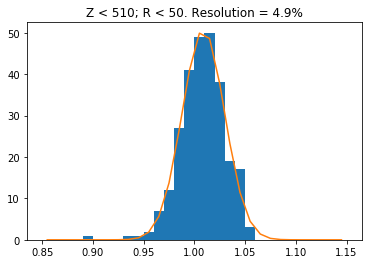

Attempting to fit a Gaussian with guess (A0, m0, s0) = (183.0, 1, 0.11519502518651373)


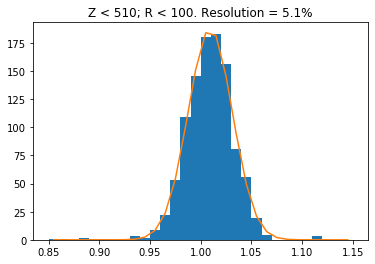

Attempting to fit a Gaussian with guess (A0, m0, s0) = (352.0, 1, 0.12335862932978127)


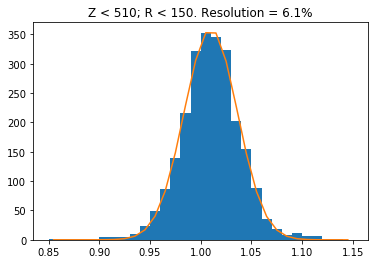

Attempting to fit a Gaussian with guess (A0, m0, s0) = (437.0, 1, 0.1462108188744953)


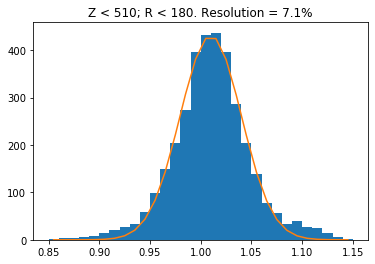

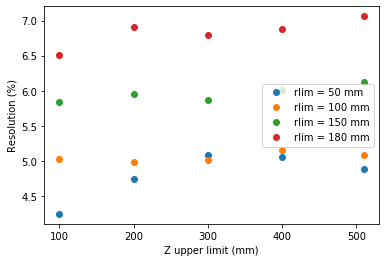

Best resolution =  4.2 %


In [133]:
# Bootstrap with the correction maps from 7472
file_7472   = '/Volumes/NEXT_Data/IC_Data/st190819/maps/kr_emap_xy_50_50_r_7472_st190819.h5'

e0_7472, lt_7472, bounds_7472 = load_maps_from_file(file_7472)
r7472_scaled_energy = correct_energies(e0_7472, bounds_7472, umask = selfmask, ltmap = lt_7472)
r7472_res_vs_zr = fit_res_vs_zr(r7472_scaled_energy, e0_7472, bounds_7472, umask = selfmask)
plot_res_vs_zr(r7472_res_vs_zr)

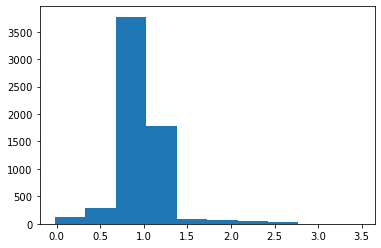

Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12427430737968649)


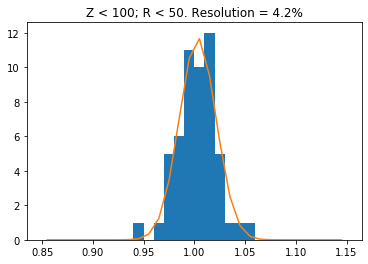

Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.10929627636079348)


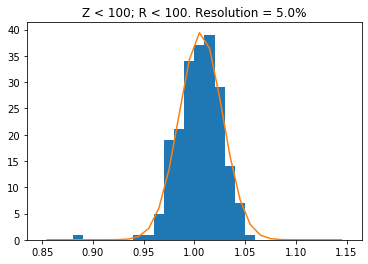

Attempting to fit a Gaussian with guess (A0, m0, s0) = (70.0, 1, 0.1405287955159199)


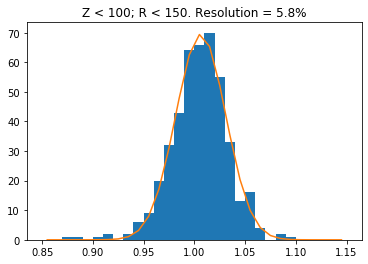

Attempting to fit a Gaussian with guess (A0, m0, s0) = (84.0, 1, 0.14823802005380862)


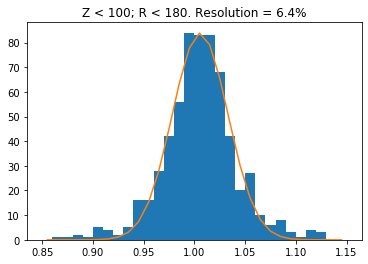

Attempting to fit a Gaussian with guess (A0, m0, s0) = (24.0, 1, 0.14382902932508684)


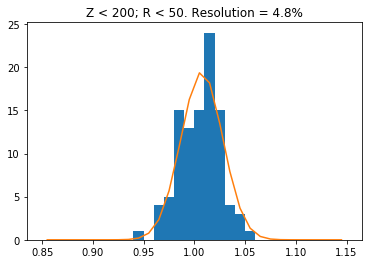

Attempting to fit a Gaussian with guess (A0, m0, s0) = (85.0, 1, 0.10360847471203731)


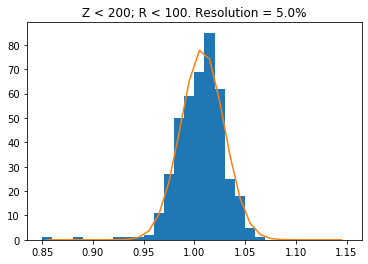

Attempting to fit a Gaussian with guess (A0, m0, s0) = (155.0, 1, 0.13074732789718518)


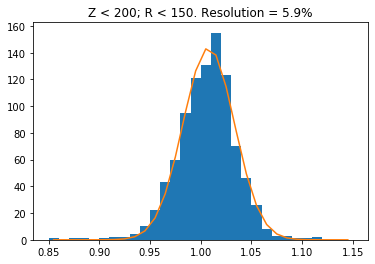

Attempting to fit a Gaussian with guess (A0, m0, s0) = (186.0, 1, 0.15036116530390295)


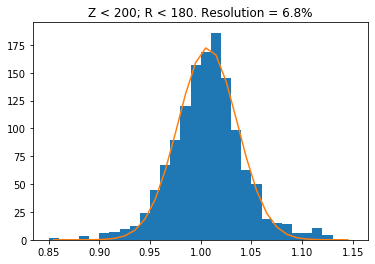

Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.13343058290139634)


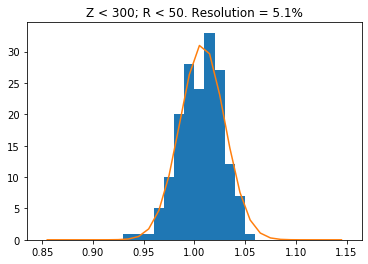

Attempting to fit a Gaussian with guess (A0, m0, s0) = (117.0, 1, 0.11148549704706918)


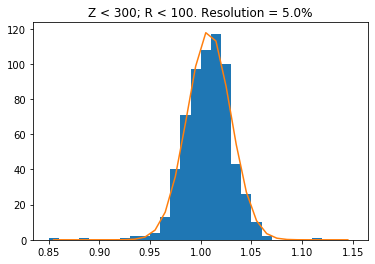

Attempting to fit a Gaussian with guess (A0, m0, s0) = (214.0, 1, 0.12923102046817236)


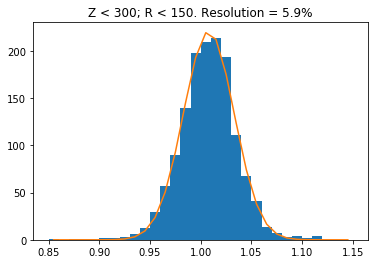

Attempting to fit a Gaussian with guess (A0, m0, s0) = (264.0, 1, 0.1515181757107524)


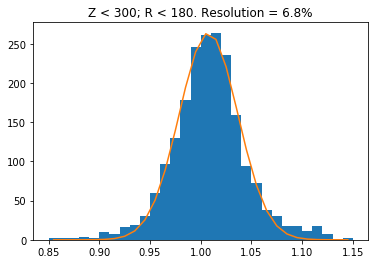

Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.11908645076452594)


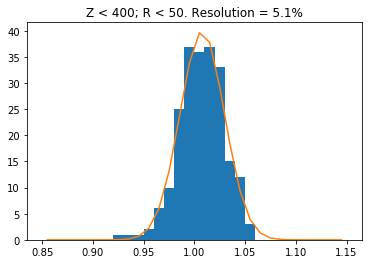

Attempting to fit a Gaussian with guess (A0, m0, s0) = (145.0, 1, 0.10953321231674067)


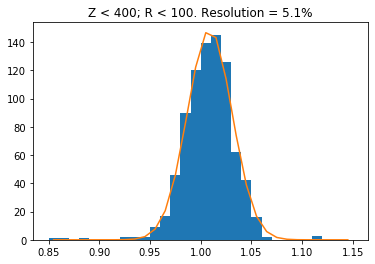

Attempting to fit a Gaussian with guess (A0, m0, s0) = (280.0, 1, 0.12940533278409944)


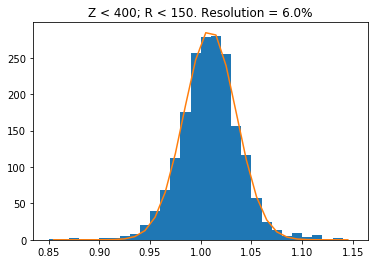

Attempting to fit a Gaussian with guess (A0, m0, s0) = (354.0, 1, 0.15264777910778674)


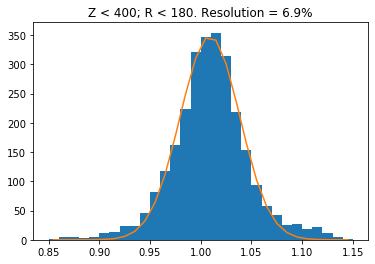

Attempting to fit a Gaussian with guess (A0, m0, s0) = (50.0, 1, 0.12159803365438379)


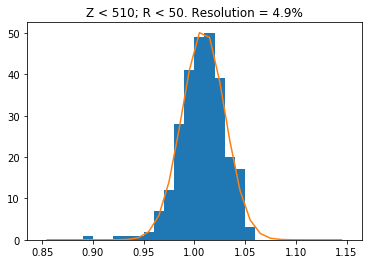

Attempting to fit a Gaussian with guess (A0, m0, s0) = (184.0, 1, 0.11641489186813683)


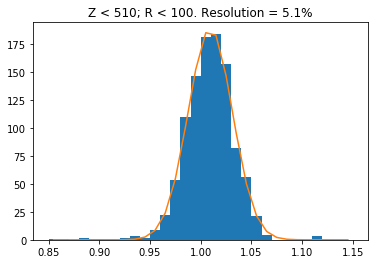

Attempting to fit a Gaussian with guess (A0, m0, s0) = (355.0, 1, 0.12410915427194683)


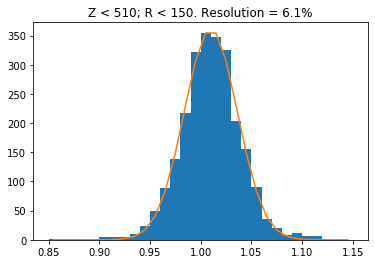

Attempting to fit a Gaussian with guess (A0, m0, s0) = (441.0, 1, 0.1499085173736901)


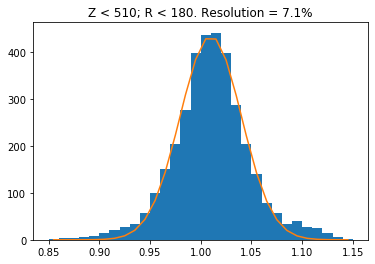

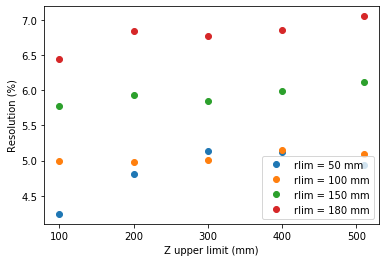

Best resolution =  4.2 %


In [134]:
# Apply maps from 7472, do not use the r2 cut
r7472_scaled_energy_nor2 = correct_energies(e0_7472, bounds_7472, umask = selfmask_nor2, ltmap = lt_7472)
r7472_res_vs_zr_nor2 = fit_res_vs_zr(r7472_scaled_energy_nor2, e0_7472, bounds_7472, umask = selfmask_nor2)
plot_res_vs_zr(r7472_res_vs_zr_nor2)

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:42: RuntimeWarning: divide by zero encountered in double_scalars


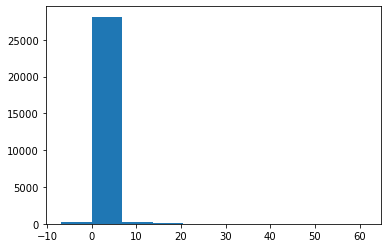

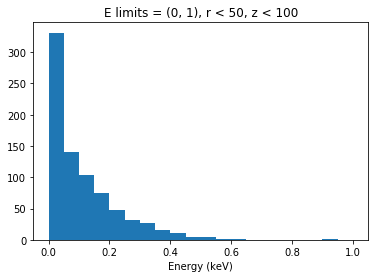

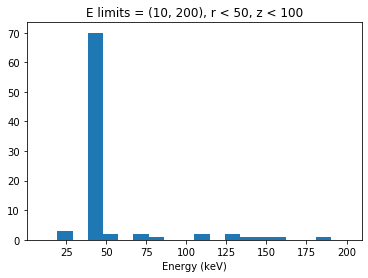

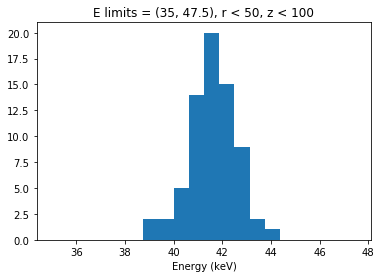

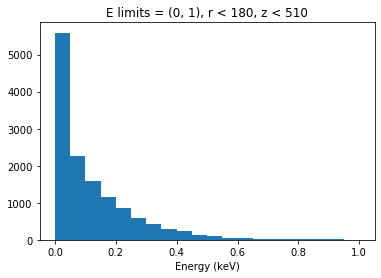

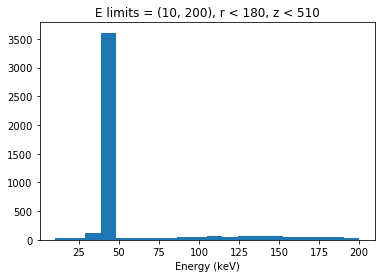

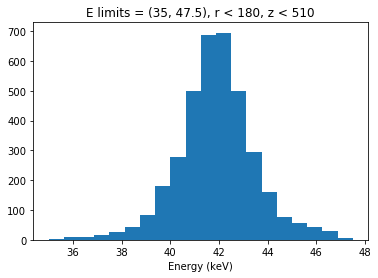

In [135]:
# Apply maps from 7472 to all events, not just selected Kr events, no r2 cut, then look at spectra
scaled_energy_7472_nor2_full = correct_energies(e0_7472, bounds_7472, ltmap = lt_7472)
scaled_energy_7472_nor2_full = 41.5 * scaled_energy_7472_nor2_full
rzlims = [(50, 100), (180, 510)]
zooms = [(0, 1), (10, 200), (35, 47.5)]
xymask = (events_X_sipm_subtracted > bounds_7472[0][0]) & (events_X_sipm_subtracted < bounds_7472[0][1]) & (events_Y_sipm_subtracted > bounds_7472[1][0]) & (events_Y_sipm_subtracted < bounds_7472[1][1])
for rz, zoom in it.product(rzlims, zooms):
    rlim, zlim = rz
    fidmask = ((events_X_sipm_subtracted[xymask]**2 + events_Y_sipm_subtracted[xymask]**2) < rlim**2) & (all_Zgauss[xymask] < zlim)
    plt.hist(scaled_energy_7472_nor2_full[fidmask], range=zoom, bins = 20)
    plt.title('E limits = '+str(zoom)+', r < '+str(rlim)+', z < '+str(zlim))
    plt.xlabel('Energy (keV)')
    plt.show()

In [136]:
print('-BEST RESOLUTIONS-')
print('MIN Self corrected        =', min(self_res_vs_zr.values()))
print('MIN Boot corrected        =', min(boot_res_vs_zr.values()))
print('MIN 7472 corrected        =', min(r7472_res_vs_zr.values()))
print('MIN 7472 corrected, no R2 =', min(r7472_res_vs_zr_nor2.values()))
print('MAX 7472 corrected        =', max(r7472_res_vs_zr.values()))
print('MAX 7472 corrected, no R2 =', max(r7472_res_vs_zr_nor2.values()))

-BEST RESOLUTIONS-
MIN Self corrected        = 4.45479245364232
MIN Boot corrected        = 4.07442595941563
MIN 7472 corrected        = 4.241265960587568
MIN 7472 corrected, no R2 = 4.241265960587568
MAX 7472 corrected        = 7.062505304602147
MAX 7472 corrected, no R2 = 7.053050044980816


## Check resolution after bad SiPM removal

In [137]:
for sipm in badsipms:
    x = DataSiPM.X[sipm]
    y = DataSiPM.Y[sipm]
    r = np.sqrt(x**2 + y**2)
    print('SiPM', sipm, 'is at R =', round(r,1))

SiPM 379 is at R = 85.1
SiPM 778 is at R = 149.8
SiPM 843 is at R = 215.1
SiPM 1041 is at R = 29.2
SiPM 1086 is at R = 99.2
SiPM 1346 is at R = 107.0
SiPM 1352 is at R = 105.1
SiPM 1465 is at R = 157.0
SiPM 1579 is at R = 213.2


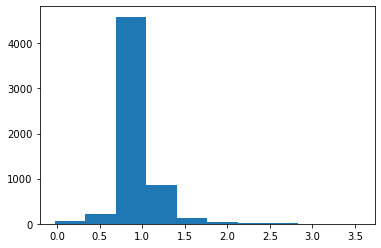

Attempting to fit a Gaussian with guess (A0, m0, s0) = (14.0, 1, 0.12770393099897634)


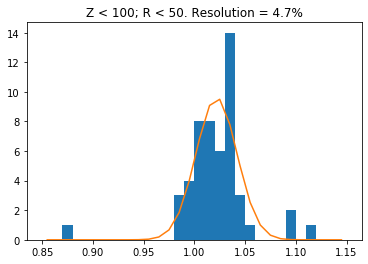

Attempting to fit a Gaussian with guess (A0, m0, s0) = (38.0, 1, 0.1168951470049406)


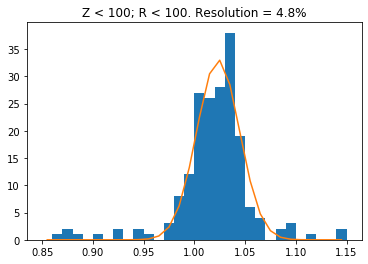

Attempting to fit a Gaussian with guess (A0, m0, s0) = (75.0, 1, 0.13748376114054298)


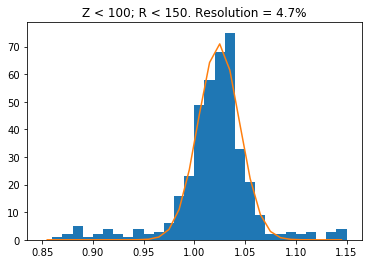

Attempting to fit a Gaussian with guess (A0, m0, s0) = (100.0, 1, 0.1329795180260785)


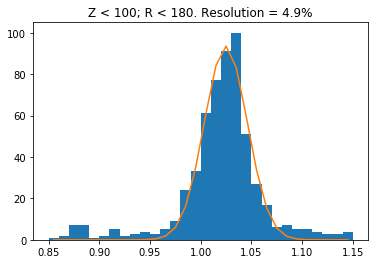

Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.13683326955534883)


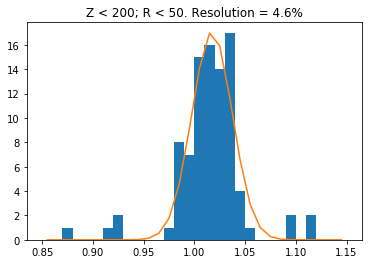

Attempting to fit a Gaussian with guess (A0, m0, s0) = (62.0, 1, 0.10675937009164)


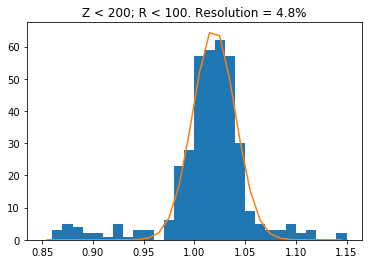

Attempting to fit a Gaussian with guess (A0, m0, s0) = (147.0, 1, 0.12484370975580517)


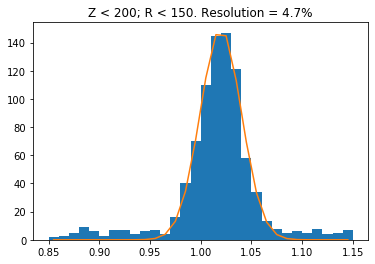

Attempting to fit a Gaussian with guess (A0, m0, s0) = (186.0, 1, 0.13206517185982633)


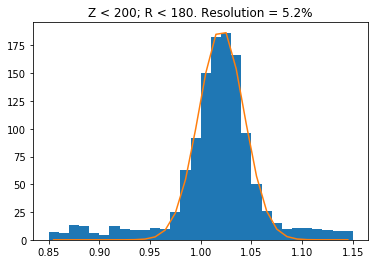

Attempting to fit a Gaussian with guess (A0, m0, s0) = (24.0, 1, 0.12503900929055728)


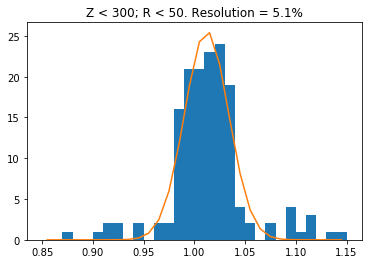

Attempting to fit a Gaussian with guess (A0, m0, s0) = (95.0, 1, 0.10785457399142863)


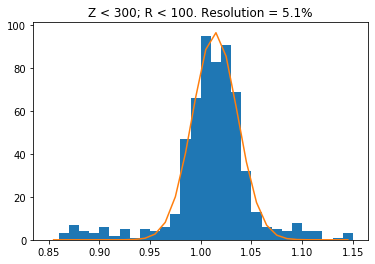

Attempting to fit a Gaussian with guess (A0, m0, s0) = (213.0, 1, 0.1205986879918355)


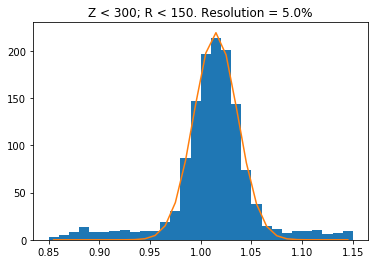

Attempting to fit a Gaussian with guess (A0, m0, s0) = (275.0, 1, 0.12982130275879175)


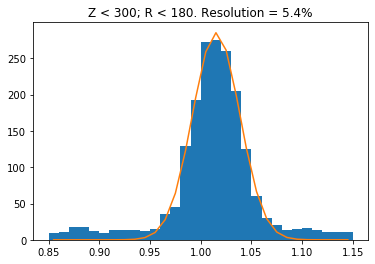

Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11305508822301892)


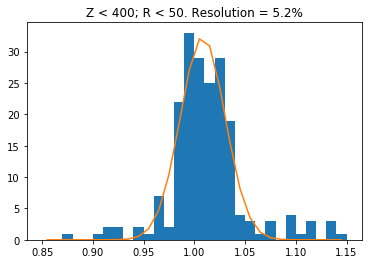

Attempting to fit a Gaussian with guess (A0, m0, s0) = (130.0, 1, 0.10575599173283991)


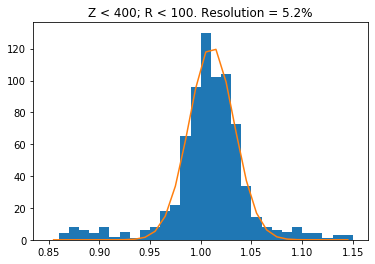

Attempting to fit a Gaussian with guess (A0, m0, s0) = (280.0, 1, 0.11877207711584864)


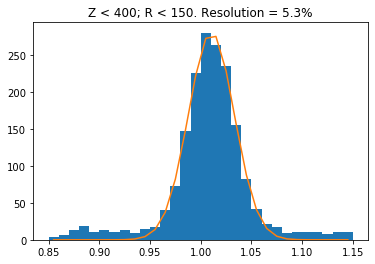

Attempting to fit a Gaussian with guess (A0, m0, s0) = (377.0, 1, 0.12839641732751478)


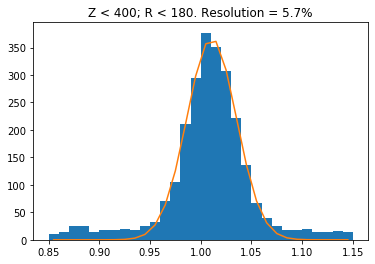

Attempting to fit a Gaussian with guess (A0, m0, s0) = (47.0, 1, 0.10880760741391925)


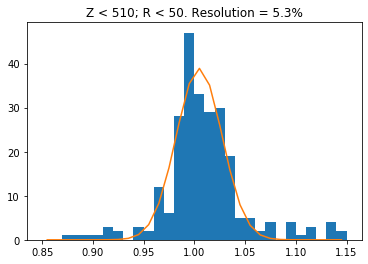

Attempting to fit a Gaussian with guess (A0, m0, s0) = (153.0, 1, 0.10825560495066694)


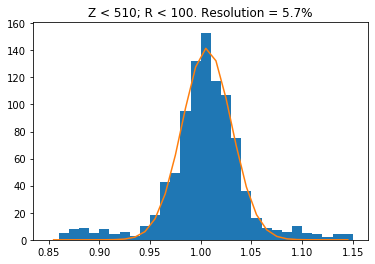

Attempting to fit a Gaussian with guess (A0, m0, s0) = (351.0, 1, 0.11324462267208404)


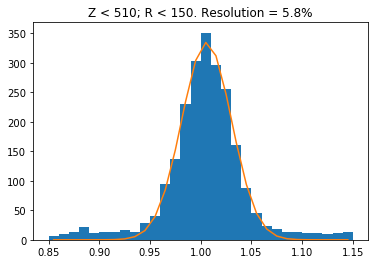

Attempting to fit a Gaussian with guess (A0, m0, s0) = (475.0, 1, 0.12396619989346977)


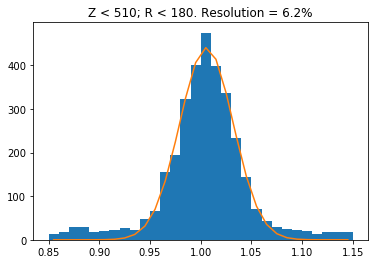

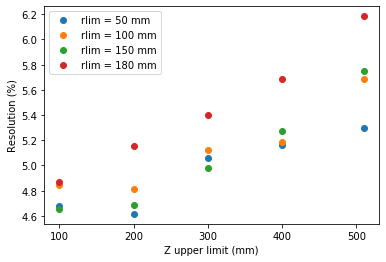

Best resolution =  4.6 %


In [138]:
# Correct energy and examine resolution using self generated correction map, ignore bad SiPM events
scaled_energy_nobadsipm = correct_energies(energy_xy, energy_xy_bounds, umask = selfmask & nobadsipm)
self_res_vs_zr_nobadsipm = fit_res_vs_zr(scaled_energy_nobadsipm, energy_xy, energy_xy_bounds, umask = selfmask & nobadsipm)
plot_res_vs_zr(self_res_vs_zr_nobadsipm)

In [139]:
print('Current time =', round((time() - t0)/60, 1), 'm')

Current time = 62.1 m


## Resolution of Bad Prewindow Ignore

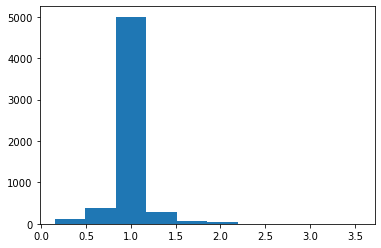

Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.12546982375304863)


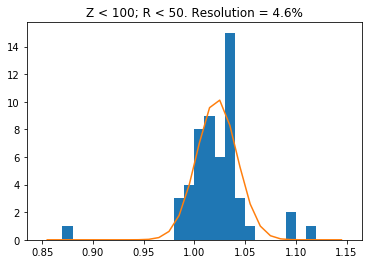

Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.11552744353141389)


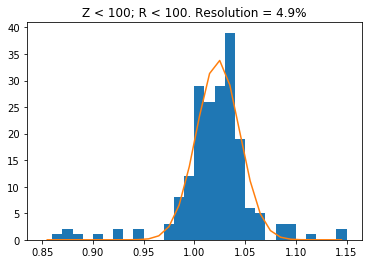

Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.12415119356873777)


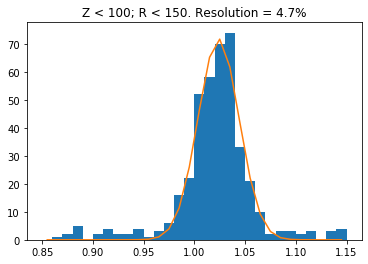

Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.11988139049362223)


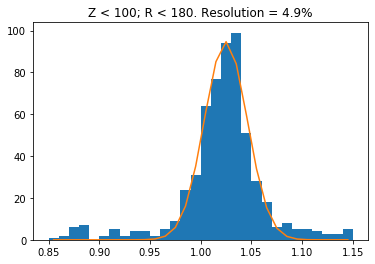

Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11170764155750648)


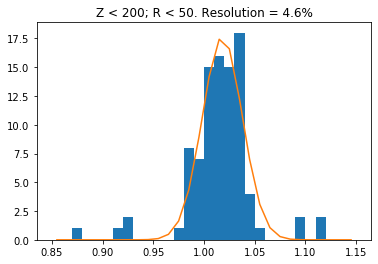

Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09826490011128575)


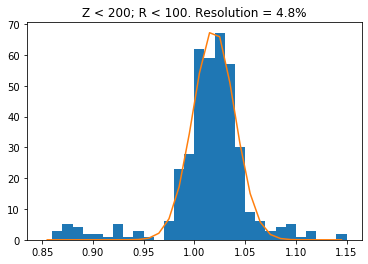

Attempting to fit a Gaussian with guess (A0, m0, s0) = (155.0, 1, 0.11243498398106855)


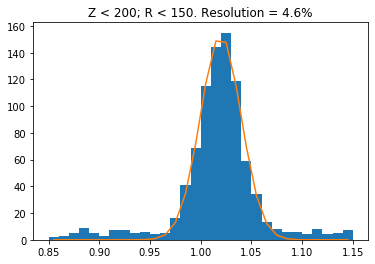

Attempting to fit a Gaussian with guess (A0, m0, s0) = (195.0, 1, 0.11774473781898015)


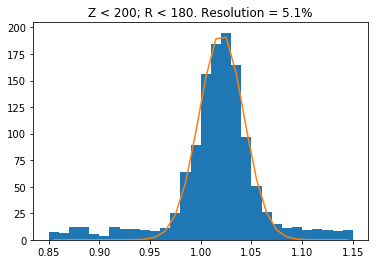

Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.10819434260621114)


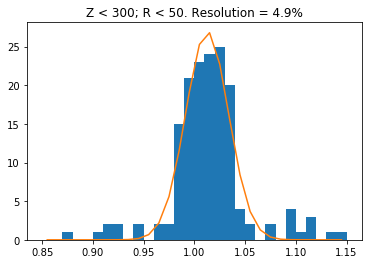

Attempting to fit a Gaussian with guess (A0, m0, s0) = (101.0, 1, 0.1023006713104879)


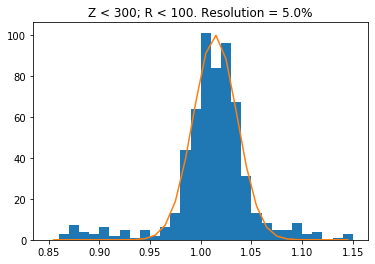

Attempting to fit a Gaussian with guess (A0, m0, s0) = (211.0, 1, 0.109994332470931)


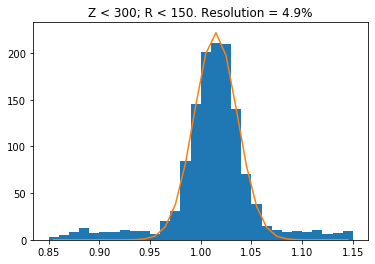

Attempting to fit a Gaussian with guess (A0, m0, s0) = (276.0, 1, 0.11642846835202242)


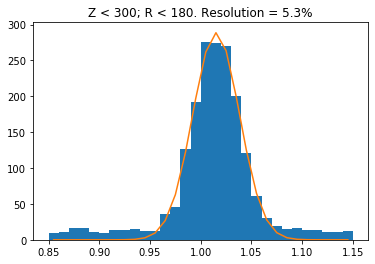

Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.09868798300206799)


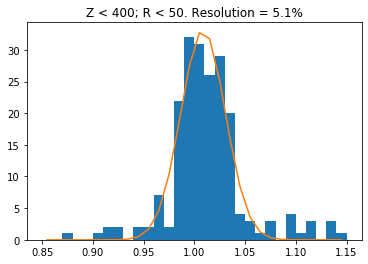

Attempting to fit a Gaussian with guess (A0, m0, s0) = (138.0, 1, 0.09549061515545204)


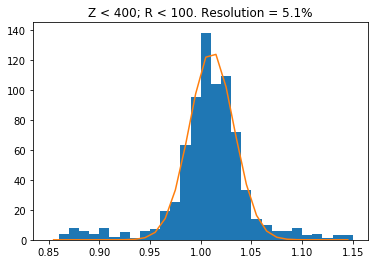

Attempting to fit a Gaussian with guess (A0, m0, s0) = (286.0, 1, 0.10418211190301967)


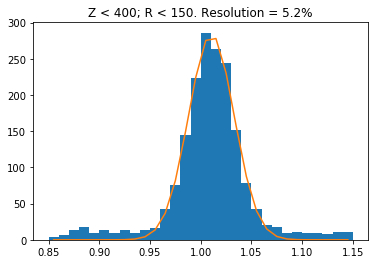

Attempting to fit a Gaussian with guess (A0, m0, s0) = (384.0, 1, 0.11388245692520083)


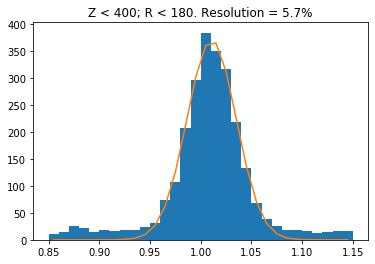

Attempting to fit a Gaussian with guess (A0, m0, s0) = (46.0, 1, 0.09696416236659236)


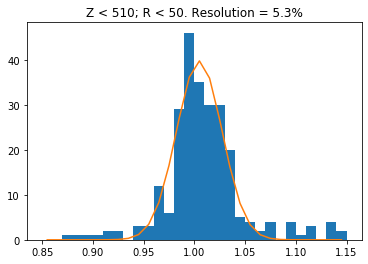

Attempting to fit a Gaussian with guess (A0, m0, s0) = (161.0, 1, 0.09741993251456788)


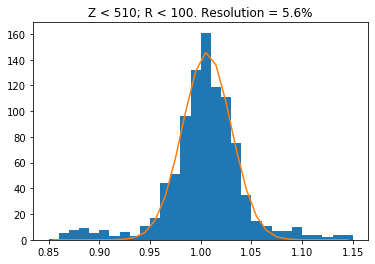

Attempting to fit a Gaussian with guess (A0, m0, s0) = (356.0, 1, 0.10010909171236732)


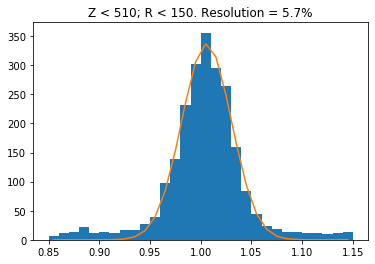

Attempting to fit a Gaussian with guess (A0, m0, s0) = (481.0, 1, 0.11093586604985967)


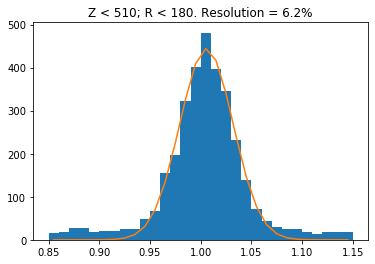

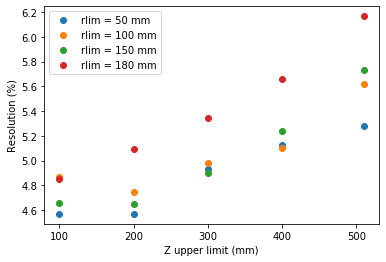

Best resolution =  4.6 %


In [140]:
# Check the resolution when you ignore events with an unusually large prewindow
mymask = selfmask & prewindow_mask
scaled_energy_prewindowcut = correct_energies(energy_xy, energy_xy_bounds, umask = mymask)
self_res_vs_zr_prewindowcut = fit_res_vs_zr(scaled_energy_prewindowcut, energy_xy, energy_xy_bounds, umask = mymask)
plot_res_vs_zr(self_res_vs_zr_prewindowcut)

## Check resolution of recalculated XY position ignoring bad SiPMs

In [141]:
sipm_good = np.array([ i not in badsipms for i in range(nsipms)], dtype=int)
max_sipm_index = [ np.argmax(sum_sipms_subtracted * sipm_good) for sum_sipms_subtracted in events_sum_sipms_subtracted ]

In [142]:
events_X_sipm_subtracted_nobadsipms = np.array([ DataSiPM.X[sipm] for sipm in max_sipm_index ])
events_Y_sipm_subtracted_nobadsipms = np.array([ DataSiPM.Y[sipm] for sipm in max_sipm_index ])

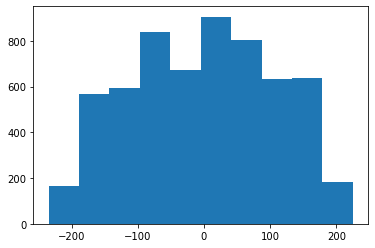

In [143]:
plt.hist(events_X_sipm_subtracted_nobadsipms[selfmask & prewindow_mask])
plt.show()

In [144]:
print('Percent X changed =', round(100*np.sum(events_X_sipm_subtracted != events_X_sipm_subtracted_nobadsipms) / len(events_X_sipm_subtracted_nobadsipms),1))
print('Percent Y changed =', round(100*np.sum(events_Y_sipm_subtracted != events_Y_sipm_subtracted_nobadsipms) / len(events_Y_sipm_subtracted_nobadsipms),1))

Percent X changed = 25.3
Percent Y changed = 25.4


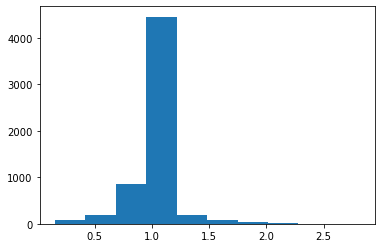

Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.12546982375304863)


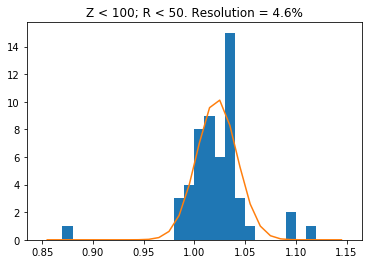

Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.11541005720409399)


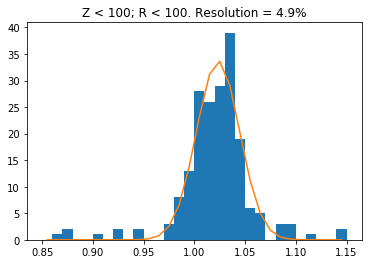

Attempting to fit a Gaussian with guess (A0, m0, s0) = (75.0, 1, 0.12398860653150778)


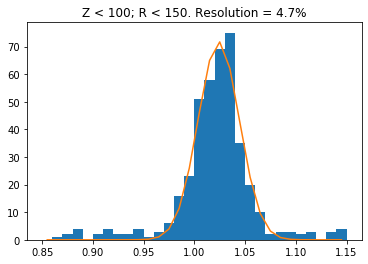

Attempting to fit a Gaussian with guess (A0, m0, s0) = (100.0, 1, 0.11976020865859945)


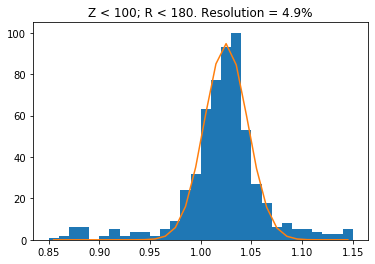

Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.11086809452541573)


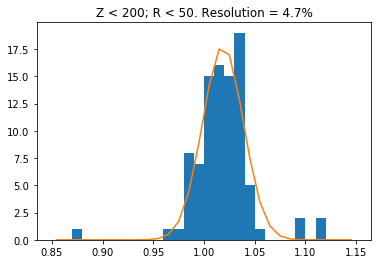

Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09789287550194323)


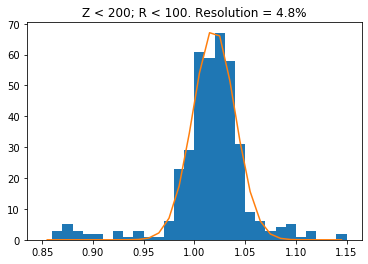

Attempting to fit a Gaussian with guess (A0, m0, s0) = (154.0, 1, 0.11224353746450018)


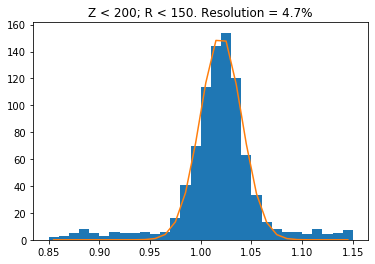

Attempting to fit a Gaussian with guess (A0, m0, s0) = (194.0, 1, 0.11753756473509834)


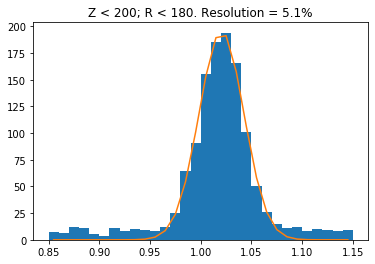

Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.10754298524650867)


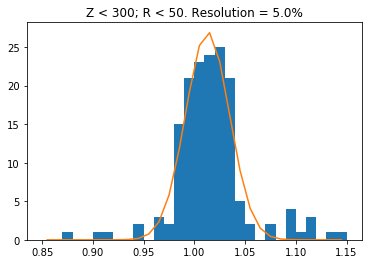

Attempting to fit a Gaussian with guess (A0, m0, s0) = (100.0, 1, 0.10362062267431174)


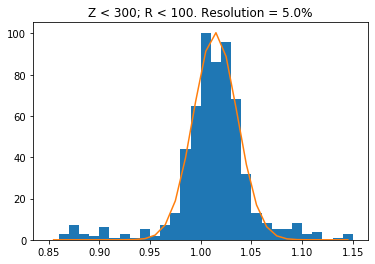

Attempting to fit a Gaussian with guess (A0, m0, s0) = (213.0, 1, 0.11095760565264749)


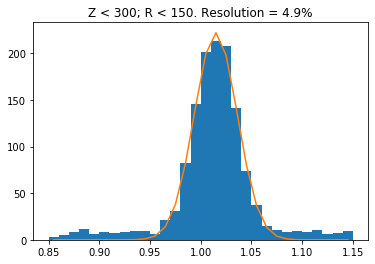

Attempting to fit a Gaussian with guess (A0, m0, s0) = (278.0, 1, 0.11694466770146007)


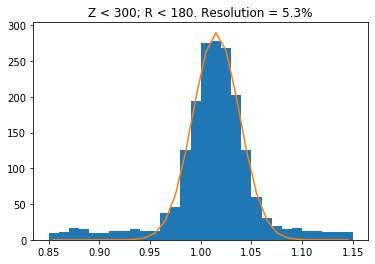

Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.09816746733182584)


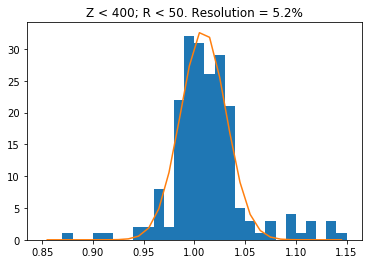

Attempting to fit a Gaussian with guess (A0, m0, s0) = (137.0, 1, 0.09648867596073095)


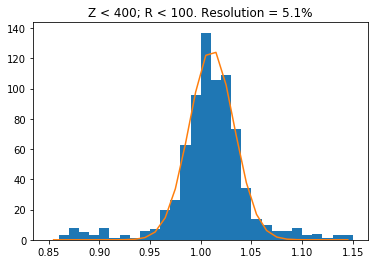

Attempting to fit a Gaussian with guess (A0, m0, s0) = (286.0, 1, 0.10489324649403584)


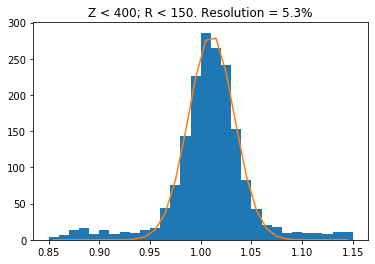

Attempting to fit a Gaussian with guess (A0, m0, s0) = (384.0, 1, 0.1142145053325385)


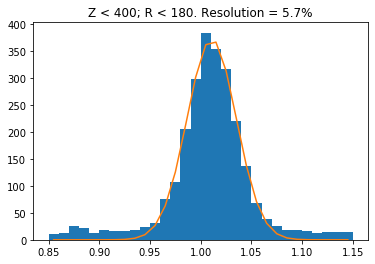

Attempting to fit a Gaussian with guess (A0, m0, s0) = (47.0, 1, 0.09727464134924003)


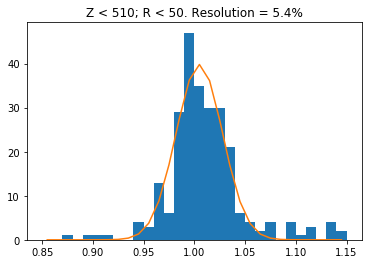

Attempting to fit a Gaussian with guess (A0, m0, s0) = (160.0, 1, 0.09842409774243276)


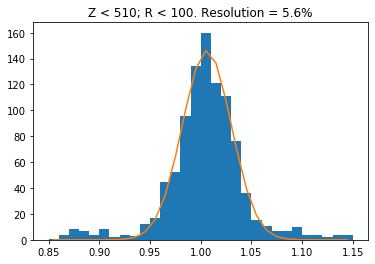

Attempting to fit a Gaussian with guess (A0, m0, s0) = (356.0, 1, 0.10078299536244051)


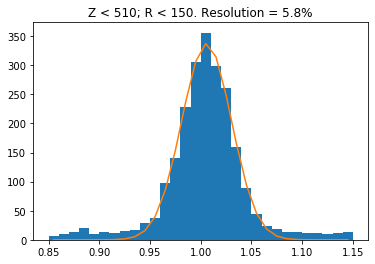

Attempting to fit a Gaussian with guess (A0, m0, s0) = (481.0, 1, 0.11124842739240891)


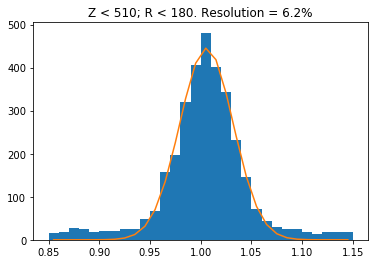

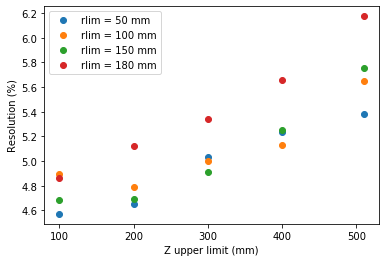

Best resolution =  4.6 %


In [145]:
# Check the resolution when you ignore events with an unusually large prewindow, with no bad sipm xy positions
mymask = selfmask & prewindow_mask
scaled_energy_prewindowcut = correct_energies(energy_xy, energy_xy_bounds, umask = mymask, xvals = events_X_sipm_subtracted_nobadsipms, yvals = events_Y_sipm_subtracted_nobadsipms)
self_res_vs_zr_prewindowcut = fit_res_vs_zr(scaled_energy_prewindowcut, energy_xy, energy_xy_bounds, umask = mymask, xvals = events_X_sipm_subtracted_nobadsipms, yvals = events_Y_sipm_subtracted_nobadsipms)
plot_res_vs_zr(self_res_vs_zr_prewindowcut)

## Center of gravity methods for XY determination

In [204]:
tgrav = time()

# Setup for faster running
events_sum_sipms_subtracted_zeroed = events_sum_sipms_subtracted.clip(min=0)
DataSiPMX = np.array(DataSiPM.X)
DataSiPMY = np.array(DataSiPM.Y)

# Calculate the positions
wsums = np.array([ np.sum(sum_sipms_subtracted) for sum_sipms_subtracted in events_sum_sipms_subtracted_zeroed ])
xsums = np.array([ np.sum(DataSiPMX * sum_sipms_subtracted) for sum_sipms_subtracted in events_sum_sipms_subtracted_zeroed ])
ysums = np.array([ np.sum(DataSiPMY * sum_sipms_subtracted) for sum_sipms_subtracted in events_sum_sipms_subtracted_zeroed ])
global_gravity_x = np.nan_to_num(xsums / wsums)
global_gravity_y = np.nan_to_num(ysums / wsums)

print('Time for cgrav full =', round(time() - tgrav,1))

Time for cgrav full = 3.4


/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:12: RuntimeWarning: invalid value encountered in true_divide
/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in true_divide


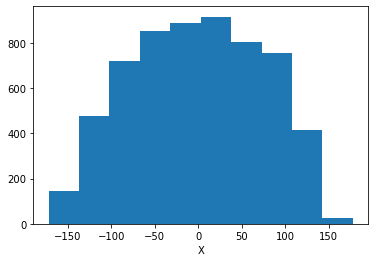

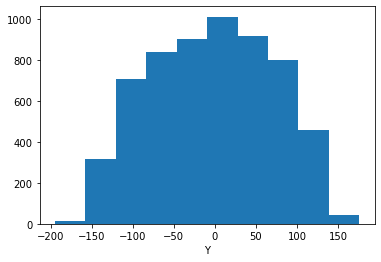

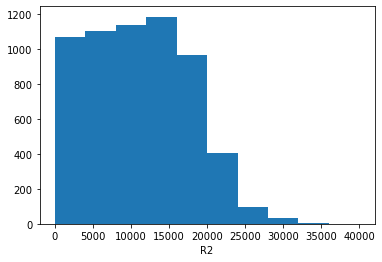

In [268]:
plt.hist(global_gravity_x[selfmask & prewindow_mask])
plt.xlabel('X')
plt.show()

plt.hist(global_gravity_y[selfmask & prewindow_mask])
plt.xlabel('Y')
plt.show()

plt.hist((global_gravity_x**2+global_gravity_y**2)[selfmask & prewindow_mask], range=(0, 200**2))
plt.xlabel('R2')
plt.show()

# Center of gravity, local

In [237]:
tstart = time()
guessps = np.array([[events_X_sipm_subtracted], [events_Y_sipm_subtracted]]).T
sipmps = np.array([[DataSiPMX],[DataSiPMY]]).T
print(time() - tstart)

0.0034089088439941406


In [254]:
tstart = time()
sipmnears = np.zeros((len(guessps), len(sipmps)))
for e in range(len(guessps)):
    for sipm in range(nsipms):
        if events_sum_sipms_subtracted_zeroed[e][sipm] > 0:
            sipmnears[e][sipm] = np.int(np.linalg.norm(sipmps[sipm] - guessps[e]) < rmax)
print(time() - tstart)

rmax = 26

wsums = np.array([])
xsums = np.array([])
ysums = np.array([])

done = 0

tstart = time()

for sum_sipms_subtracted, sipmnear in zip( events_sum_sipms_subtracted_zeroed, sipmnears):
    if done % 10000 == 0:
        remaining =round((len(events_sum_sipms_subtracted_zeroed) - done) * (time() - tstart) / (done + 1), 1)
        dt = round(time() - tstart, 1)
        print(done, '/', len(events_sum_sipms_subtracted_zeroed), '; dt =', dt, '; Remaining:', remaining)
    done += 1

    wsums = np.append(wsums, np.sum(sum_sipms_subtracted * sipmnear))
    xsums = np.append(xsums, np.sum(DataSiPMX * sum_sipms_subtracted * sipmnear))
    ysums = np.append(ysums, np.sum(DataSiPMY * sum_sipms_subtracted * sipmnear))

local_gravity_x = np.nan_to_num(xsums / wsums)
local_gravity_y = np.nan_to_num(ysums / wsums)

print('Time to run loop =', round(time() - tstart,1))

0 / 33895 ; dt = 0.0 ; Remaining: 13.5
1000 / 33895 ; dt = 0.5 ; Remaining: 17.4
2000 / 33895 ; dt = 0.6 ; Remaining: 10.0
3000 / 33895 ; dt = 0.7 ; Remaining: 7.7
4000 / 33895 ; dt = 0.8 ; Remaining: 6.3
5000 / 33895 ; dt = 1.0 ; Remaining: 5.8
6000 / 33895 ; dt = 1.1 ; Remaining: 5.2
7000 / 33895 ; dt = 1.3 ; Remaining: 4.9
8000 / 33895 ; dt = 1.5 ; Remaining: 4.7
9000 / 33895 ; dt = 1.7 ; Remaining: 4.8
10000 / 33895 ; dt = 1.9 ; Remaining: 4.5
11000 / 33895 ; dt = 2.1 ; Remaining: 4.3
12000 / 33895 ; dt = 2.3 ; Remaining: 4.2
13000 / 33895 ; dt = 2.4 ; Remaining: 3.9
14000 / 33895 ; dt = 2.6 ; Remaining: 3.6
15000 / 33895 ; dt = 2.7 ; Remaining: 3.4
16000 / 33895 ; dt = 2.8 ; Remaining: 3.2
17000 / 33895 ; dt = 3.0 ; Remaining: 3.0
18000 / 33895 ; dt = 3.2 ; Remaining: 2.8
19000 / 33895 ; dt = 3.5 ; Remaining: 2.7
20000 / 33895 ; dt = 3.6 ; Remaining: 2.5
21000 / 33895 ; dt = 3.8 ; Remaining: 2.4
22000 / 33895 ; dt = 4.1 ; Remaining: 2.2
23000 / 33895 ; dt = 4.3 ; Remaining: 2.1
24

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:23: RuntimeWarning: invalid value encountered in true_divide
/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:24: RuntimeWarning: invalid value encountered in true_divide


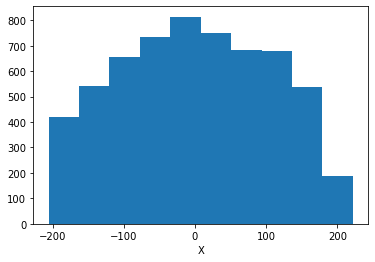

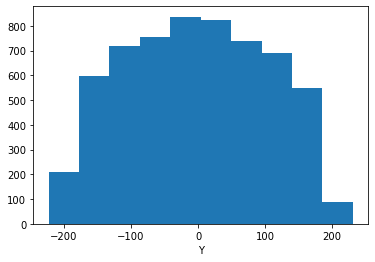

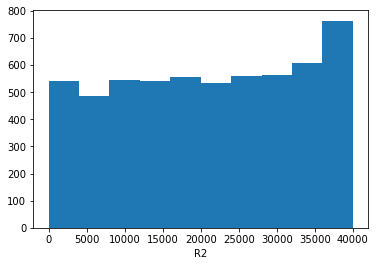

In [266]:
plt.hist(local_gravity_x[selfmask & prewindow_mask])
plt.xlabel('X')
plt.show()

plt.hist(local_gravity_y[selfmask & prewindow_mask])
plt.xlabel('Y')
plt.show()

plt.hist((local_gravity_x**2+local_gravity_y**2)[selfmask & prewindow_mask], range=(0, 200**2))
plt.xlabel('R2')
plt.show()

## Center of gravity, local, iterated

In [264]:
guess_it_ps = np.array([[local_gravity_x], [local_gravity_y]]).T

tstart = time()
sipmnears_it = np.zeros((len(guessps), len(sipmps)))
for e in range(len(guessps)):
    for sipm in range(nsipms):
        if events_sum_sipms_subtracted_zeroed[e][sipm] > 0:
            sipmnears_it[e][sipm] = np.int(np.linalg.norm(sipmps[sipm] - guess_it_ps[e]) < rmax)
print(time() - tstart)

157.12272191047668


In [265]:
rmax = 26

wsums = np.array([])
xsums = np.array([])
ysums = np.array([])

done = 0

tstart = time()

for sum_sipms_subtracted, sipmnear in zip(events_sum_sipms_subtracted_zeroed, sipmnears_it):
    if done % 10000 == 0:
        remaining =round((len(events_sum_sipms_subtracted_zeroed) - done) * (time() - tstart) / (done + 1), 1)
        dt = round(time() - tstart, 1)
        print(done, '/', len(events_sum_sipms_subtracted_zeroed), '; dt =', dt, '; Remaining:', remaining)
    done += 1

    wsums = np.append(wsums, np.sum(sum_sipms_subtracted * sipmnear))
    xsums = np.append(xsums, np.sum(DataSiPMX * sum_sipms_subtracted * sipmnear))
    ysums = np.append(ysums, np.sum(DataSiPMY * sum_sipms_subtracted * sipmnear))

localit_gravity_x = np.nan_to_num(xsums / wsums)
localit_gravity_y = np.nan_to_num(ysums / wsums)

print('Time to run loop =', round(time() - tstart,1))

0 / 33895 ; dt = 0.0 ; Remaining: 124.4
1000 / 33895 ; dt = 0.4 ; Remaining: 11.5
2000 / 33895 ; dt = 0.9 ; Remaining: 14.8
3000 / 33895 ; dt = 1.1 ; Remaining: 11.2
4000 / 33895 ; dt = 1.2 ; Remaining: 9.1
5000 / 33895 ; dt = 1.4 ; Remaining: 7.9
6000 / 33895 ; dt = 1.5 ; Remaining: 7.0
7000 / 33895 ; dt = 1.7 ; Remaining: 6.4
8000 / 33895 ; dt = 1.8 ; Remaining: 5.9
9000 / 33895 ; dt = 2.0 ; Remaining: 5.5
10000 / 33895 ; dt = 2.2 ; Remaining: 5.1
11000 / 33895 ; dt = 2.3 ; Remaining: 4.8
12000 / 33895 ; dt = 2.5 ; Remaining: 4.5
13000 / 33895 ; dt = 2.6 ; Remaining: 4.2
14000 / 33895 ; dt = 2.9 ; Remaining: 4.1
15000 / 33895 ; dt = 3.0 ; Remaining: 3.8
16000 / 33895 ; dt = 3.2 ; Remaining: 3.6
17000 / 33895 ; dt = 3.4 ; Remaining: 3.4
18000 / 33895 ; dt = 3.6 ; Remaining: 3.2
19000 / 33895 ; dt = 3.8 ; Remaining: 3.0
20000 / 33895 ; dt = 4.0 ; Remaining: 2.8
21000 / 33895 ; dt = 4.2 ; Remaining: 2.6
22000 / 33895 ; dt = 4.4 ; Remaining: 2.4
23000 / 33895 ; dt = 4.6 ; Remaining: 2.2


/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:22: RuntimeWarning: invalid value encountered in true_divide
/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:23: RuntimeWarning: invalid value encountered in true_divide


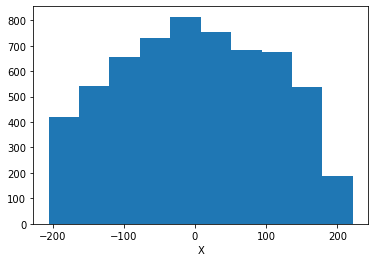

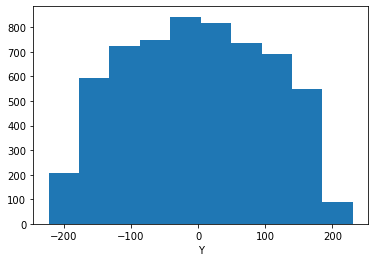

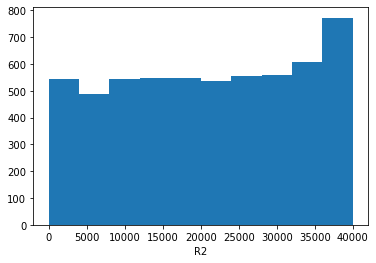

In [267]:
plt.hist(localit_gravity_x[selfmask & prewindow_mask])
plt.xlabel('X')
plt.show()

plt.hist(localit_gravity_y[selfmask & prewindow_mask])
plt.xlabel('Y')
plt.show()

plt.hist((localit_gravity_x**2+localit_gravity_y**2)[selfmask & prewindow_mask], range=(0, 200**2))
plt.xlabel('R2')
plt.show()

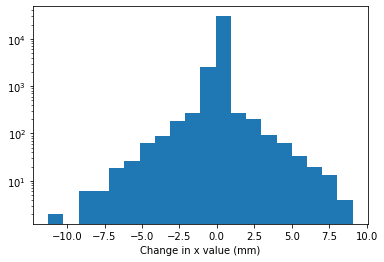

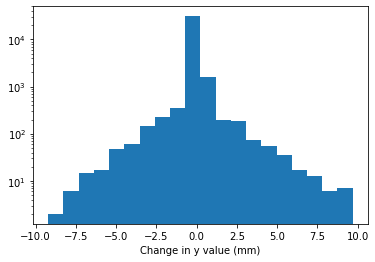

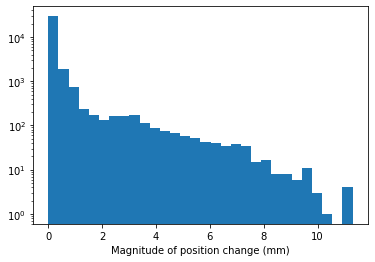

In [277]:
plt.hist(localit_gravity_x - local_gravity_x, bins = 20)
plt.yscale('log')
plt.xlabel('Change in x value (mm)')
plt.show()

plt.hist(localit_gravity_y - local_gravity_y, bins = 20)
plt.yscale('log')
plt.xlabel('Change in y value (mm)')
plt.show()

deltar = ((localit_gravity_x - local_gravity_x)**2 + (localit_gravity_y - local_gravity_y)**2)**0.5
plt.hist(deltar, bins = 30)
plt.yscale('log')
plt.xlabel('Magnitude of position change (mm)')
plt.show()

print('Median change =', np.median(deltar), 'mm')
print('Mean change =', round(np.mean(deltar),2), 'mm')

## Second gravity position iteration

In [284]:
guess_it_ps2 = np.array([[localit_gravity_x], [localit_gravity_y]]).T

tstart = time()
sipmnears_it2 = np.zeros((len(guessps), len(sipmps)))
for e in range(len(guessps)):
    for sipm in range(nsipms):
        if events_sum_sipms_subtracted_zeroed[e][sipm] > 0:
            sipmnears_it2[e][sipm] = np.int(np.linalg.norm(sipmps[sipm] - guess_it_ps2[e]) < rmax)
print(time() - tstart)

131.9233000278473


In [285]:
rmax = 26

wsums = np.array([])
xsums = np.array([])
ysums = np.array([])

done = 0

tstart = time()

for sum_sipms_subtracted, sipmnear in zip(events_sum_sipms_subtracted_zeroed, sipmnears_it2):
    if done % 10000 == 0:
        remaining =round((len(events_sum_sipms_subtracted_zeroed) - done) * (time() - tstart) / (done + 1), 1)
        dt = round(time() - tstart, 1)
        print(done, '/', len(events_sum_sipms_subtracted_zeroed), '; dt =', dt, '; Remaining:', remaining)
    done += 1

    wsums = np.append(wsums, np.sum(sum_sipms_subtracted * sipmnear))
    xsums = np.append(xsums, np.sum(DataSiPMX * sum_sipms_subtracted * sipmnear))
    ysums = np.append(ysums, np.sum(DataSiPMY * sum_sipms_subtracted * sipmnear))

localit2_gravity_x = np.nan_to_num(xsums / wsums)
localit2_gravity_y = np.nan_to_num(ysums / wsums)

print('Time to run loop =', round(time() - tstart,1))

0 / 33895 ; dt = 0.0 ; Remaining: 356.5
10000 / 33895 ; dt = 1.3 ; Remaining: 3.2
20000 / 33895 ; dt = 2.5 ; Remaining: 1.7
30000 / 33895 ; dt = 3.9 ; Remaining: 0.5
Time to run loop = 4.5


/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:22: RuntimeWarning: invalid value encountered in true_divide
/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:23: RuntimeWarning: invalid value encountered in true_divide


Second iteration, changes for ALL EVENTS


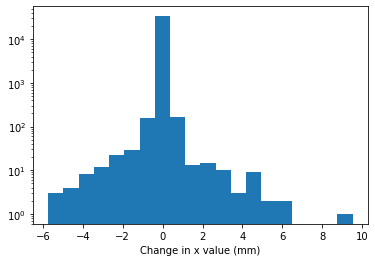

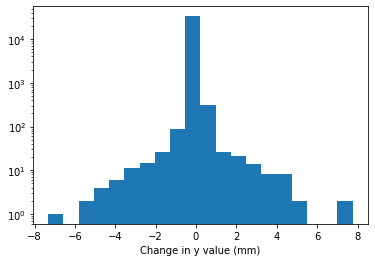

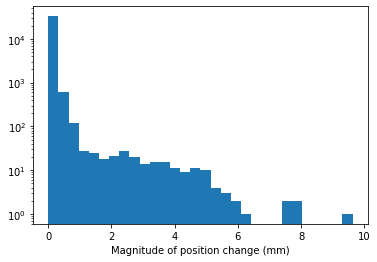

Median change = 0.0 mm
Mean change = 0.04 mm
Max change = 9.63 mm


In [289]:
print('Second iteration, changes for ALL EVENTS')

plt.hist(localit2_gravity_x - localit_gravity_x, bins = 20)
plt.yscale('log')
plt.xlabel('Change in x value (mm)')
plt.show()

plt.hist(localit2_gravity_y - localit_gravity_y, bins = 20)
plt.yscale('log')
plt.xlabel('Change in y value (mm)')
plt.show()

deltar2 = ((localit2_gravity_x - localit_gravity_x)**2 + (localit2_gravity_y - localit_gravity_y)**2)**0.5
plt.hist(deltar2, bins = 30)
plt.yscale('log')
plt.xlabel('Magnitude of position change (mm)')
plt.show()

print('Median change =', np.median(deltar2), 'mm')
print('Mean change =', round(np.mean(deltar2),2), 'mm')
print('Max change =', round(np.max(deltar2),2), 'mm')

Second iteration, change for GOOD EVENTS ONLY


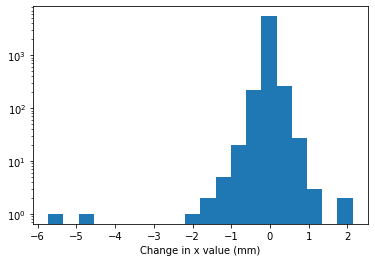

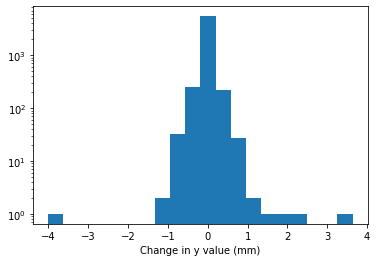

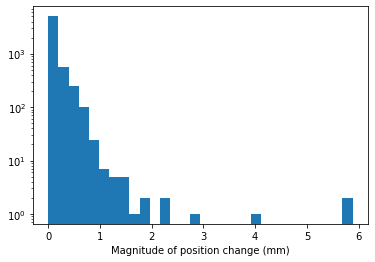

Median change = 0.0 mm
Mean change = 0.08 mm
Max change = 5.88 mm


In [290]:
print('Second iteration, change for GOOD EVENTS ONLY')

msk = selfmask & prewindow_mask

plt.hist(localit2_gravity_x[msk] - localit_gravity_x[msk], bins = 20)
plt.yscale('log')
plt.xlabel('Change in x value (mm)')
plt.show()

plt.hist(localit2_gravity_y[msk] - localit_gravity_y[msk], bins = 20)
plt.yscale('log')
plt.xlabel('Change in y value (mm)')
plt.show()

deltar2 = ((localit2_gravity_x - localit_gravity_x)**2 + (localit2_gravity_y - localit_gravity_y)**2)**0.5
plt.hist(deltar2[msk], bins = 30)
plt.yscale('log')
plt.xlabel('Magnitude of position change (mm)')
plt.show()

print('Median change =', np.median(deltar2[msk]), 'mm')
print('Mean change =', round(np.mean(deltar2[msk]),2), 'mm')
print('Max change =', round(np.max(deltar2[msk]),2), 'mm')

## Center of gravity resolution, self and other corrected

/Users/jmhaefner/miniconda/envs/IC-3.7-2020-06-16/lib/python3.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in true_divide


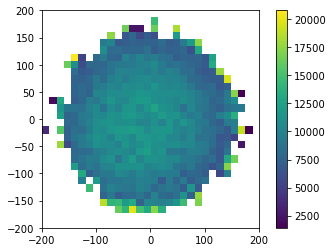

In [149]:
# Create own correction map

nbins = 30
clim = 200
dbin = 2 * clim / nbins
coord_range = np.linspace(-clim, clim, nbins + 1)
coord_bins = np.vstack((coord_range[:-1], coord_range[1:])).T

energy_sum = np.zeros((len(coord_bins),len(coord_bins)))
events_sum = np.zeros((len(coord_bins),len(coord_bins)))
for ix in range(len(coord_bins)):
    for iy in range(len(coord_bins)):
        xbin = coord_bins[ix]
        ybin = coord_bins[iy]
        xmask = (global_gravity_x > xbin[0]) & (global_gravity_x <= xbin[1])
        ymask = (global_gravity_y > ybin[0]) & (global_gravity_y <= ybin[1])
        xymask = xmask & ymask
        events_sum[ix][iy] = np.sum(xymask & selfmask)
        energy_sum[ix][iy] = np.sum(events_energy_subtracted[xymask & selfmask])
        
energy_xy_ggrav = energy_sum / events_sum
energy_xy_bounds = ((-200, 200), (-200, 200))

plt.imshow(energy_xy_ggrav, extent=[-200, 200, -200, 200], origin = 'lower')
plt.colorbar()
plt.show()

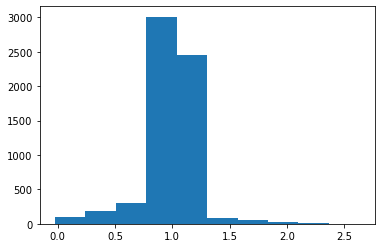

Attempting to fit a Gaussian with guess (A0, m0, s0) = (16.0, 1, 0.18429612215853047)


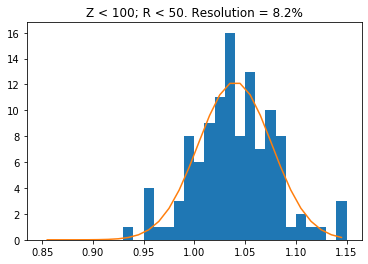

Attempting to fit a Gaussian with guess (A0, m0, s0) = (40.0, 1, 0.1946427175971389)


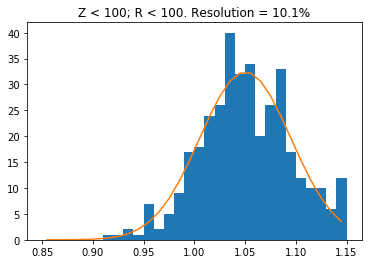

Attempting to fit a Gaussian with guess (A0, m0, s0) = (57.0, 1, 0.21540643465543638)


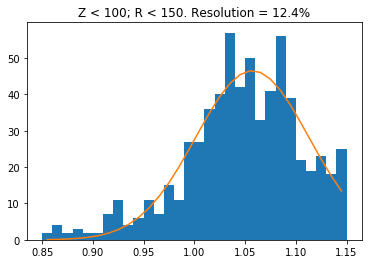

Attempting to fit a Gaussian with guess (A0, m0, s0) = (59.0, 1, 0.2260759840297598)


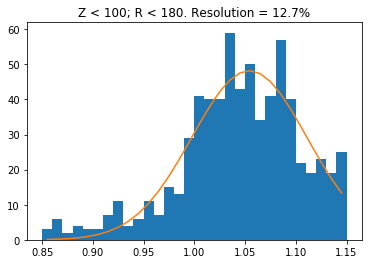

Attempting to fit a Gaussian with guess (A0, m0, s0) = (22.0, 1, 0.1633422321937727)


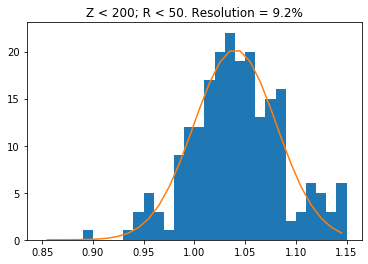

Attempting to fit a Gaussian with guess (A0, m0, s0) = (70.0, 1, 0.1988805446453063)


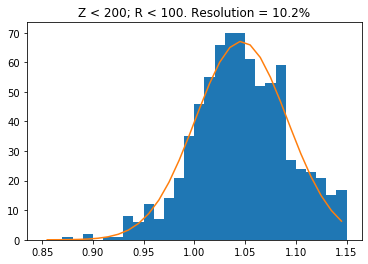

Attempting to fit a Gaussian with guess (A0, m0, s0) = (107.0, 1, 0.2243204331956303)


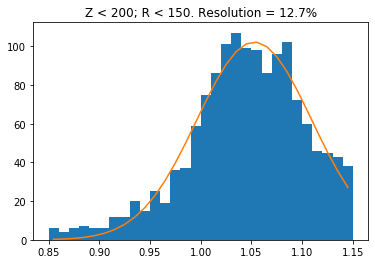

Attempting to fit a Gaussian with guess (A0, m0, s0) = (114.0, 1, 0.23199742060084386)


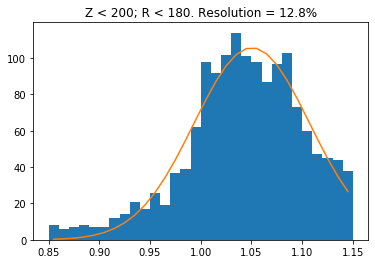

Attempting to fit a Gaussian with guess (A0, m0, s0) = (30.0, 1, 0.16300401799334976)


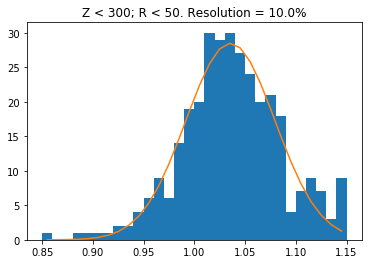

Attempting to fit a Gaussian with guess (A0, m0, s0) = (105.0, 1, 0.20142592379888657)


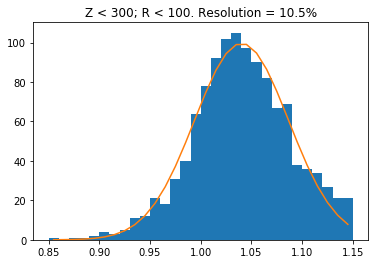

Attempting to fit a Gaussian with guess (A0, m0, s0) = (159.0, 1, 0.22443753320599547)


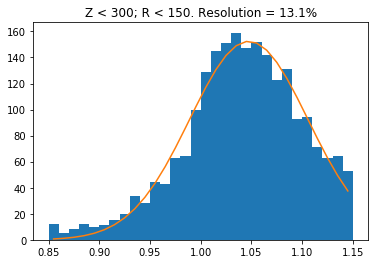

Attempting to fit a Gaussian with guess (A0, m0, s0) = (166.0, 1, 0.23198010515029766)


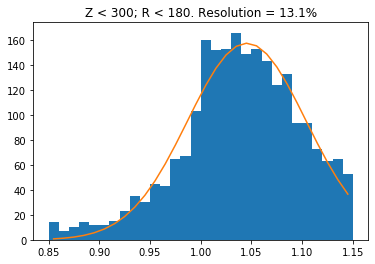

Attempting to fit a Gaussian with guess (A0, m0, s0) = (42.0, 1, 0.16209008522543586)


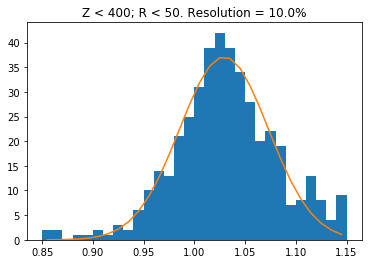

Attempting to fit a Gaussian with guess (A0, m0, s0) = (147.0, 1, 0.20601297836749857)


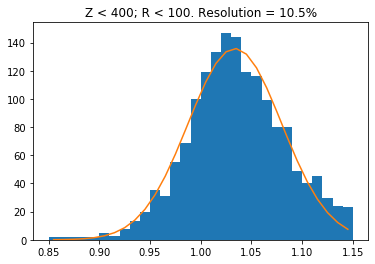

Attempting to fit a Gaussian with guess (A0, m0, s0) = (219.0, 1, 0.22538760423371582)


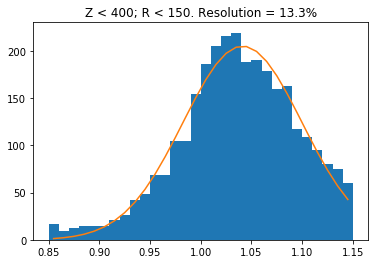

Attempting to fit a Gaussian with guess (A0, m0, s0) = (227.0, 1, 0.23159326430518618)


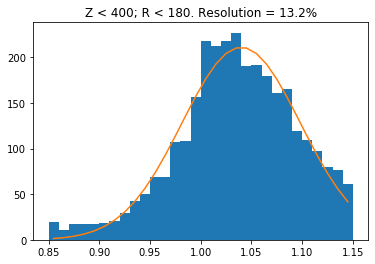

Attempting to fit a Gaussian with guess (A0, m0, s0) = (50.0, 1, 0.15482670586616853)


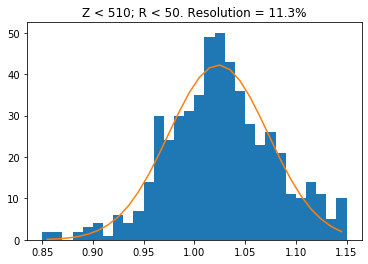

Attempting to fit a Gaussian with guess (A0, m0, s0) = (182.0, 1, 0.19981422227371445)


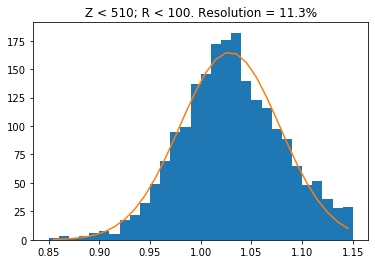

Attempting to fit a Gaussian with guess (A0, m0, s0) = (278.0, 1, 0.2209096978900064)


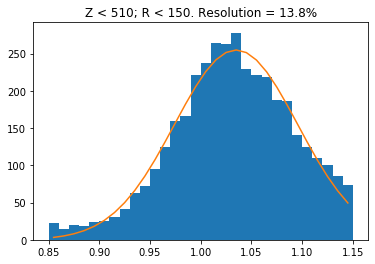

Attempting to fit a Gaussian with guess (A0, m0, s0) = (286.0, 1, 0.22634308649366724)


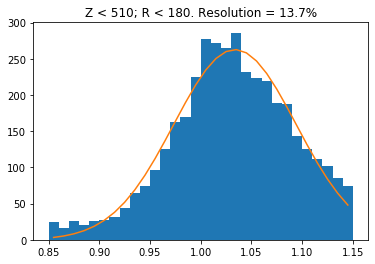

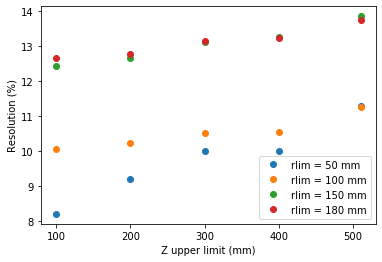

Best resolution =  8.2 %


In [150]:
# Correct energy and examine resolution using self generated center of gravity correction map
scaled_energy = correct_energies(energy_xy_ggrav, energy_xy_bounds, umask = selfmask, xvals = global_gravity_x, yvals = global_gravity_y)
self_res_vs_zr = fit_res_vs_zr(scaled_energy, energy_xy_ggrav, energy_xy_bounds, umask = selfmask, xvals = global_gravity_x, yvals = global_gravity_y)
plot_res_vs_zr(self_res_vs_zr)

## Plot R2 for Kr events, noise

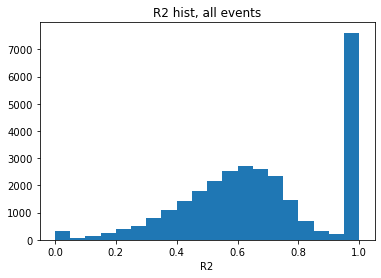

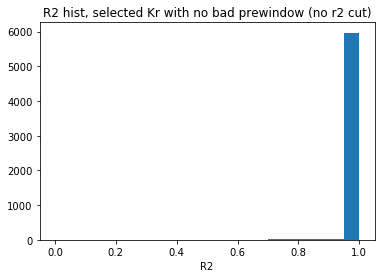

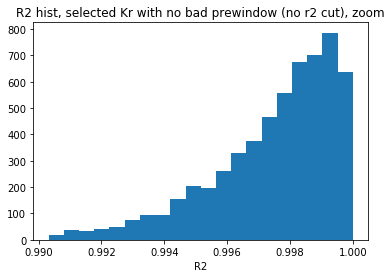

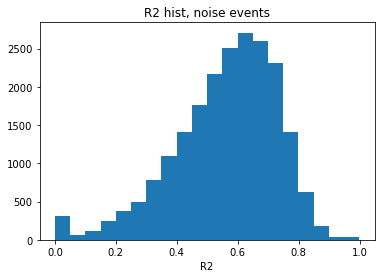

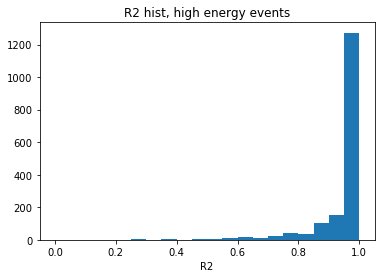

In [151]:
plt.hist(all_R2, range = (0, max(all_R2)), bins = 20)
plt.xlabel('R2')
plt.title('R2 hist, all events')
plt.show()

mymask = selfmask_nor2 & prewindow_mask
plt.hist(all_R2[mymask], range = (0, max(all_R2[mymask])), bins = 20)
plt.xlabel('R2')
plt.title('R2 hist, selected Kr with no bad prewindow (no r2 cut)')
plt.show()

mymask = selfmask_nor2 & prewindow_mask
plt.hist(all_R2[mymask], range = (np.percentile(all_R2[mymask],5), max(all_R2[mymask])), bins = 20)
plt.xlabel('R2')
plt.title('R2 hist, selected Kr with no bad prewindow (no r2 cut), zoom')
plt.show()

mymask = (events_energy < noise_bound)
plt.hist(all_R2[mymask], range = (0, max(all_R2[mymask])), bins = 20)
plt.xlabel('R2')
plt.title('R2 hist, noise events')
plt.show()

mymask = (events_energy > med+lrq) & (all_Zgauss > 0)
plt.hist(all_R2[mymask], range = (0, max(all_R2[mymask])), bins = 20)
plt.xlabel('R2')
plt.title('R2 hist, high energy events')
plt.show()

## Kr resolution vs window width

iw = 0
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.12325208359436254)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (38.0, 1, 0.11397397804368217)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (85.0, 1, 0.12221761389875696)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (104.0, 1, 0.11859775307514858)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.11358326364270221)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (44.0, 1, 0.1017433285814406)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (94.0, 1, 0.11339000226490561)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (118.0, 1, 0.11711267773668642)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.11306768146221588)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (45.0, 1, 0.11132994841882003)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (95.0, 1, 0.11747650193846981)
Attempting to fit a Gaussian with guess (A0, m

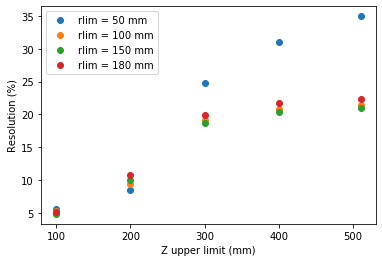

Best resolution =  4.8 %
iw = 1
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.12364222543019819)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.11419777413545273)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (78.0, 1, 0.12244451388664883)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (101.0, 1, 0.11877451544267822)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (14.0, 1, 0.11276987443406145)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (51.0, 1, 0.10051380818168124)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.11275118263353723)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (126.0, 1, 0.11677169981518133)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.11113491743525739)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (53.0, 1, 0.108819959955595)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (100.0, 1, 0.11549585840365097)
Attempting to fit a G

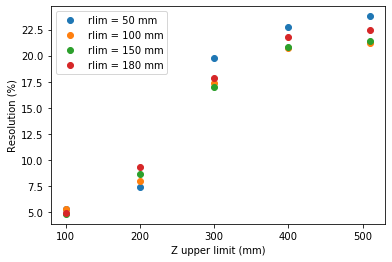

Best resolution =  4.8 %
iw = 2
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.12400089848744199)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (36.0, 1, 0.11441994400917237)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.12265437156113523)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.1189797248919186)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.11222067673453563)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (53.0, 1, 0.09963069396591141)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (102.0, 1, 0.11232881074581431)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (133.0, 1, 0.11660121162380518)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (16.0, 1, 0.10981628826224432)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (56.0, 1, 0.10688107760643874)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (104.0, 1, 0.1139122979553303)
Attempting to fit a G

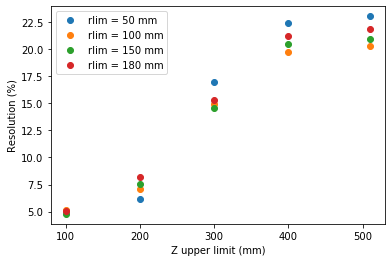

Best resolution =  4.8 %
iw = 3
Attempting to fit a Gaussian with guess (A0, m0, s0) = (9.0, 1, 0.12425700383968588)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (34.0, 1, 0.1145261028340866)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (77.0, 1, 0.12278185861986166)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.11908951615033775)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.11179721611386753)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (53.0, 1, 0.09895772211185744)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (112.0, 1, 0.112064650328012)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (149.0, 1, 0.11656969115943656)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (16.0, 1, 0.10874240083324309)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (55.0, 1, 0.10537390705061939)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (118.0, 1, 0.11267731138902962)
Attempting to fit a Gau

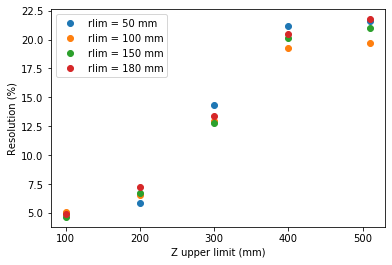

Best resolution =  4.7 %
iw = 4
Attempting to fit a Gaussian with guess (A0, m0, s0) = (10.0, 1, 0.12442338542579197)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.1145939068309681)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (78.0, 1, 0.12288305986140699)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (101.0, 1, 0.1191812647064121)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.1114396535992514)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (57.0, 1, 0.09845125321869024)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (117.0, 1, 0.11190784746242262)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (154.0, 1, 0.11660315570283276)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.10798562778683)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (58.0, 1, 0.10419038860427597)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (123.0, 1, 0.11175216891249803)
Attempting to fit a Gaus

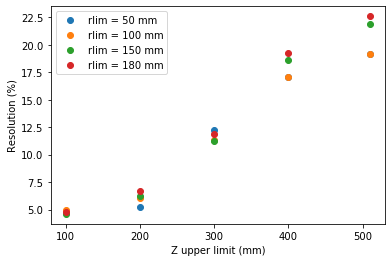

Best resolution =  4.6 %
iw = 5
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12456520943281514)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11467710923180716)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (79.0, 1, 0.12296783882298401)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (101.0, 1, 0.11925929868723939)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (21.0, 1, 0.11122058715581958)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (62.0, 1, 0.09814332279025136)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (128.0, 1, 0.1118194171633176)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (171.0, 1, 0.11665787427276629)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (21.0, 1, 0.10756480109899431)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (65.0, 1, 0.10336992913274488)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (133.0, 1, 0.11106662203844961)
Attempting to fit a

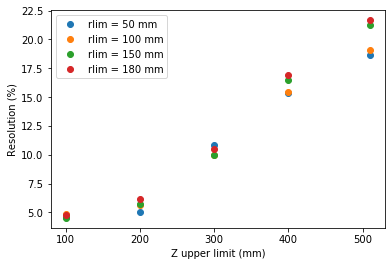

Best resolution =  4.5 %
iw = 6
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12463100220325654)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (35.0, 1, 0.11473319320642973)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (79.0, 1, 0.12305533604246927)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (101.0, 1, 0.11932621420277811)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (22.0, 1, 0.11103739949519313)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (59.0, 1, 0.09793596728261157)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (143.0, 1, 0.11177184742160046)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (182.0, 1, 0.1167397712557536)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (23.0, 1, 0.10721322698957653)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (64.0, 1, 0.10272619475003142)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (153.0, 1, 0.11052299970144476)
Attempting to fit a

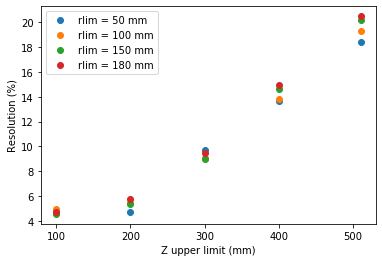

Best resolution =  4.6 %
iw = 7
Attempting to fit a Gaussian with guess (A0, m0, s0) = (13.0, 1, 0.12467348962180781)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (38.0, 1, 0.11481225972545295)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (81.0, 1, 0.12313955286682923)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (106.0, 1, 0.11938882186218486)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.11101794396871738)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (60.0, 1, 0.09784355929847804)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (134.0, 1, 0.11176570790871236)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (183.0, 1, 0.11681718084384123)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.10706609408498452)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.10229383030048432)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (153.0, 1, 0.11014417631984948)
Attempting to fit 

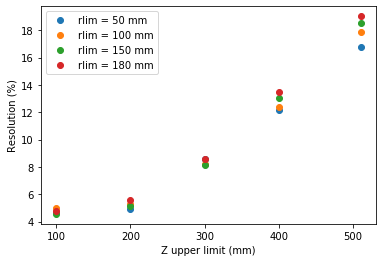

Best resolution =  4.6 %
iw = 8
Attempting to fit a Gaussian with guess (A0, m0, s0) = (13.0, 1, 0.1247177986565483)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.11489374435954768)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (80.0, 1, 0.12323987254851458)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (103.0, 1, 0.11947233074251905)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.11098500887147153)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (62.0, 1, 0.09779005263603816)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (140.0, 1, 0.11181646418863161)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (189.0, 1, 0.11694511451759734)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.1070527437592031)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (75.0, 1, 0.10201854920321168)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (154.0, 1, 0.10993865852090651)
Attempting to fit a 

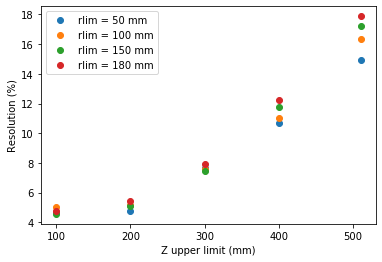

Best resolution =  4.6 %
iw = 9
Attempting to fit a Gaussian with guess (A0, m0, s0) = (13.0, 1, 0.12474697800502621)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (40.0, 1, 0.11490563216194692)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (80.0, 1, 0.12328256884436216)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (104.0, 1, 0.11951042180329166)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.11090980017952998)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09774049187622974)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (147.0, 1, 0.11184437814540273)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (191.0, 1, 0.11704559171498667)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (22.0, 1, 0.10702450577090919)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (84.0, 1, 0.10181027818029638)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (166.0, 1, 0.10977083407079662)
Attempting to fit 

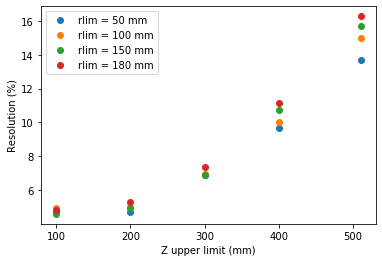

Best resolution =  4.6 %
iw = 10
Attempting to fit a Gaussian with guess (A0, m0, s0) = (13.0, 1, 0.12477199480039516)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (40.0, 1, 0.11493471082725644)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (79.0, 1, 0.12335083046379865)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (104.0, 1, 0.11956363966556692)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11087313584213493)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09770072134198925)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (147.0, 1, 0.11187908322196054)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (190.0, 1, 0.11711396233237205)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (22.0, 1, 0.10702354226504422)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (81.0, 1, 0.10167856664703412)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (174.0, 1, 0.1096788328009946)
Attempting to fit 

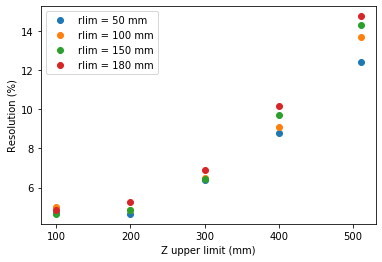

Best resolution =  4.7 %
iw = 11
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12478286485025863)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (38.0, 1, 0.11495412873339926)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (78.0, 1, 0.12344726640307437)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (102.0, 1, 0.11964460845052971)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11085995947137658)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.09767982220817815)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (149.0, 1, 0.11193105622156982)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (194.0, 1, 0.1172050845368002)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (21.0, 1, 0.1070311705491674)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (90.0, 1, 0.10161814594618664)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (180.0, 1, 0.10963431591295579)
Attempting to fit a

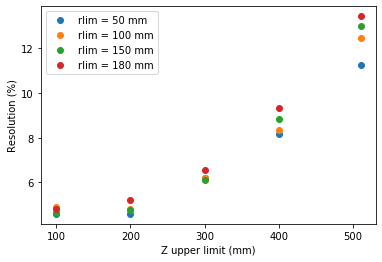

Best resolution =  4.6 %
iw = 12
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.1248126848637138)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.11495884865426811)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (77.0, 1, 0.12348970988992533)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (103.0, 1, 0.11968858746715524)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11084687986123001)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.09766170185428227)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (146.0, 1, 0.11195679368971254)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (189.0, 1, 0.11727200173806486)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (22.0, 1, 0.10707592066871577)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (92.0, 1, 0.10158095957649578)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (189.0, 1, 0.10960960865267998)
Attempting to fit 

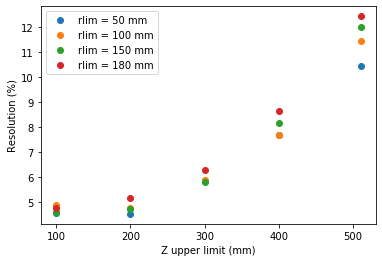

Best resolution =  4.5 %
iw = 13
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.1248264376681251)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (40.0, 1, 0.11507720710821374)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (78.0, 1, 0.12358698483181159)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (104.0, 1, 0.11976208179229021)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11081169490430544)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.09773266582118205)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (147.0, 1, 0.11202540277271364)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (191.0, 1, 0.11736066774648661)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (22.0, 1, 0.10702405906035238)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (93.0, 1, 0.10160296380980753)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (193.0, 1, 0.10961607712753192)
Attempting to fit 

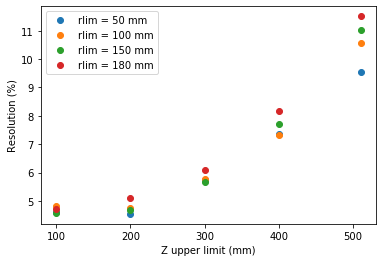

Best resolution =  4.5 %
iw = 14
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12486684254141807)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (38.0, 1, 0.11509962184596993)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.12365294047397699)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.1198170409270948)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11084161775423493)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (70.0, 1, 0.0977324492868207)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (152.0, 1, 0.112062066237849)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (195.0, 1, 0.11742256360273352)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.10709787434963139)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.10161376813749122)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (197.0, 1, 0.1096277898722209)
Attempting to fit a Gau

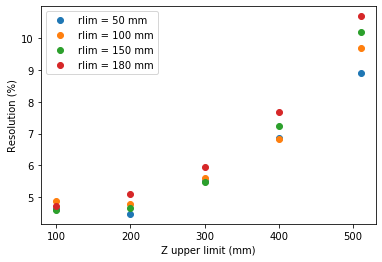

Best resolution =  4.5 %
iw = 15
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12489981063682089)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.11514249338718943)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (76.0, 1, 0.12371281020950553)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.1198666325631019)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11089566754252883)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.0977682180895189)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (150.0, 1, 0.11209436981282367)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (194.0, 1, 0.11745964823837636)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (26.0, 1, 0.10715610109565311)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10163251060476719)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (198.0, 1, 0.1096319392053059)
Attempting to fit a G

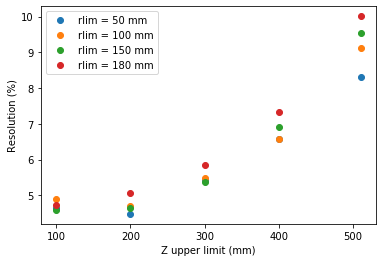

Best resolution =  4.5 %
iw = 16
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12490743038818618)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.11515225269688398)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (77.0, 1, 0.12376892226336973)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (101.0, 1, 0.1199114946156117)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.1109136678218701)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (66.0, 1, 0.09778064978480784)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (154.0, 1, 0.11213258041525759)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (196.0, 1, 0.1174978160846024)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (26.0, 1, 0.10721285678024632)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (94.0, 1, 0.10165193815547426)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (199.0, 1, 0.10964473304509527)
Attempting to fit a 

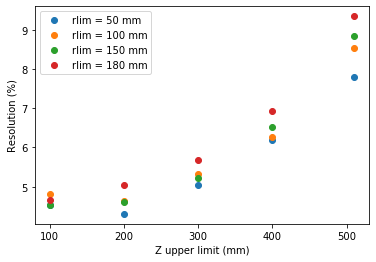

Best resolution =  4.3 %
iw = 17
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12491810124491409)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.1151456461438389)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (76.0, 1, 0.12380015206098474)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.11993616142951156)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11092787087471456)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09777820873454193)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (155.0, 1, 0.11214221100505617)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (197.0, 1, 0.11752382177970112)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (26.0, 1, 0.10731459000070975)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.10167781155063713)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (204.0, 1, 0.10966045536903525)
Attempting to fit a

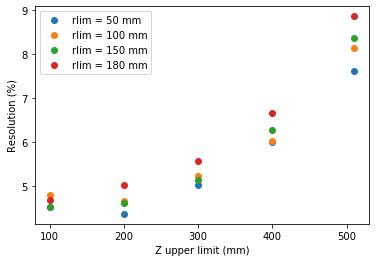

Best resolution =  4.4 %
iw = 18
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12493011195796105)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (36.0, 1, 0.11516441053588873)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (75.0, 1, 0.12382750961518992)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.11996338646072383)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11092286271162725)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (65.0, 1, 0.09778980208640957)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (154.0, 1, 0.11216214710930511)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (197.0, 1, 0.11755835367042612)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (29.0, 1, 0.10737186923518623)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.10171574265433715)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (208.0, 1, 0.1096834373069413)
Attempting to fit a

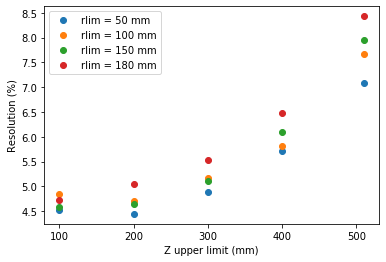

Best resolution =  4.4 %
iw = 19
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12496142635368888)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (36.0, 1, 0.11520679926472235)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (76.0, 1, 0.12386613218746084)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.11999363979553632)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11096127594579193)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09782405365572044)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (155.0, 1, 0.11219187535889122)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (199.0, 1, 0.11759690392081329)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (31.0, 1, 0.10744790895115858)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (93.0, 1, 0.10175592871774422)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (214.0, 1, 0.10971055123325821)
Attempting to fit 

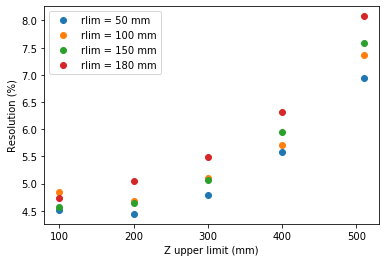

Best resolution =  4.4 %
iw = 20
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.1249576035015313)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (36.0, 1, 0.11520465237111194)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (76.0, 1, 0.12389333118906662)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.12001507759535236)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11099075614048924)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (66.0, 1, 0.09783250374334168)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (156.0, 1, 0.11221428340990758)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (200.0, 1, 0.11763194607233207)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.1075319479445471)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (94.0, 1, 0.10178528039779777)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (215.0, 1, 0.1097367782267183)
Attempting to fit a G

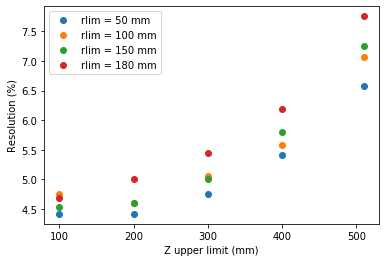

Best resolution =  4.4 %
iw = 21
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12496745317213702)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.11520884020124948)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (78.0, 1, 0.12392969422401302)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (102.0, 1, 0.12004738779508414)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.1110135972440607)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (66.0, 1, 0.09783820044178078)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (153.0, 1, 0.11223545538991628)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (198.0, 1, 0.11765524177798298)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.10756337116170754)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (94.0, 1, 0.10179418520667767)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (214.0, 1, 0.10975264481953319)
Attempting to fit 

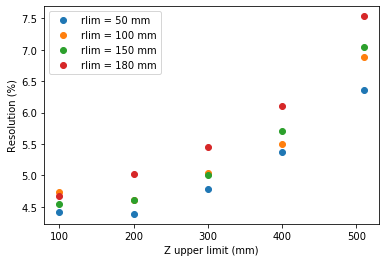

Best resolution =  4.4 %
iw = 22
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12496459609094102)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.11520201940429055)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (78.0, 1, 0.12394982598490903)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (102.0, 1, 0.12006321461707822)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.11102078153191833)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09784186187127494)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (156.0, 1, 0.1122485466936074)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (204.0, 1, 0.117668365165914)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.10757109018576869)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (95.0, 1, 0.10179514036728501)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (218.0, 1, 0.10975896652475009)
Attempting to fit a 

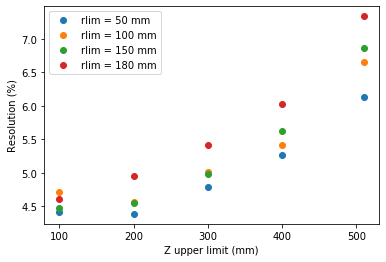

Best resolution =  4.4 %
iw = 23
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12497075171134335)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.11521938856465255)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (78.0, 1, 0.12397521451050647)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (101.0, 1, 0.12008592262163083)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.11103733124618645)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09785826005433264)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (157.0, 1, 0.11226397810458548)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (205.0, 1, 0.1176894968382226)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.1075856842131621)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.10180440169637213)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (216.0, 1, 0.10976976538198656)
Attempting to fit a

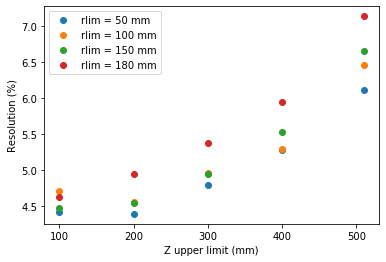

Best resolution =  4.4 %
iw = 24
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.1250081950530886)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (36.0, 1, 0.11522929767042667)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (76.0, 1, 0.12399308023604401)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.12009851320591727)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.11106600157885435)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09787513211270313)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (156.0, 1, 0.11228125037678954)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (205.0, 1, 0.11770817360272076)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.1076067404496097)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10182713568081926)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (216.0, 1, 0.10979093963344051)
Attempting to fit a 

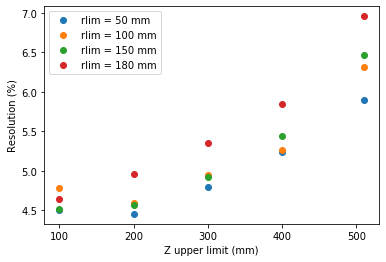

Best resolution =  4.5 %
iw = 25
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.1250227219162478)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (35.0, 1, 0.11523841922065806)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.12401357595355905)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.1201207711395954)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11107994675305233)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09788336978077569)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (158.0, 1, 0.11229657178712613)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (205.0, 1, 0.11772847850445958)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (31.0, 1, 0.10763336199198115)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10184009265035401)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (219.0, 1, 0.10980573302778565)
Attempting to fit a 

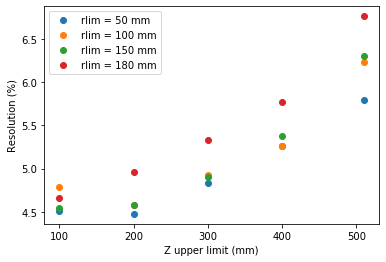

Best resolution =  4.5 %
iw = 26
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.125063133755012)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (35.0, 1, 0.11526374067153919)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.12404561061995653)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12014920612188988)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.1111155513576237)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09790791031867578)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (157.0, 1, 0.11231962870123231)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (204.0, 1, 0.11775311383598677)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (30.0, 1, 0.10765777564541422)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.1018618442737818)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (217.0, 1, 0.10982601296442761)
Attempting to fit a Ga

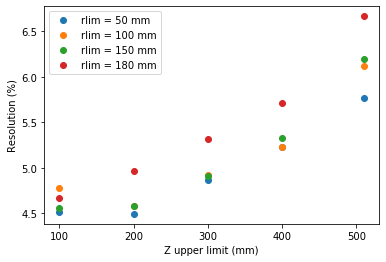

Best resolution =  4.5 %
iw = 27
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.12509112616923224)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (34.0, 1, 0.1152873465133343)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12406658053871136)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12016831333967314)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11114294293461792)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09792786039051302)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (155.0, 1, 0.11233521619434284)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (202.0, 1, 0.11778214846648016)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (30.0, 1, 0.10768654796274334)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10188629099343513)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (216.0, 1, 0.1098379404389912)
Attempting to fit a 

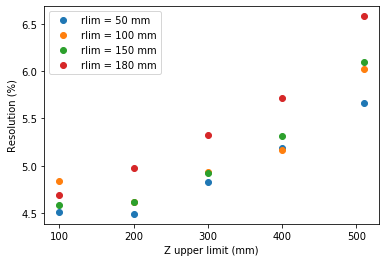

Best resolution =  4.5 %
iw = 28
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.12511232085396515)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (34.0, 1, 0.11530688395278882)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.1240765989739173)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.12018017627464461)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11117008632838345)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (69.0, 1, 0.09795009040755044)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (156.0, 1, 0.11234615836852374)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (203.0, 1, 0.11779543686501681)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (30.0, 1, 0.1077136461246769)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.10190458024006961)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (216.0, 1, 0.10984858791150738)
Attempting to fit a 

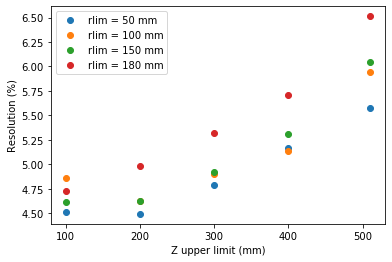

Best resolution =  4.5 %
iw = 29
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.1251260370010729)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11531298931848048)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.1240842969152374)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.12018742298604215)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11119077160571793)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (69.0, 1, 0.09796153877481813)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (157.0, 1, 0.11235423066808796)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (204.0, 1, 0.11780398371562044)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (31.0, 1, 0.10772603567949673)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10191359327549022)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (219.0, 1, 0.10985779225228198)
Attempting to fit a 

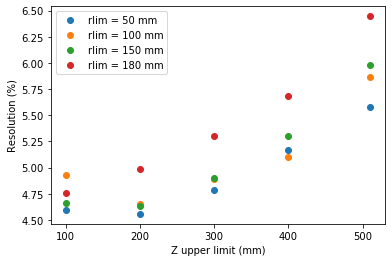

Best resolution =  4.6 %
iw = 30
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.12513594559072996)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11531460658410522)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.12409343704877109)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (95.0, 1, 0.1201919127157748)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11121125945990154)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.09797366821777194)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (159.0, 1, 0.11236345048887009)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (204.0, 1, 0.11781372394704787)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.10775702455692023)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.1019312702943078)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (220.0, 1, 0.10986735622177043)
Attempting to fit a 

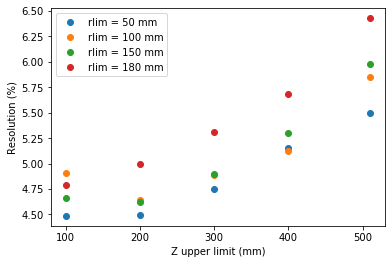

Best resolution =  4.5 %
iw = 31
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12513069635229965)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.1153145680111289)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (70.0, 1, 0.12409687383039132)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.12019936537785632)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11121854048102173)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (70.0, 1, 0.09798174439069217)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (159.0, 1, 0.11237583557569335)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (204.0, 1, 0.11783108574988907)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.10776795096267584)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.10194667515402298)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (221.0, 1, 0.10988260479408515)
Attempting to fit a

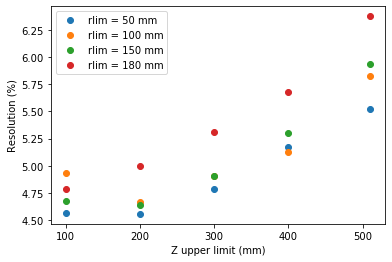

Best resolution =  4.6 %
iw = 32
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.1251217354952377)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.11530738323037708)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.12409990529363032)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12020345445151769)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.111212289885776)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (70.0, 1, 0.09798314877381742)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (157.0, 1, 0.11238039994708653)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (204.0, 1, 0.11783448453829373)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.10776508149903785)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.10195662995504667)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (221.0, 1, 0.10989264981926994)
Attempting to fit a G

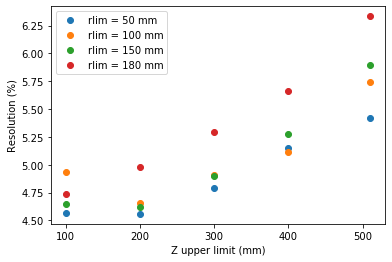

Best resolution =  4.6 %
iw = 33
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.125121758291088)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.1153076774738562)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.12410406746496085)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12021137812088442)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11122043126954025)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (70.0, 1, 0.09798674388849285)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (157.0, 1, 0.11238542808733666)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (203.0, 1, 0.11783978137162612)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (31.0, 1, 0.10777254060376235)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10196391182649509)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (220.0, 1, 0.10989689475841638)
Attempting to fit a G

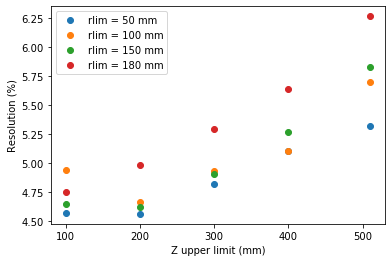

Best resolution =  4.6 %
iw = 34
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12513220325368513)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.11531072302251559)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.124109564393423)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.1202190558012864)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11123661646735128)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (70.0, 1, 0.09799354020578536)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (156.0, 1, 0.11239117703346115)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (202.0, 1, 0.11784783411717954)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.10779098298460331)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10197139662600184)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (219.0, 1, 0.10990277915906216)
Attempting to fit a G

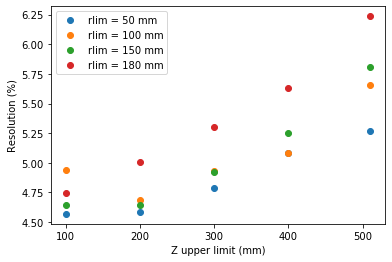

Best resolution =  4.6 %
iw = 35
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.1251424350812828)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.11531135914852701)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.12410711573053722)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.120219588854654)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11125118828476256)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.09800918630317683)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (158.0, 1, 0.11239642024459659)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (204.0, 1, 0.11785711978458024)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (31.0, 1, 0.10781947446379593)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.1019910192013481)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (221.0, 1, 0.1099104671181082)
Attempting to fit a Gau

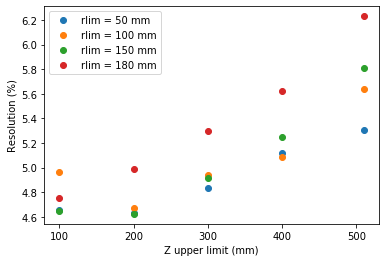

Best resolution =  4.6 %
iw = 36
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.1251464972637071)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.11531424491815236)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.12411743625266745)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.1202292768179253)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.11126088850790765)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.0980118736151268)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (160.0, 1, 0.1124009832026562)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (208.0, 1, 0.11786349866658179)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (31.0, 1, 0.10782562002754581)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10199560428694787)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (223.0, 1, 0.1099154026239141)
Attempting to fit a Gau

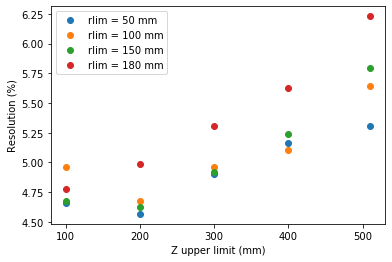

Best resolution =  4.6 %
iw = 37
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.12515117670860867)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.11531387340710186)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.12412226348783098)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.12023754606482819)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.11127159865556054)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.0980146115076297)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (159.0, 1, 0.11240484824055803)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (205.0, 1, 0.117869335398115)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (31.0, 1, 0.107829508871097)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.1020034545043821)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (222.0, 1, 0.10992207360944596)
Attempting to fit a Gaus

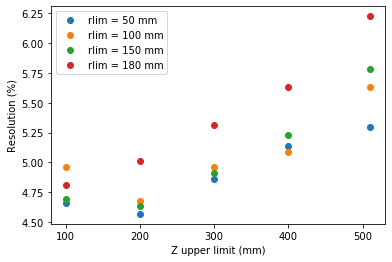

Best resolution =  4.6 %
iw = 38
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.1251568679149092)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.11531729314147113)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.12412400105514523)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.12024018658950875)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (20.0, 1, 0.11128151277259449)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.09802248916184239)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (160.0, 1, 0.11240872071687279)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (206.0, 1, 0.11787195568617735)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.10784099692090428)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.1020120574977893)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (223.0, 1, 0.10992676429626065)
Attempting to fit a 

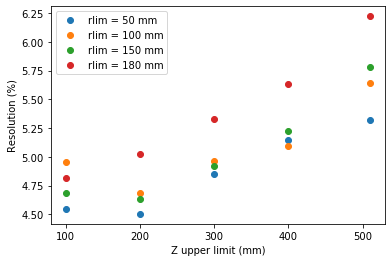

Best resolution =  4.5 %
iw = 39
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.1251666531018951)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.11532373609206639)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12412894548253134)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.12024745651446545)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (20.0, 1, 0.1112915607137645)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.09802916258193828)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (161.0, 1, 0.11241092056320712)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (207.0, 1, 0.11787653714566929)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.10784972912965396)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10201702205077617)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (224.0, 1, 0.10992893878106598)
Attempting to fit a 

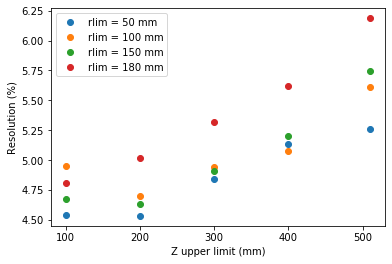

Best resolution =  4.5 %
iw = 40
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.12517992392737184)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.1153346914868341)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.12413281080268472)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.12025474352486658)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (20.0, 1, 0.11130894913682284)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.09803885913569177)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (159.0, 1, 0.11241526980183854)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (205.0, 1, 0.11788563917227848)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.10786134424470363)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10202736102137994)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (221.0, 1, 0.10993503832707965)
Attempting to fit a

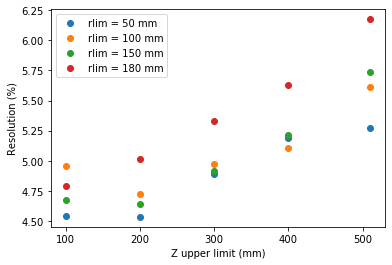

Best resolution =  4.5 %
iw = 41
Attempting to fit a Gaussian with guess (A0, m0, s0) = (11.0, 1, 0.12518423671860732)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.11533901911124857)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.12413711736191184)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.12025762155449515)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (20.0, 1, 0.11131826834413978)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.09804464058928326)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (159.0, 1, 0.11242764814890137)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (205.0, 1, 0.11789525321715945)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.1078739974920939)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.1020358201650548)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (223.0, 1, 0.10994453306522842)
Attempting to fit a 

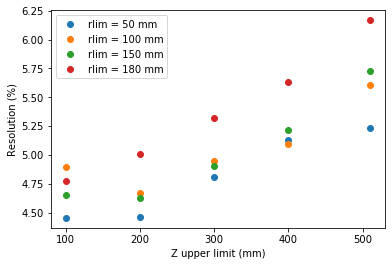

Best resolution =  4.5 %
iw = 42
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12518168344744923)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.11534004183415497)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12413812958842974)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.12026017785999729)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (20.0, 1, 0.11132868256383362)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.09804924417574369)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (157.0, 1, 0.11243121849671518)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (204.0, 1, 0.11789905027123673)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.10788856425290928)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (100.0, 1, 0.10204397268873046)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (222.0, 1, 0.1099506790545641)
Attempting to fit 

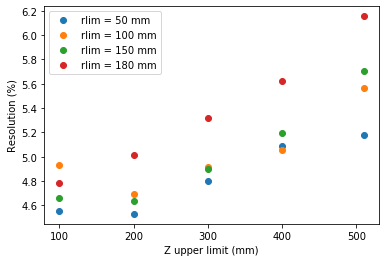

Best resolution =  4.5 %
iw = 43
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12518884970782326)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.11534341713962307)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.12413879706497491)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.12026247112519743)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.11133971554115736)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.0980527514032099)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (155.0, 1, 0.11243218135248632)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (202.0, 1, 0.11790371577425406)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (31.0, 1, 0.10788970387671283)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (100.0, 1, 0.10204809648943289)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (221.0, 1, 0.1099530758355555)
Attempting to fit a

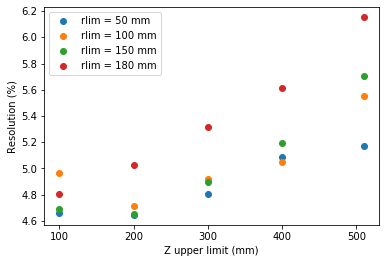

Best resolution =  4.6 %
iw = 44
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12518756729658342)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11534719362630744)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12413868539350728)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.12026494757453404)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (19.0, 1, 0.11134631327073917)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.09806025492181587)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (155.0, 1, 0.1124357810232163)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (202.0, 1, 0.11790817889208116)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (30.0, 1, 0.1079003615787256)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.1020575466129861)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (221.0, 1, 0.10995738770657237)
Attempting to fit a G

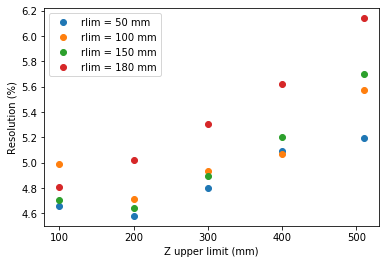

Best resolution =  4.6 %
iw = 45
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12521285330953666)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.1153573502778581)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12414417393290156)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12027099672814183)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11137009503482258)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.09807116609025486)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (155.0, 1, 0.11244023782480302)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (201.0, 1, 0.11791330126030541)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (29.0, 1, 0.10791659209364667)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10206961458590251)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (221.0, 1, 0.10996254848856116)
Attempting to fit a

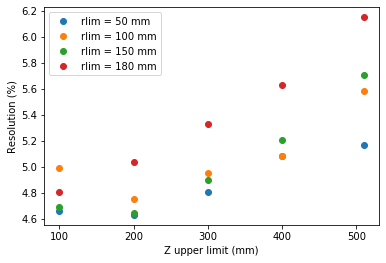

Best resolution =  4.6 %
iw = 46
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12523945141369308)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11536845698845556)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.12414878950864987)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12027649413616365)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11139439528384572)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.0980809480401993)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (156.0, 1, 0.11244493973524752)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (202.0, 1, 0.11791899928856094)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (29.0, 1, 0.10793297451040627)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.1020775381094603)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (222.0, 1, 0.10996647199138987)
Attempting to fit a 

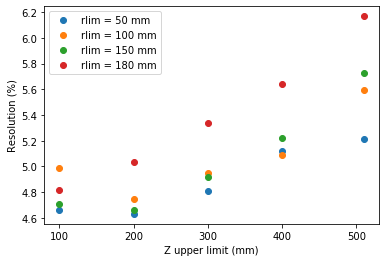

Best resolution =  4.6 %
iw = 47
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12524373820010473)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11537527883335354)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.12414657586237828)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12027547091124634)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11140062136512507)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.09808911000220705)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (155.0, 1, 0.11244547669201743)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (200.0, 1, 0.11791983875865078)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (29.0, 1, 0.10793816607009779)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10208639303972562)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (220.0, 1, 0.10996840140844141)
Attempting to fit 

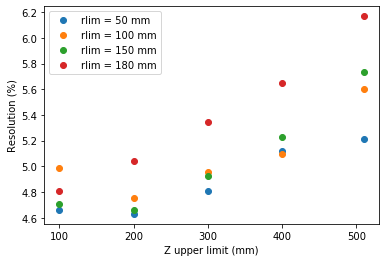

Best resolution =  4.6 %
iw = 48
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12525858369921453)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11538181177879822)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.12414876890224724)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.12027879001226718)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11141476699320553)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (70.0, 1, 0.09809584331322418)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (154.0, 1, 0.11244778481492691)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (200.0, 1, 0.11792537758802757)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (29.0, 1, 0.10794963398726395)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10209415126993558)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (220.0, 1, 0.10997066284518013)
Attempting to fit 

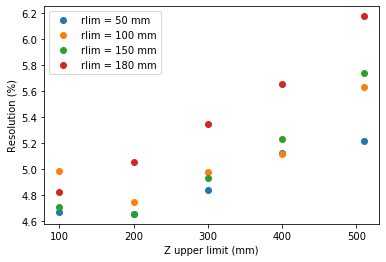

Best resolution =  4.7 %
iw = 49
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12526447239182795)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11538559496846475)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12414178352362254)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.120274802707385)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11142213112986711)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (70.0, 1, 0.09810148158824317)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (153.0, 1, 0.1124459090377506)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (200.0, 1, 0.11792745518928903)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (29.0, 1, 0.10795322861053841)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10209850337198835)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (220.0, 1, 0.10996905951665986)
Attempting to fit a G

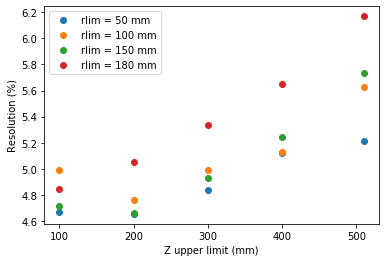

Best resolution =  4.7 %
iw = 50
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12527649214763206)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.1153909584448871)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.12414002938160529)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12027508548169454)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11143631298143128)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (70.0, 1, 0.09810774542621854)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (153.0, 1, 0.11244538027907688)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (199.0, 1, 0.11792909365506762)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (29.0, 1, 0.10796376424797376)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10210631730746)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (221.0, 1, 0.10997061940539976)
Attempting to fit a Ga

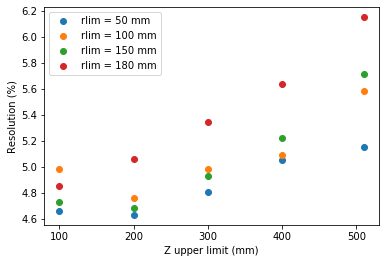

Best resolution =  4.6 %
iw = 51
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12527575616964)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11539361066805401)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.1241403980662088)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12027555433800882)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11144070957420352)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09811073066427639)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (152.0, 1, 0.11244498234274342)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (198.0, 1, 0.11792993975735817)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (29.0, 1, 0.10796817615370274)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.10211110621108514)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (220.0, 1, 0.10997108018458994)
Attempting to fit a Ga

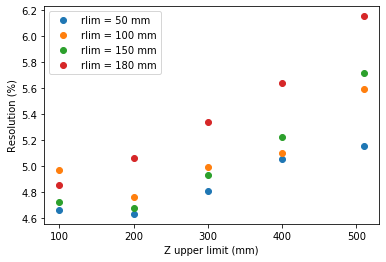

Best resolution =  4.6 %
iw = 52
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12528730853503506)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11539920111843707)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.1241392513971737)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.12027559104756774)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11145204010072449)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09811675355659513)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (152.0, 1, 0.11244483936476116)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (198.0, 1, 0.1179334018630903)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (29.0, 1, 0.107973229285432)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.10211780719103362)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (219.0, 1, 0.10997248427736041)
Attempting to fit a Ga

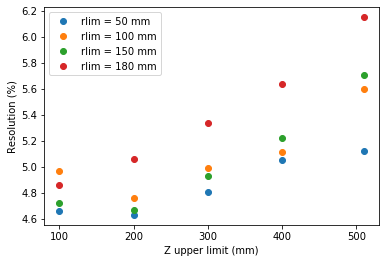

Best resolution =  4.6 %
iw = 53
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12529250356789584)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.1154042582756503)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12413770476539439)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12027391602437285)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11145858413825897)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09812116429138093)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (152.0, 1, 0.11244360931421804)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (198.0, 1, 0.11793642441120089)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (29.0, 1, 0.10797549477102594)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.10212132161256589)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (219.0, 1, 0.10997233047656813)
Attempting to fit a

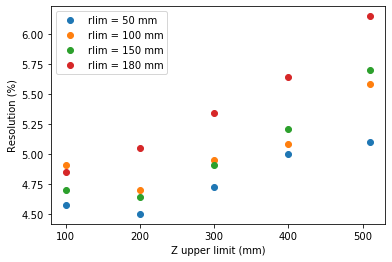

Best resolution =  4.5 %
iw = 54
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12529852764610663)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11540937819778821)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12413713843176757)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12027482797729894)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11147348637054155)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09812809866210392)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (151.0, 1, 0.11244299974651212)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (197.0, 1, 0.11793636960342363)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (28.0, 1, 0.10798475117981685)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (95.0, 1, 0.10212919734187884)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (218.0, 1, 0.10997319093313826)
Attempting to fit 

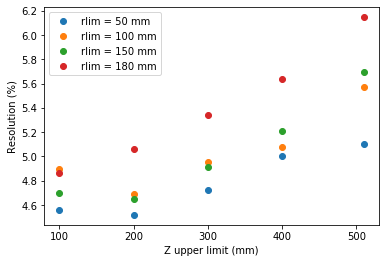

Best resolution =  4.5 %
iw = 55
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12530479926254806)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11541088581925758)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12413338761069037)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.12027047813267112)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11148416899749236)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09813174050046314)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (152.0, 1, 0.11244057697986636)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (198.0, 1, 0.11793555211760877)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (28.0, 1, 0.1079888735914591)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (95.0, 1, 0.10213398434836035)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (219.0, 1, 0.10997226348657799)
Attempting to fit a

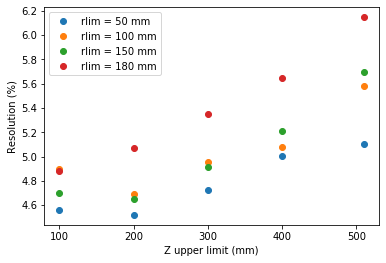

Best resolution =  4.5 %
iw = 56
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12530775357040022)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11541363295920479)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.1241341468616369)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.12027041458027883)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.1114908312596135)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (66.0, 1, 0.09813561622194657)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (152.0, 1, 0.11243859508377974)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (198.0, 1, 0.11793454243277542)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (27.0, 1, 0.10799424704160883)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (94.0, 1, 0.10213913144315347)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (219.0, 1, 0.1099716910437228)
Attempting to fit a G

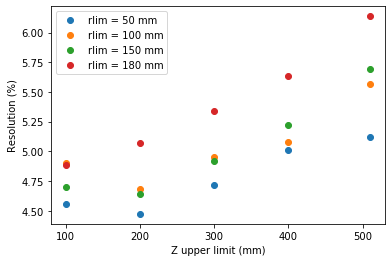

Best resolution =  4.5 %
iw = 57
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12531372769513502)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (33.0, 1, 0.11541975711868116)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (73.0, 1, 0.12413514002610765)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.12026845547371649)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11149815764186405)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.0981427072838887)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (151.0, 1, 0.11243797438994137)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (196.0, 1, 0.11793379153369533)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (27.0, 1, 0.10799917186474889)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (93.0, 1, 0.10214740010865611)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (218.0, 1, 0.10997177282589538)
Attempting to fit a

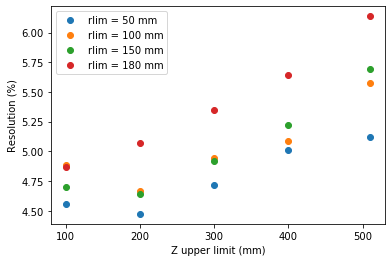

Best resolution =  4.5 %
iw = 58
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12531972891740692)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (34.0, 1, 0.11542456647300092)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12413401389046326)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12026247791752814)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11150544652552992)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09814888892129693)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (150.0, 1, 0.11243671020296579)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (195.0, 1, 0.11793100361861412)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (27.0, 1, 0.10800428193375201)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (94.0, 1, 0.10215415919869494)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (218.0, 1, 0.10997274767464378)
Attempting to fit 

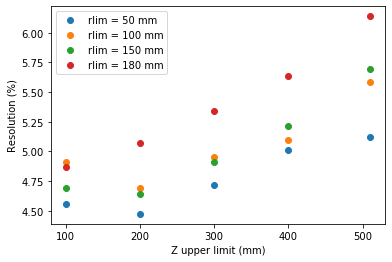

Best resolution =  4.5 %
iw = 59
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.1253312604119864)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (34.0, 1, 0.11543135683915397)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12413436081752328)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12025246884092713)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11151318895346389)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09815423820677271)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (151.0, 1, 0.11243467251698812)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (196.0, 1, 0.11792473993149641)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (27.0, 1, 0.10801113374512676)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (95.0, 1, 0.1021607144747518)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (219.0, 1, 0.10997236864092669)
Attempting to fit a 

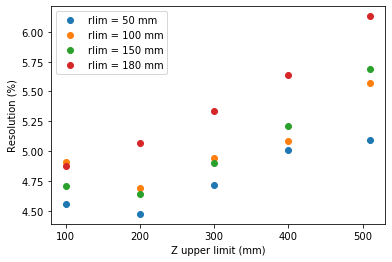

Best resolution =  4.5 %
iw = 60
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.125339525233125)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (35.0, 1, 0.11543886113570952)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.1241369477479784)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.12024306750699443)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11152472830161475)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (66.0, 1, 0.09816214778691265)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (152.0, 1, 0.1124348042905593)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (197.0, 1, 0.11792021749192551)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (27.0, 1, 0.1080193901599586)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (95.0, 1, 0.10216885876593687)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (220.0, 1, 0.10997288929815732)
Attempting to fit a Gau

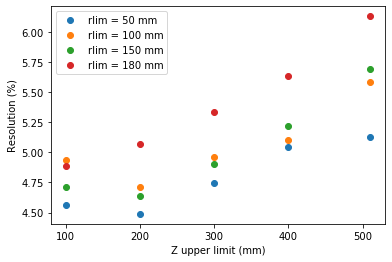

Best resolution =  4.5 %
iw = 61
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.1253507241095942)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (35.0, 1, 0.1154443654325297)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.12413797188089472)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.12023608910183477)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.1115376564459901)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (65.0, 1, 0.09816890561099778)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (153.0, 1, 0.11243263792296317)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (199.0, 1, 0.11791411845813281)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (27.0, 1, 0.10803065389361902)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (95.0, 1, 0.10217669360839289)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (222.0, 1, 0.10997213177472837)
Attempting to fit a G

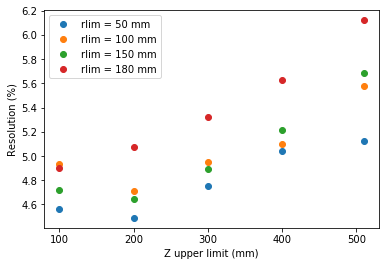

Best resolution =  4.5 %
iw = 62
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12536117581717146)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (35.0, 1, 0.11544974431009156)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.12413740387953447)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.12021613110201158)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11155020376254393)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (66.0, 1, 0.09817455023636361)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (152.0, 1, 0.11243043463985396)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (196.0, 1, 0.11790481914190942)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (26.0, 1, 0.10803996746112288)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.10218311627564781)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (222.0, 1, 0.10996873785727171)
Attempting to fit 

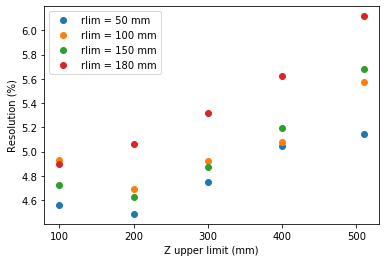

Best resolution =  4.5 %
iw = 63
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12536721052902408)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (34.0, 1, 0.11545609787201147)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.12413802595185545)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.1201944844934351)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11155926853232496)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (66.0, 1, 0.09818052313502898)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (151.0, 1, 0.11242818834668147)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (194.0, 1, 0.11789252372313908)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (26.0, 1, 0.10805214691516728)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10219105786285763)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (220.0, 1, 0.1099684146720145)
Attempting to fit a 

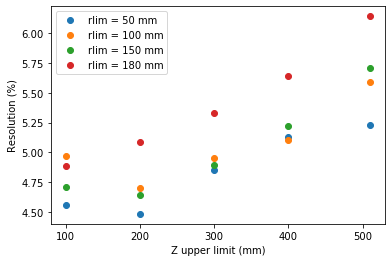

Best resolution =  4.5 %
iw = 64
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12537481122394348)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (34.0, 1, 0.11546021615488022)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.12414131728896921)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.12017107842015212)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11156956237863183)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09818541140656221)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (149.0, 1, 0.11242839604942799)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (192.0, 1, 0.11787946156896259)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (27.0, 1, 0.1080610382838372)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10219858082059473)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (216.0, 1, 0.10997044474683304)
Attempting to fit a

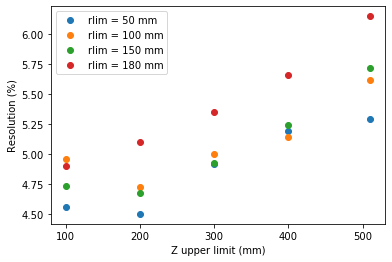

Best resolution =  4.5 %
iw = 65
Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12538233041481459)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (34.0, 1, 0.11546273155469912)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (71.0, 1, 0.12414072912074885)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.12013957211801464)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11157931207946897)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09818888162095962)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (149.0, 1, 0.11242642994031635)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (192.0, 1, 0.11786067829903261)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (27.0, 1, 0.10807416655221863)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.102205663792606)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (215.0, 1, 0.10997069146787303)
Attempting to fit a 

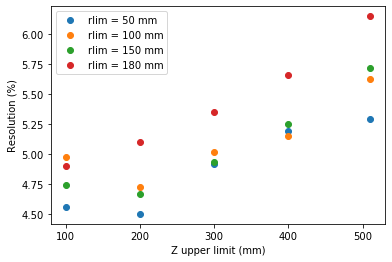

Best resolution =  4.5 %
iw = 66
Attempting to fit a Gaussian with guess (A0, m0, s0) = (13.0, 1, 0.12538809848018476)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (35.0, 1, 0.11547024206061832)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12414461390722678)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.12011172942520192)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11158774131115883)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09819614742419532)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (148.0, 1, 0.11242759761919509)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (191.0, 1, 0.11784464014687154)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (26.0, 1, 0.1080881338216604)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10221558480724192)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (214.0, 1, 0.10997370504701881)
Attempting to fit a

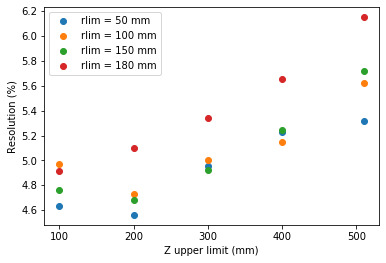

Best resolution =  4.6 %
iw = 67
Attempting to fit a Gaussian with guess (A0, m0, s0) = (13.0, 1, 0.1253920818221196)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (35.0, 1, 0.11547480016714681)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (72.0, 1, 0.12414766485058105)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.12008411830110056)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11159653895554915)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.0982019553764017)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (149.0, 1, 0.11242786683457731)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (191.0, 1, 0.11782974341956597)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (26.0, 1, 0.10810059642392382)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10222439258013619)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (213.0, 1, 0.10997669824263105)
Attempting to fit a 

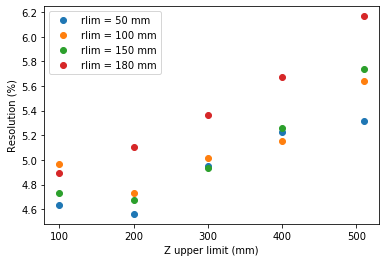

Best resolution =  4.6 %
iw = 68
Attempting to fit a Gaussian with guess (A0, m0, s0) = (14.0, 1, 0.1253985056280964)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (36.0, 1, 0.11547508219341168)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.1241468815597529)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.12005521937077861)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11160541689771439)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.09820459868956462)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (148.0, 1, 0.1124262218051944)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (191.0, 1, 0.11781330140836517)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.10811873237436144)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10223216334899474)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (214.0, 1, 0.10997833335989184)
Attempting to fit a G

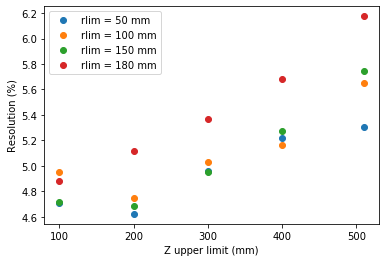

Best resolution =  4.6 %
iw = 69
Attempting to fit a Gaussian with guess (A0, m0, s0) = (14.0, 1, 0.1254037834081483)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (36.0, 1, 0.11547776877615344)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.12414532162890164)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (100.0, 1, 0.12002819397025294)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11161416786488491)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09820914954974407)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (149.0, 1, 0.1124242078259355)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (190.0, 1, 0.11779816030990045)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.10812653605756507)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10223829663832895)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (213.0, 1, 0.10997803248995423)
Attempting to fit a

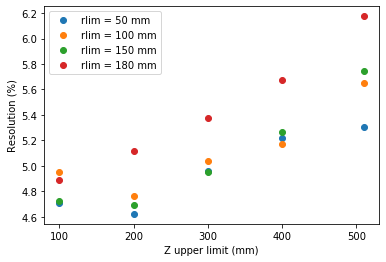

Best resolution =  4.6 %
iw = 70
Attempting to fit a Gaussian with guess (A0, m0, s0) = (14.0, 1, 0.1254102476402102)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (36.0, 1, 0.11548379584514847)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.12414966350996938)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (100.0, 1, 0.1200118573440486)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11162203972282857)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (69.0, 1, 0.09821530374182869)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (151.0, 1, 0.11242513834791473)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (190.0, 1, 0.11778644107206629)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.10813132103369721)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10224495366583473)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (211.0, 1, 0.10997927051518216)
Attempting to fit a

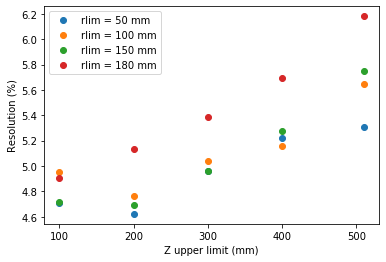

Best resolution =  4.6 %
iw = 71
Attempting to fit a Gaussian with guess (A0, m0, s0) = (14.0, 1, 0.12541452518588936)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.1154904077168223)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.12415174123815481)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (100.0, 1, 0.11998610579434404)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (17.0, 1, 0.11163348674977144)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (69.0, 1, 0.09822320977708318)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (151.0, 1, 0.11242603914567137)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (190.0, 1, 0.11777041364159359)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.10814202913931972)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.10225386702377137)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (209.0, 1, 0.10998109511172499)
Attempting to fit 

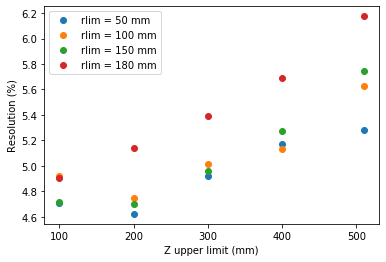

Best resolution =  4.6 %
iw = 72
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.12542697071835185)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (38.0, 1, 0.11549268013737511)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.12415276464485896)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (100.0, 1, 0.1199612550182372)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11164501933591907)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09822551803153258)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (150.0, 1, 0.1124238516099293)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (189.0, 1, 0.1177524411045226)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.10814712881942032)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (98.0, 1, 0.10225828483820881)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (210.0, 1, 0.10998083204493682)
Attempting to fit a 

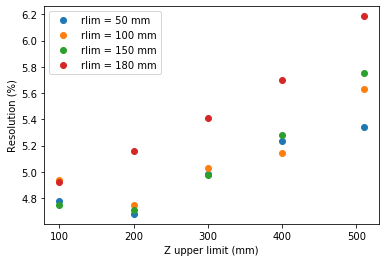

Best resolution =  4.7 %
iw = 73
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.12543099515159759)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.11550036088492)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (76.0, 1, 0.12415632028219853)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (102.0, 1, 0.11994227641220681)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11165074720654618)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (67.0, 1, 0.0982322216712067)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (150.0, 1, 0.11242472446420308)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (189.0, 1, 0.11773864510483356)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.10814935757139853)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.10226428174454882)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (210.0, 1, 0.1099823890884524)
Attempting to fit a Ga

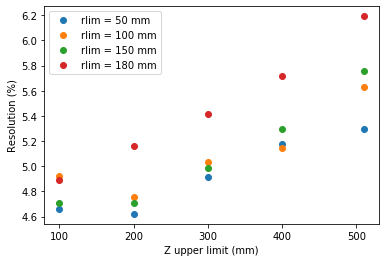

Best resolution =  4.6 %
iw = 74
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.12544030191404837)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.1155101059460433)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (75.0, 1, 0.1241568252277209)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (101.0, 1, 0.11992337367176525)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11166235539414121)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.0982415944139815)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (151.0, 1, 0.11242472858208813)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (189.0, 1, 0.11772629834415613)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.1081569790784168)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (96.0, 1, 0.10227192582003837)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (209.0, 1, 0.10998315714644612)
Attempting to fit a G

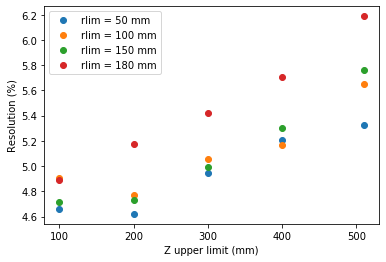

Best resolution =  4.6 %
iw = 75
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.12544526114373902)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.11551055180623865)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (75.0, 1, 0.12415439150742846)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (102.0, 1, 0.11990856995063699)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11166752911351079)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09824348154403534)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (150.0, 1, 0.11242463814163767)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (189.0, 1, 0.11771568564608867)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.10815843657927408)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (95.0, 1, 0.10227489791221149)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (213.0, 1, 0.10998351290530822)
Attempting to fit

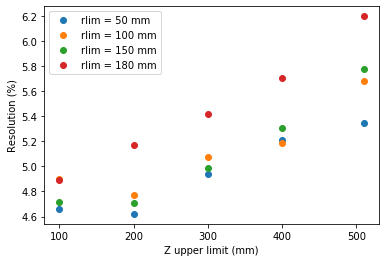

Best resolution =  4.6 %
iw = 76
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.1254491251871843)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.11551563189286236)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.12415688319591738)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (100.0, 1, 0.11990109298638338)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.1116758618484336)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.09824980081788415)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (152.0, 1, 0.11242596312113114)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (191.0, 1, 0.1177118139339009)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.1081654896971698)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10228160421866009)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (210.0, 1, 0.10998570507013088)
Attempting to fit a G

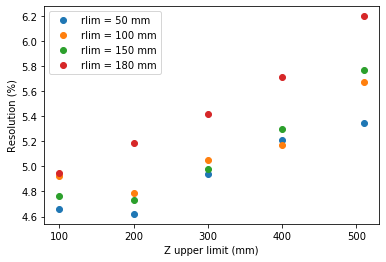

Best resolution =  4.6 %
iw = 77
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.1254584070858547)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.11551778434226483)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.12415433257720439)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.11988999718623879)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11168556549770281)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.0982522426471121)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (153.0, 1, 0.1124267413644549)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (193.0, 1, 0.11771233863929988)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.10817523923195647)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10228533295163973)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (211.0, 1, 0.10998635029323742)
Attempting to fit a G

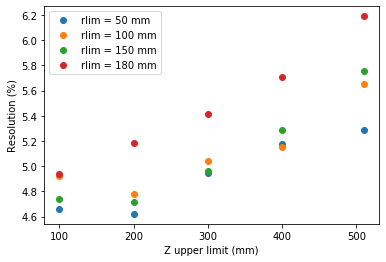

Best resolution =  4.6 %
iw = 78
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.12546082755497814)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.11551969442723609)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.12415462426353636)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.11988421039000231)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11169297249970399)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.0982558220586079)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (152.0, 1, 0.11243012546080872)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (192.0, 1, 0.11772212153277463)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.1081830115043348)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10229086716024914)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (213.0, 1, 0.10999024973753017)
Attempting to fit a 

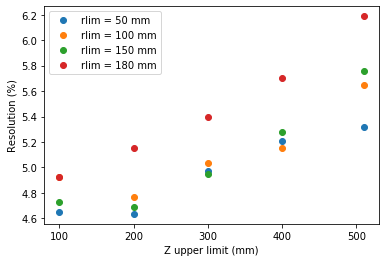

Best resolution =  4.6 %
iw = 79
Attempting to fit a Gaussian with guess (A0, m0, s0) = (15.0, 1, 0.12546705204615702)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.11552596046547944)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (74.0, 1, 0.12415099781208089)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (99.0, 1, 0.119878821431419)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (18.0, 1, 0.11170104925331359)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (68.0, 1, 0.0982621843002816)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (156.0, 1, 0.11243481519609937)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (196.0, 1, 0.11774345029126926)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (25.0, 1, 0.10818913453030832)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (97.0, 1, 0.10229755352972265)
Attempting to fit a Gaussian with guess (A0, m0, s0) = (211.0, 1, 0.10999462304170969)
Attempting to fit a G

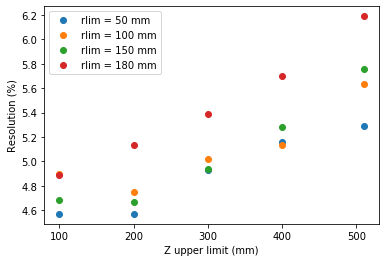

Best resolution =  4.6 %


In [152]:
nwindows = len(events_window_energy[0])
# Note that window (min, max, step) = (100, 500, 5)
wmin, wmax, wstep = 100, 500, 5
res_vs_window_best = []
res_vs_window_worst = []
mymask = prewindow_mask & selfmask
for iw in range(nwindows):
    frac_of_max = (wmin + wstep * iw) / wmax
    all_E_window = np.array([ events_window_energy[e][iw] - events_prewindow_sums[e]*frac_of_max for e in range(len(events_window_energy)) ])
    #plt.hist(all_E_window, range = (600, 15000))
    
    # Check resolution at window width
    print('iw =', iw)
    scaled_energy = correct_energies(energy_xy, energy_xy_bounds, umask = mymask, show = False, energies = all_E_window)
    self_res_vs_zr = fit_res_vs_zr(scaled_energy, energy_xy, energy_xy_bounds, umask = mymask, show = False)
    plt.cla()
    plot_res_vs_zr(self_res_vs_zr)
    res_vs_window_best.append(min(self_res_vs_zr.values()))
    res_vs_window_worst.append(max(self_res_vs_zr.values()))

    plt.show()

In [153]:
windows = np.arange(wmin, wmax, wstep)
windows = 2 * (windows * 25 / 1000)

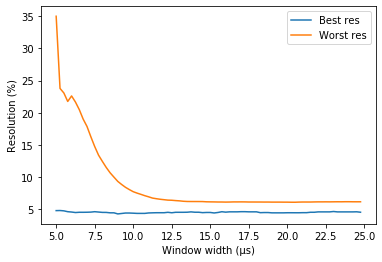

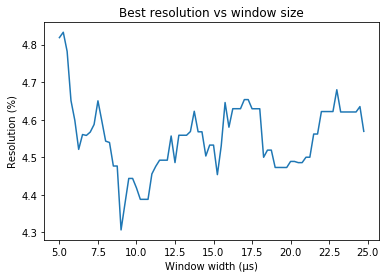

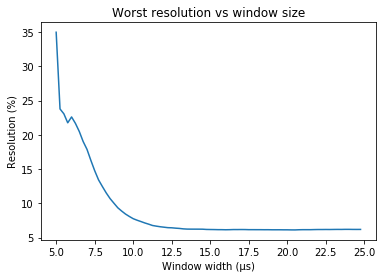

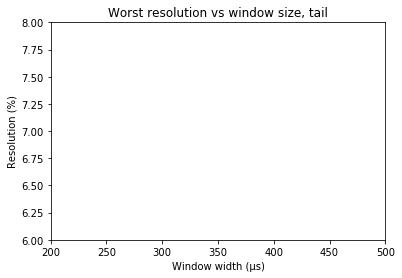

In [154]:
plt.plot(windows,res_vs_window_best,label='Best res')
plt.plot(windows,res_vs_window_worst,label='Worst res')
plt.ylabel('Resolution (%)')
plt.xlabel('Window width (µs)')
plt.legend()
plt.show()

plt.plot(windows,res_vs_window_best)
plt.title('Best resolution vs window size')
plt.ylabel('Resolution (%)')
plt.xlabel('Window width (µs)')
plt.show()

plt.plot(windows,res_vs_window_worst)
plt.title('Worst resolution vs window size')
plt.ylabel('Resolution (%)')
plt.xlabel('Window width (µs)')
plt.show()

plt.plot(windows,res_vs_window_worst)
plt.title('Worst resolution vs window size, tail')
plt.ylabel('Resolution (%)')
plt.xlabel('Window width (µs)')
plt.xlim(200, 500)
plt.ylim(6, 8)
plt.show()

## Self lifetime fit

In [155]:
type(line)

function

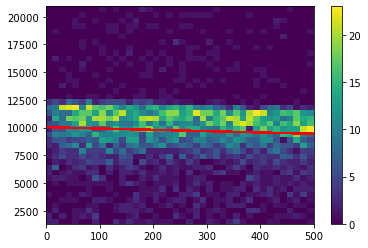

In [156]:
general_mask = prewindow_mask & selfmask
mymask = general_mask

emin, emax = min(events_energy_subtracted[mymask]), max(events_energy_subtracted[mymask])
hlt = plt.hist2d(all_Zgauss[mymask], events_energy_subtracted[mymask], range=((0,500),(emin,emax)), bins = 40)
plt.colorbar(hlt[3])

# Fit to determine the lifetime
xdata = all_Zgauss[mymask]
ydata = events_energy_subtracted[mymask]
guess = (0, 10000)
popt, pcov = curve_fit(line, xdata, ydata, p0 = guess)
ltline = line(xdata, *popt)
plt.plot(xdata, ltline, '-', color = 'r')

plt.show()

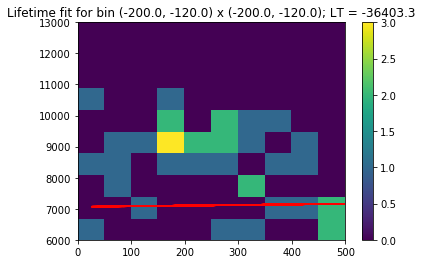

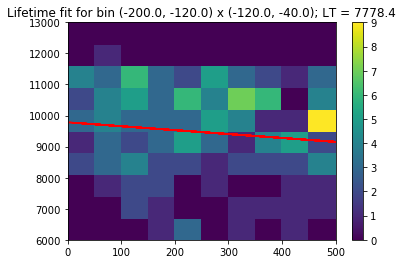

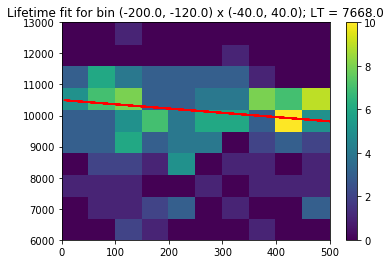

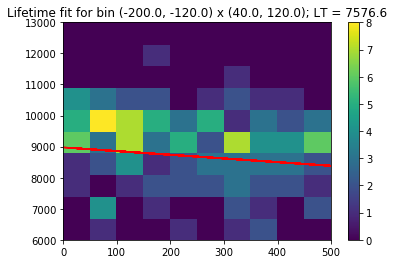

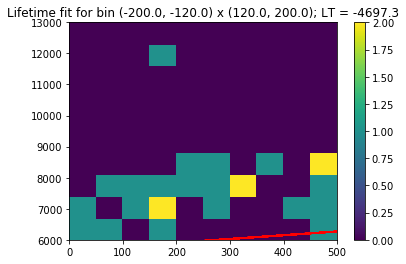

...

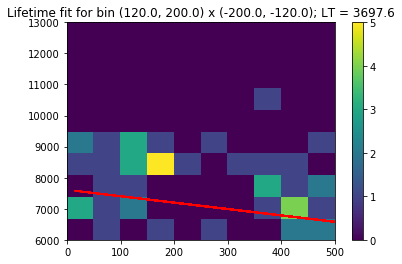

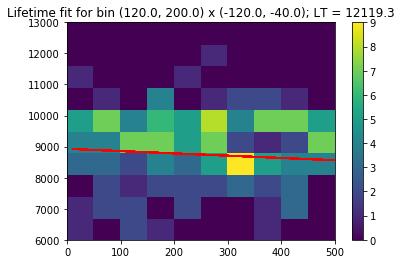

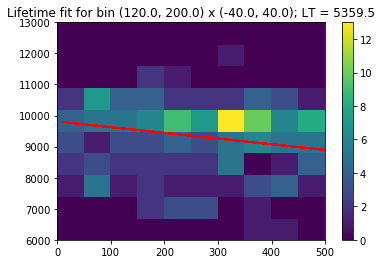

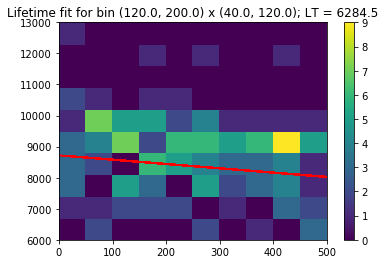

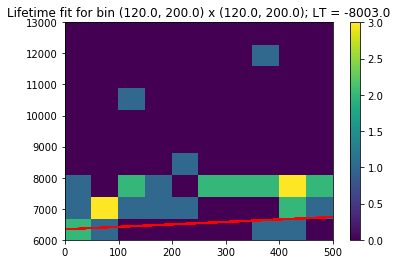

In [157]:
xedges = np.linspace(-200, 200, 5+1)
xbins = [ (xedges[i], xedges[i+1]) for i in range(len(xedges) - 1)]
ybins = xbins

self_ltmap = []

for xbin in xbins:
    lt_vs_ybin = []
    for ybin in ybins:

        xmask = (events_X_sipm_subtracted > xbin[0]) & (events_X_sipm_subtracted < xbin[1])
        ymask = (events_Y_sipm_subtracted > ybin[0]) & (events_Y_sipm_subtracted < ybin[1])
        mymask = general_mask & xmask & ymask

        emin, emax = 6000, 13000
        # emin, emax = min(events_energy_subtracted[mymask]), max(events_energy_subtracted[mymask])
        hlt = plt.hist2d(all_Zgauss[mymask], events_energy_subtracted[mymask], range=((0,500),(emin,emax)), bins = 10)
        plt.colorbar(hlt[3])

        # Fit to determine the lifetime
        xdata = all_Zgauss[mymask]
        ydata = events_energy_subtracted[mymask]
        guess = (0, 10000)
        popt, pcov = curve_fit(line, xdata, ydata, p0 = guess)
        ltline = line(xdata, *popt)
        plt.plot(xdata, ltline, '-', color = 'r')
        plt.title('Lifetime fit for bin '+str(xbin)+' x '+str(ybin)+'; LT = '+str(round(-popt[1]/popt[0],1)))

        lt_vs_ybin.append(-popt[1]/popt[0])
        
        plt.show()
    self_ltmap.append(lt_vs_ybin)

In [158]:
# The energy looks like E0 * exp(-z/lt) ~= E0 * (1 - z / lt) = E0 - (E0 / lt) * z.
# So, m = - E0 / lt => lt = - E0 / m

In [159]:
self_ltmap = np.round(np.array(self_ltmap))
print(self_ltmap)

[[-36403.   7778.   7668.   7577.  -4697.]
 [  6788.   5167.   8061.  11438.   8889.]
 [  3885.   8579.   8243.  11360.  12118.]
 [  9349.  11575.   5966.   7871.  26651.]
 [  3698.  12119.   5359.   6284.  -8003.]]


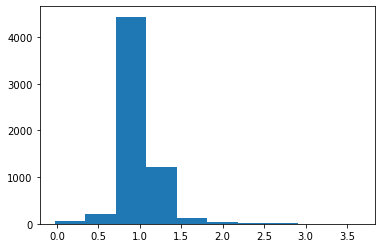

Attempting to fit a Gaussian with guess (A0, m0, s0) = (12.0, 1, 0.12670716196308357)


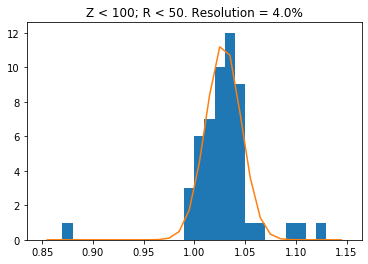

Attempting to fit a Gaussian with guess (A0, m0, s0) = (37.0, 1, 0.11480693454130066)


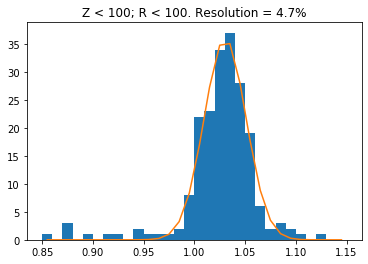

Attempting to fit a Gaussian with guess (A0, m0, s0) = (79.0, 1, 0.1358963908958385)


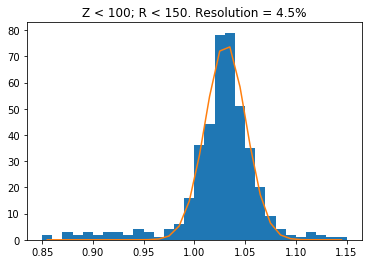

Attempting to fit a Gaussian with guess (A0, m0, s0) = (107.0, 1, 0.13460109595702593)


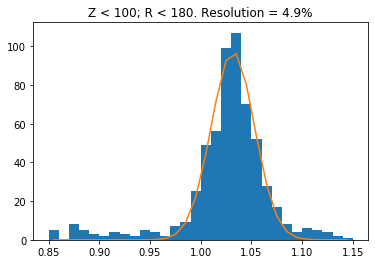

Attempting to fit a Gaussian with guess (A0, m0, s0) = (21.0, 1, 0.13535812389835644)


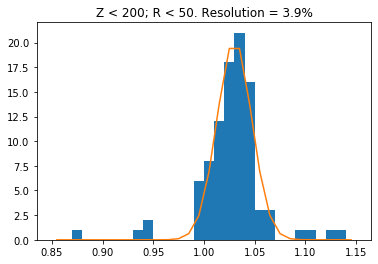

Attempting to fit a Gaussian with guess (A0, m0, s0) = (77.0, 1, 0.10458059653215569)


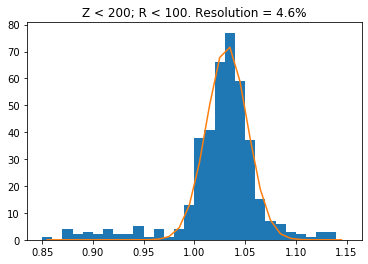

Attempting to fit a Gaussian with guess (A0, m0, s0) = (166.0, 1, 0.12579508290431352)


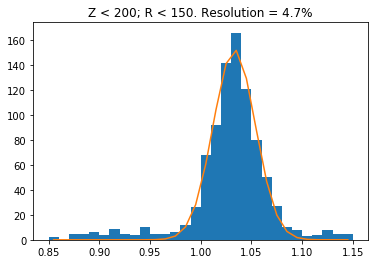

Attempting to fit a Gaussian with guess (A0, m0, s0) = (213.0, 1, 0.1343669850983412)


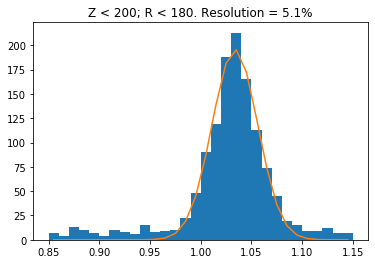

Attempting to fit a Gaussian with guess (A0, m0, s0) = (32.0, 1, 0.12537355537217323)


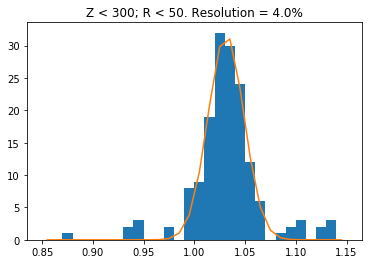

Attempting to fit a Gaussian with guess (A0, m0, s0) = (110.0, 1, 0.10734796693912355)


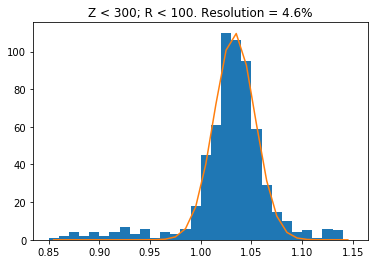

Attempting to fit a Gaussian with guess (A0, m0, s0) = (235.0, 1, 0.12236854860736379)


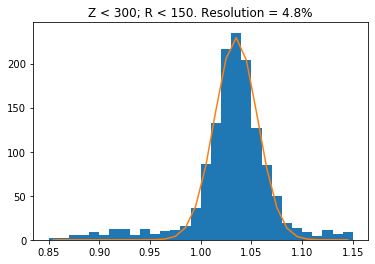

Attempting to fit a Gaussian with guess (A0, m0, s0) = (305.0, 1, 0.13322883101528)


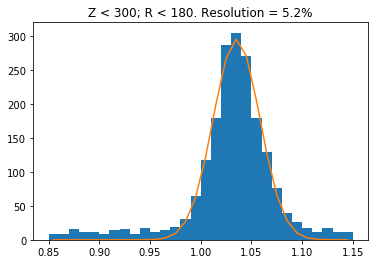

Attempting to fit a Gaussian with guess (A0, m0, s0) = (39.0, 1, 0.11330579897265682)


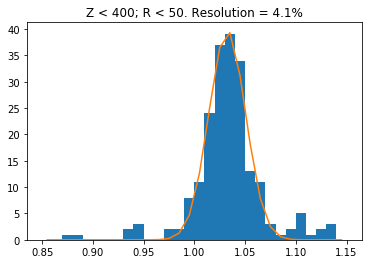

Attempting to fit a Gaussian with guess (A0, m0, s0) = (141.0, 1, 0.10535508215491908)


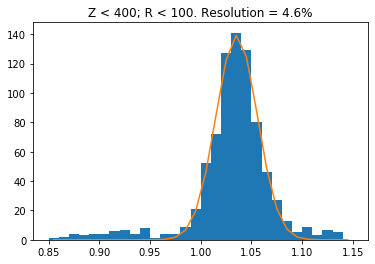

Attempting to fit a Gaussian with guess (A0, m0, s0) = (305.0, 1, 0.1210635639578361)


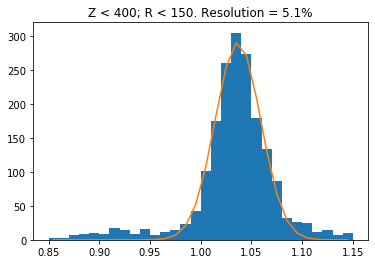

Attempting to fit a Gaussian with guess (A0, m0, s0) = (399.0, 1, 0.13199083991615831)


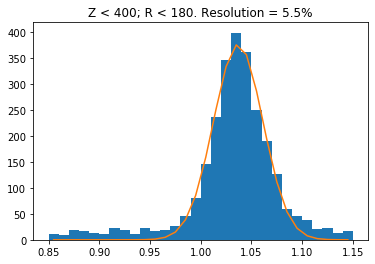

Attempting to fit a Gaussian with guess (A0, m0, s0) = (45.0, 1, 0.11037273155131591)


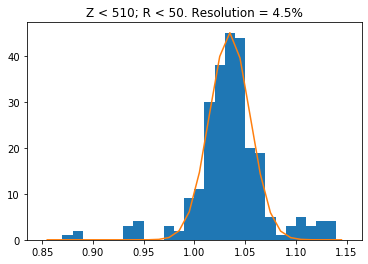

Attempting to fit a Gaussian with guess (A0, m0, s0) = (165.0, 1, 0.10871516439531718)


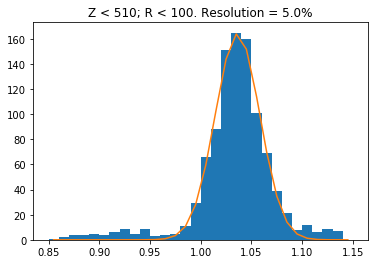

Attempting to fit a Gaussian with guess (A0, m0, s0) = (355.0, 1, 0.11605880940786649)


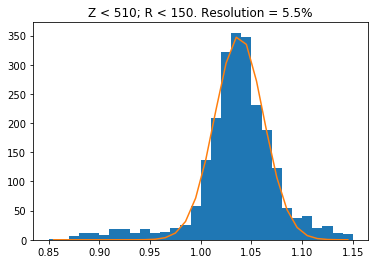

Attempting to fit a Gaussian with guess (A0, m0, s0) = (475.0, 1, 0.12790780238324376)


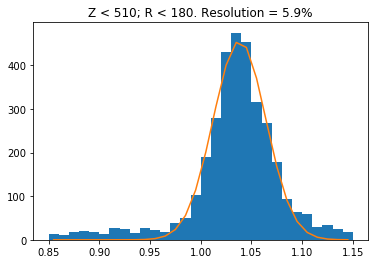

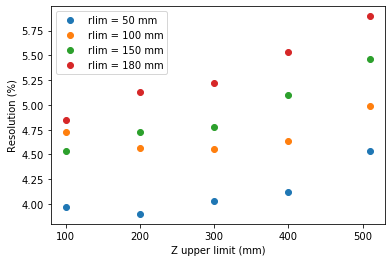

Best resolution =  3.9 %


In [160]:
# Correct energy and examine resolution using self generated correction map, *with* lifetime correction
scaled_energy_lt = correct_energies(energy_xy, energy_xy_bounds, umask = selfmask, ltmap = self_ltmap)
selflt_res_vs_zr = fit_res_vs_zr(scaled_energy_lt, energy_xy, energy_xy_bounds, umask = selfmask)
plot_res_vs_zr(selflt_res_vs_zr)

{100050: 0.6, 100100: 0.17, 100150: 0.144, 100180: 0.039, 200050: 0.668, 200100: 0.189, 200150: -0.063, 200180: 0.007, 300050: 0.903, 300100: 0.465, 300150: 0.16, 300180: 0.174, 400050: 1.03, 400100: 0.494, 400150: 0.183, 400180: 0.163, 510050: 0.758, 510100: 0.646, 510150: 0.288, 510180: 0.296}


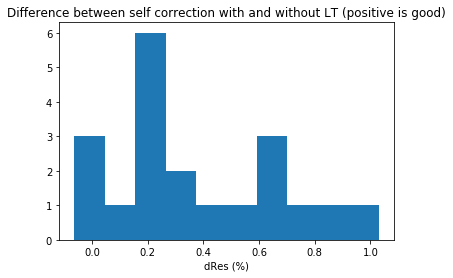

In [161]:
lt_impact = {}
for key in self_res_vs_zr.keys():
    lt_impact[key] = round(self_res_vs_zr[key] - selflt_res_vs_zr[key], 3)
print(lt_impact)

plt.hist(lt_impact.values())
plt.title('Difference between self correction with and without LT (positive is good)')
plt.xlabel('dRes (%)')
plt.show()

## SiPM correction map (for more accurate position determination)

In [162]:
# For each SiPM, determine the mean energy in that SiPM for good Kr events which are located at that position
general_mask = prewindow_mask & selfmask

all_energies_by_sipm = [[] for i in range(nsipms)]
events_maxsipm_subtracted_masked = events_maxsipm_subtracted[general_mask]
events_sum_sipms_subtracted_masked = events_sum_sipms_subtracted[general_mask]
for e in range(len(events_maxsipm_subtracted[general_mask])):
    sipm = events_maxsipm_subtracted_masked[e]
    top_energy = events_sum_sipms_subtracted_masked[e][sipm]
    all_energies_by_sipm[sipm].append(top_energy)

for sipm in range(len(all_energies_by_sipm)):
    if len(all_energies_by_sipm[sipm]) == 0:
        all_energies_by_sipm[sipm].append(0)

In [163]:
mean_sipm_energy = np.array([ np.mean(all_energies_by_sipm[i]) for i in range(len(all_energies_by_sipm)) ])
mean_sipm_energy_correction = []
for sipm in range(nsipms):
    corr = mean_sipm_energy[sipm]
    if corr > 0:
        mean_sipm_energy_correction.append(1/corr)
    else:
        mean_sipm_energy_correction.append(0)
mean_sipm_energy_correction = np.array(mean_sipm_energy_correction)

In [164]:
redges = np.linspace(0, 200, 20+1)
rbins = [ (redges[i], redges[i+1]) for i in range(len(redges) - 1)]
mean_energy_vs_rbin = []
for rbin in rbins:
    energy = 0
    n = 0
    for sipm in range(nsipms):
        if rbin[0]**2 <= DataSiPM.X[sipm]**2 + DataSiPM.Y[sipm]**2 < rbin[1]**2:
            energy += mean_sipm_energy[sipm]
            n += 1
    mean_energy_vs_rbin.append(energy / n)

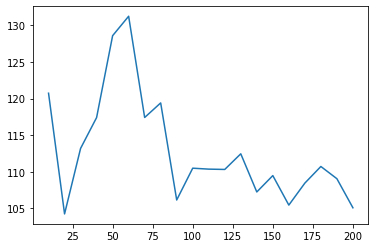

In [165]:
plt.plot(redges[1:], mean_energy_vs_rbin)
plt.show()

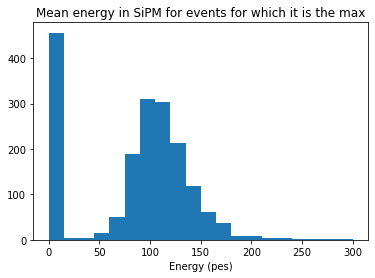

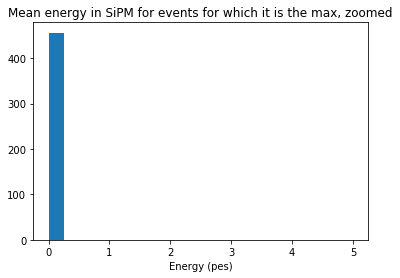

In [166]:
plt.hist(mean_sipm_energy, range = (0, 300), bins = 20)
plt.title('Mean energy in SiPM for events for which it is the max')
plt.xlabel('Energy (pes)')
plt.show()

plt.hist(mean_sipm_energy, range = (0, 5), bins = 20)
plt.title('Mean energy in SiPM for events for which it is the max, zoomed')
plt.xlabel('Energy (pes)')
plt.show()

In [167]:
sum(mean_sipm_energy == 0)

456

In [168]:
zeroed_sipms = []
for i in range(nsipms):
    if mean_sipm_energy[i] == 0:
        zeroed_sipms.append(i)

In [169]:
print(zeroed_sipms)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 36, 37, 38, 39, 45, 46, 47, 55, 60, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 91, 95, 123, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 157, 158, 159, 160, 161, 162, 163, 168, 169, 184, 193, 194, 195, 196, 197, 198, 199, 202, 203, 204, 205, 206, 207, 211, 212, 213, 214, 215, 220, 221, 223, 229, 230, 231, 238, 239, 246, 247, 255, 357, 422, 440, 448, 449, 450, 451, 452, 453, 456, 457, 458, 459, 461, 464, 465, 466, 467, 472, 473, 474, 475, 480, 481, 482, 488, 489, 496, 504, 515, 516, 517, 518, 519, 523, 524, 525, 526, 527, 531, 533, 534, 535, 540, 541, 542, 543, 548, 549, 550, 556, 557, 558, 559, 564, 565, 566, 567, 572, 573, 574, 575, 613, 649, 695, 707, 736, 790, 831, 832, 833, 834, 835, 836, 840, 841, 842, 848, 849, 85

In [170]:
for sipm in zeroed_sipms:
    print(sipm, 'located at', DataSiPM.X[sipm], ',', DataSiPM.Y[sipm])

0 located at -235.0 , 45.0
1 located at -235.0 , 55.0
2 located at -235.0 , 65.0
3 located at -235.0 , 75.0
4 located at -235.0 , 85.0
5 located at -235.0 , 95.0
6 located at -235.0 , 105.0
7 located at -235.0 , 115.0
8 located at -225.0 , 45.0
9 located at -225.0 , 55.0
10 located at -225.0 , 65.0
11 located at -225.0 , 75.0
12 located at -225.0 , 85.0
13 located at -225.0 , 95.0
14 located at -225.0 , 105.0
15 located at -225.0 , 115.0
16 located at -215.0 , 45.0
17 located at -215.0 , 55.0
18 located at -215.0 , 65.0
19 located at -215.0 , 75.0
20 located at -215.0 , 85.0
21 located at -215.0 , 95.0
22 located at -215.0 , 105.0
23 located at -215.0 , 115.0
24 located at -205.0 , 45.0
25 located at -205.0 , 55.0
26 located at -205.0 , 65.0
27 located at -205.0 , 75.0
28 located at -205.0 , 85.0
29 located at -205.0 , 95.0
30 located at -205.0 , 105.0
31 located at -205.0 , 115.0
35 located at -195.0 , 75.0
36 located at -195.0 , 85.0
37 located at -195.0 , 95.0
38 located at -195.0 ,

1569 located at 125.0 , -185.0
1570 located at 125.0 , -175.0
1572 located at 125.0 , -155.0
1576 located at 135.0 , -195.0
1577 located at 135.0 , -185.0
1578 located at 135.0 , -175.0
1580 located at 135.0 , -155.0
1584 located at 145.0 , -195.0
1585 located at 145.0 , -185.0
1586 located at 145.0 , -175.0
1587 located at 145.0 , -165.0
1588 located at 145.0 , -155.0
1592 located at 155.0 , -195.0
1593 located at 155.0 , -185.0
1594 located at 155.0 , -175.0
1595 located at 155.0 , -165.0
1596 located at 155.0 , -155.0
1597 located at 155.0 , -145.0
1615 located at 175.0 , 115.0
1621 located at 185.0 , 95.0
1622 located at 185.0 , 105.0
1623 located at 185.0 , 115.0
1627 located at 195.0 , 75.0
1628 located at 195.0 , 85.0
1629 located at 195.0 , 95.0
1630 located at 195.0 , 105.0
1631 located at 195.0 , 115.0
1632 located at 205.0 , 45.0
1633 located at 205.0 , 55.0
1634 located at 205.0 , 65.0
1635 located at 205.0 , 75.0
1636 located at 205.0 , 85.0
1637 located at 205.0 , 95.0
16

In [171]:
events_max_sipms_subtracted_sipmcorrected = []
for e in range(len(events_sum_sipms_subtracted)):
    sipm_corr = events_sum_sipms_subtracted[e] * mean_sipm_energy_correction
    sipm_max = np.argmax(sipm_corr)
    events_max_sipms_subtracted_sipmcorrected.append(sipm_max)

In [172]:
changed = 1 - np.sum(events_max_sipms_subtracted_sipmcorrected == events_maxsipm_subtracted)/len(events_maxsipm_subtracted)
print('Percent of events at new positions =', round(100 * changed, 1))

Percent of events at new positions = 53.2


In [173]:
all_Xs_sub_sipmcorr = np.array([DataSiPM.X[sipm] for sipm in events_max_sipms_subtracted_sipmcorrected])
all_Ys_sub_sipmcorr = np.array([DataSiPM.Y[sipm] for sipm in events_max_sipms_subtracted_sipmcorrected])

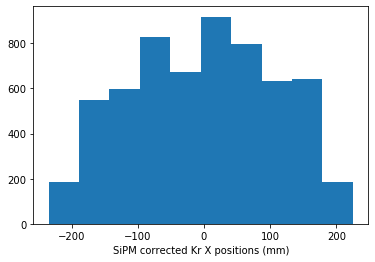

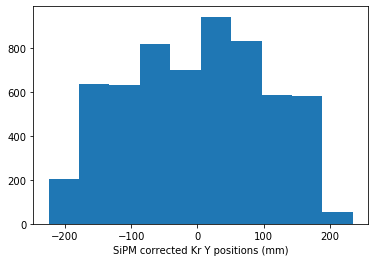

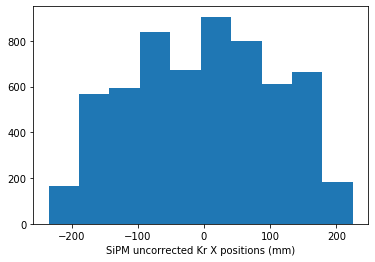

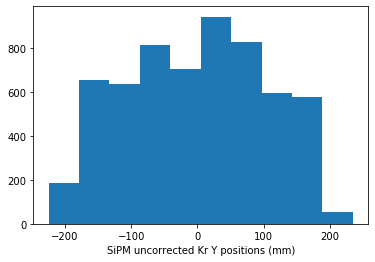

In [174]:
plt.hist(all_Xs_sub_sipmcorr[general_mask])
plt.xlabel('SiPM corrected Kr X positions (mm)')
plt.show()

plt.hist(all_Ys_sub_sipmcorr[general_mask])
plt.xlabel('SiPM corrected Kr Y positions (mm)')
plt.show()

plt.hist(events_X_sipm_subtracted[general_mask])
plt.xlabel('SiPM uncorrected Kr X positions (mm)')
plt.show()

plt.hist(events_Y_sipm_subtracted[general_mask])
plt.xlabel('SiPM uncorrected Kr Y positions (mm)')
plt.show()

## Check out impact of reducing size of SiPM vectors by only storing those that are nonzero

In [175]:
sum(events_sum_sipms_subtracted[0] > 0)

125

In [176]:
events_sum_sipms_subtracted_dict = []
for e in range(len(events_sum_sipms_subtracted)):
    if e % 1000 == 0:
        print(e)
    sum_sipms_subtracted_dict = {}
    for sipm in range(len(events_sum_sipms_subtracted[e])):
        if events_sum_sipms_subtracted[e][sipm] > 0:
            sum_sipms_subtracted_dict[sipm] = events_sum_sipms_subtracted[e][sipm]
    events_sum_sipms_subtracted_dict.append(sum_sipms_subtracted_dict)

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000


In [177]:
round(get_size(events_sum_sipms_subtracted_dict) / 1000000, 1)

454.8

In [178]:
events_sum_sipms_subtracted_dict = []

In [179]:
print('Current time =', round((time() - t0)/60, 1), 'm')

Current time = 71.3 m


## Amount of light in ring of given radius from event radius

In [ ]:
# localit_gravity_x, localit_gravity_y

In [315]:
rings = [100, 75, 50, 25]

In [316]:
tstart = time()
centerps = np.array([[localit_gravity_x], [localit_gravity_y]]).T
sipmrings = np.array([ np.zeros((len(localit_gravity_x), len(sipmps))) for ring in rings ])

for r in range(len(rings)):
    print('Working on r = ', rings[r], '; time =', round(time() - tstart, 1))
    rlim = rings[r]
    for e in range(len(centerps)):
        if e % 5000 == 0:
            print('\tWorking on e = ', e, '; time =', round(time() - tstart, 1))
        for sipm in range(nsipms):
            if events_sum_sipms_subtracted_zeroed[e][sipm] > 0:
                if r == 0:
                    sipmrings[r][e][sipm] = np.int(np.linalg.norm(sipmps[sipm] - centerps[e]) < rlim)
                if r > 0:
                    if sipmrings[r-1][e][sipm] == 1:
                        sipmrings[r][e][sipm] = np.int(np.linalg.norm(sipmps[sipm] - centerps[e]) < rlim)

Working on r =  100 ; time = 5.5
	Working on e =  0 ; time = 5.5
	Working on e =  5000 ; time = 31.4
	Working on e =  10000 ; time = 60.5
	Working on e =  15000 ; time = 83.1
	Working on e =  20000 ; time = 105.1
	Working on e =  25000 ; time = 128.1
	Working on e =  30000 ; time = 152.4
Working on r =  75 ; time = 172.3
	Working on e =  0 ; time = 172.3
	Working on e =  5000 ; time = 198.2
	Working on e =  10000 ; time = 222.4
	Working on e =  15000 ; time = 241.3
	Working on e =  20000 ; time = 254.0
	Working on e =  25000 ; time = 268.1
	Working on e =  30000 ; time = 281.8
Working on r =  50 ; time = 300.0
	Working on e =  0 ; time = 300.0
	Working on e =  5000 ; time = 313.7
	Working on e =  10000 ; time = 327.2
	Working on e =  15000 ; time = 339.3
	Working on e =  20000 ; time = 353.6
	Working on e =  25000 ; time = 366.1
	Working on e =  30000 ; time = 382.0
Working on r =  25 ; time = 392.1
	Working on e =  0 ; time = 392.1
	Working on e =  5000 ; time = 409.4
	Working on e = 

In [318]:
for r in range(len(rings)):
    nsipm_v_evt = [ np.sum(evt) for evt in sipmrings[r] ]
    print('In ring', rings[r], 'we see an average of', np.mean(nsipm_v_evt))

In ring 100 we see an average of 31.403009293406107
In ring 75 we see an average of 22.57504056645523
In ring 50 we see an average of 14.381796725180704
In ring 25 we see an average of 6.3097211978167875


In [329]:
wsum_rings  = [ np.array([]) for ring in rings ]
wsum_minusc = [ np.array([]) for ring in rings ]

tstart = time()
for r in range(len(rings)):
    print('Ring', rings[r])
    sipmring = sipmrings[r]
    for sum_sipms_subtracted, sipmnear, sipmcenter in zip(events_sum_sipms_subtracted_zeroed, sipmring, sipmrings[-1]):
        wsum_rings[r]  = np.append(wsum_rings[r], np.sum(sum_sipms_subtracted * sipmnear))
        wsum_minusc[r] = np.append(wsum_minusc[r], np.sum(sum_sipms_subtracted * sipmnear) - np.sum(sum_sipms_subtracted * sipmcenter))
        
print('Time to run loop =', round(time() - tstart,1))

Ring 100
Ring 75
Ring 50
Ring 25
Time to run loop = 24.4


In [333]:
# Plot, for central events, mean energy vs radius

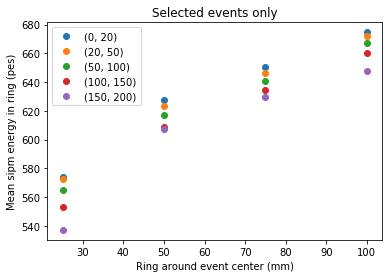

In [327]:
rlims = [ (0, 20), (20, 50), (50, 100), (100, 150), (150, 200)]

for rlim in rlims:
    
    band = ((localit_gravity_x**2 + localit_gravity_y**2) > rlim[0]**2) & ((localit_gravity_x**2 + localit_gravity_y**2) < rlim[1]**2)
    ful = msk & band

    mean_ring_energy = []

    for r in range(len(rings)):
        mean = np.mean(wsum_rings[r][ful])
        mean_ring_energy.append(mean)

    plt.plot(rings, mean_ring_energy, 'o', label=str(rlim))
plt.legend()
plt.title('Selected events only')
plt.xlabel('Ring around event center (mm)')
plt.ylabel('Mean sipm energy in ring (pes)')
plt.show()

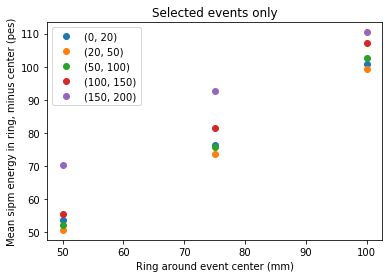

In [332]:
rlims = [ (0, 20), (20, 50), (50, 100), (100, 150), (150, 200)]

for rlim in rlims:
    
    band = ((localit_gravity_x**2 + localit_gravity_y**2) > rlim[0]**2) & ((localit_gravity_x**2 + localit_gravity_y**2) < rlim[1]**2)
    ful = msk & band

    mean_ring_energy = []

    for r in range(len(rings)):
        mean = np.mean(wsum_minusc[r][ful])
        mean_ring_energy.append(mean)

    plt.plot(rings[:-1], mean_ring_energy[:-1], 'o', label=str(rlim))
plt.legend()
plt.title('Selected events only')
plt.xlabel('Ring around event center (mm)')
plt.ylabel('Mean sipm energy in ring, minus center (pes)')
plt.show()